In [60]:
import numpy as np
import scipy.io as io
import cv2
import os
from datetime import date, datetime
%matplotlib inline
import matplotlib.pyplot as plt
from shutil import copy
import glob
import random

In [61]:
def load_data(mat_path):
    d = io.loadmat(mat_path)

    return d["image"], d["gender"][0], d["age"][0], d["db"][0], d["img_size"][0, 0], d["min_score"][0, 0]


In [62]:
def calc_age(taken, dob):
    birth = datetime.fromordinal(max(int(dob) - 366, 1))

    # assume the photo was taken in the middle of the year
    if birth.month < 7:
        return taken - birth.year
    else:
        return taken - birth.year - 1

In [63]:
def get_meta(mat_path, db):
    meta = io.loadmat(mat_path)
    full_paths = meta[db][0, 0]["full_path"][0]
    dobs = meta[db][0, 0]["dob"][0]  # Matlab serial date number
    photo_taken = meta[db][0, 0]["photo_taken"][0]  # year
    face_scores = meta[db][0, 0]["face_score"][0]
    second_face_scores = meta[db][0, 0]["second_face_score"][0]
    ages = [calc_age(photo_taken[i], dobs[i]) for i in range(len(dobs))]
    
    for i in range(len(full_paths)):
        full_paths[i] = full_paths[i][0].split('/')[1]            

    return full_paths, dobs, photo_taken, face_scores, second_face_scores, ages

In [64]:
full_path, dob, photo_taken, face_score, second_face_score, age = get_meta('imdb.mat', 'imdb')

In [7]:
print("#images: {}".format(len(face_score)))
print("#images with inf scores: {}".format(np.isinf(face_score).sum()))

#images: 460723
#images with inf scores: 62302


Text(0.5, 0, 'face score')

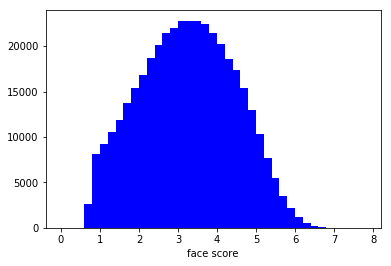

In [8]:
hist = plt.hist(face_score[face_score>0], bins=np.arange(0, 8, 0.2), color='b')
plt.xlabel("face score")

In [9]:
print("#images with second face scores: {}".format((~np.isnan(second_face_score)).sum()))

#images with second face scores: 213797


Text(0.5, 0, 'second face score')

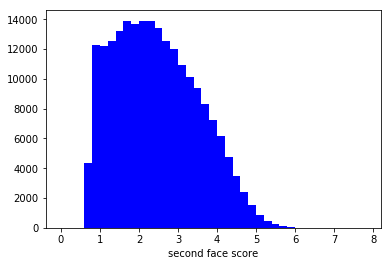

In [10]:
hist = plt.hist(second_face_score[~np.isnan(second_face_score)], bins=np.arange(0, 8, 0.2), color='b')
plt.xlabel("second face score")

In [11]:
cols, rows = 4, 3
img_num = cols * rows
path_root = "{}_crop_resize/".format('imdb')


def show_imgs(img_paths):
    img_ids = np.random.choice(len(img_paths), img_num, replace=False)

    for i, img_id in enumerate(img_ids):
        plt.subplot(rows, cols, i + 1)
        print("path = ", path_root + str(img_paths[img_id]))
        img = cv2.imread(path_root + str(img_paths[img_id]))
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.axis('off')
    
    plt.show()

In [12]:
img_paths = []

for i in range(len(face_score)):
    if face_score[i] < 0.0:
        img_paths.append(full_path[i])

print("#images with scores lower than 0.0: {}".format(len(img_paths)))

#images with scores lower than 0.0: 62302


path =  imdb_crop_resize/nm0000132_rm1892078336_1979-4-12_2011.jpg
path =  imdb_crop_resize/nm1130627_rm3200419840_1982-4-3_2005.jpg
path =  imdb_crop_resize/nm0000523_rm3103820032_1966-6-8_2009.jpg
path =  imdb_crop_resize/nm1872698_rm3459747072_1986-4-30_2009.jpg
path =  imdb_crop_resize/nm0490489_rm4058880256_1961-9-27_2002.jpg
path =  imdb_crop_resize/nm0000555_rm4027289344_1959-11-28_2010.jpg
path =  imdb_crop_resize/nm0616068_rm1940297984_1978-6-21_2003.jpg
path =  imdb_crop_resize/nm1760272_rm3423338240_1980-2-9_2015.jpg
path =  imdb_crop_resize/nm0004802_rm1770035456_1975-6-25_2004.jpg
path =  imdb_crop_resize/nm0001458_rm2487784448_1926-4-30_2005.jpg
path =  imdb_crop_resize/nm0005536_rm763345664_1940-12-12_2004.jpg
path =  imdb_crop_resize/nm0333410_rm3382024704_1978-7-12_2007.jpg


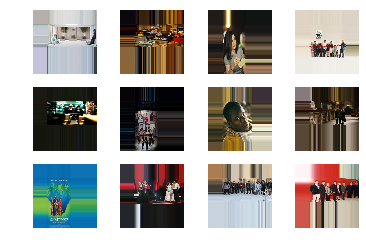

In [13]:
show_imgs(img_paths)

In [14]:
img_paths = []

for i in range(len(face_score)):
    if 0.0 < face_score[i] < 1.0:
        img_paths.append(full_path[i])

print("#images with scores lower than 1.0: {}".format(len(img_paths)))

#images with scores lower than 1.0: 10645


path =  imdb_crop_resize/nm0001710_rm3895581696_1966-11-2_1994.jpg
path =  imdb_crop_resize/nm4129745_rm2662507520_1988-4-13_2013.jpg
path =  imdb_crop_resize/nm0221043_rm1424132096_1976-10-11_2005.jpg
path =  imdb_crop_resize/nm0001580_rm3916339456_1986-6-13_2004.jpg
path =  imdb_crop_resize/nm1106793_rm4140417536_1961-11-16_2011.jpg
path =  imdb_crop_resize/nm0000541_rm1366014464_1945-12-1_1982.jpg
path =  imdb_crop_resize/nm1396022_rm2759571456_1979-6-7_2008.jpg
path =  imdb_crop_resize/nm0006969_rm2645134592_1974-2-10_2008.jpg
path =  imdb_crop_resize/nm0001634_rm3154478080_1952-12-25_1987.jpg
path =  imdb_crop_resize/nm0005283_rm2892595712_1966-10-6_2003.jpg
path =  imdb_crop_resize/nm0733812_rm3208681728_1971-12-5_2006.jpg
path =  imdb_crop_resize/nm0908094_rm1719973888_1973-9-12_2011.jpg


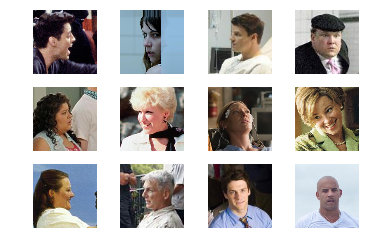

In [15]:
show_imgs(img_paths)

In [16]:
img_paths = []

for i in range(len(face_score)):
    if age[i] > 100:
        img_paths.append(full_path[i])

print("#images with ages greater than 100: {}".format(len(img_paths)))

#images with ages greater than 100: 159


path =  imdb_crop_resize/nm0751470_rm1159958016_0-12-10_1991.jpg
path =  imdb_crop_resize/nm0004624_rm1394516224_0-12-22_2013.jpg
path =  imdb_crop_resize/nm1002664_rm259819776_0-7-31_2010.jpg
path =  imdb_crop_resize/nm1002664_rm1116578048_0-7-31_2012.jpg
path =  imdb_crop_resize/nm1040389_rm3137067776_0-8-8_2010.jpg
path =  imdb_crop_resize/nm2749141_rm2952003072_0-6-23_2015.jpg
path =  imdb_crop_resize/nm0783353_rm2960181248_0-10-2_1993.jpg
path =  imdb_crop_resize/nm0617588_rm3141860096_1861-12-8_1986.jpg
path =  imdb_crop_resize/nm0000370_rm773688064_1901-12-5_2009.jpg
path =  imdb_crop_resize/nm1002664_rm2177019904_0-7-31_2011.jpg
path =  imdb_crop_resize/nm1002664_rm671533824_0-7-31_2013.jpg
path =  imdb_crop_resize/nm0005555_rm2469698304_0-11-18_2005.jpg


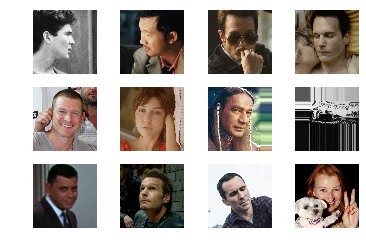

In [17]:
show_imgs(img_paths)

In [18]:
img_paths = []

for i in range(len(face_score)):
    if age[i] < 0.0:
        img_paths.append(full_path[i])

print("#images with scores lower than 0.0: {}".format(len(img_paths)))

#images with scores lower than 0.0: 531


path =  imdb_crop_resize/nm1285162_rm2328921856_1978-10-30_1975.jpg
path =  imdb_crop_resize/nm0005493_rm575781120_1981-1-31_1975.jpg
path =  imdb_crop_resize/nm1285162_rm4107306752_1978-10-30_1975.jpg
path =  imdb_crop_resize/nm0737176_rm995745024_1964-0-0_1961.jpg
path =  imdb_crop_resize/nm1676221_rm1834849280_1978-8-18_1975.jpg
path =  imdb_crop_resize/nm0837177_rm1374792704_1975-9-18_1975.jpg
path =  imdb_crop_resize/nm1676221_rm2889987584_1978-8-18_1975.jpg
path =  imdb_crop_resize/nm0352778_rm693221632_1978-6-7_1975.jpg
path =  imdb_crop_resize/nm0684545_rm1499830784_1967-11-7_1965.jpg
path =  imdb_crop_resize/nm1840659_rm3187978752_1981-11-18_1975.jpg
path =  imdb_crop_resize/nm0837177_rm1282260224_1975-9-18_1975.jpg
path =  imdb_crop_resize/nm0860380_rm1082630144_1978-5-10_1975.jpg


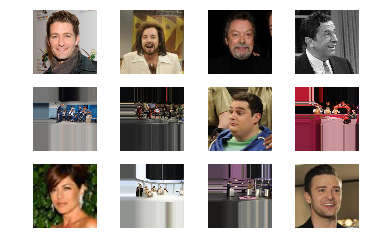

In [19]:
show_imgs(img_paths)

In [20]:
img_paths = []

for i in range(len(face_score)):
    if ~np.isnan(second_face_score[i]):
        img_paths.append(full_path[i])

print("#images with scores lower than 0.0: {}".format(len(img_paths)))

#images with scores lower than 0.0: 213797


path =  imdb_crop_resize/nm0000201_rm2280096000_1958-4-29_2000.jpg
path =  imdb_crop_resize/nm0690186_rm1432978944_1969-11-10_2005.jpg
path =  imdb_crop_resize/nm0449466_rm2306185728_1976-9-5_2002.jpg
path =  imdb_crop_resize/nm0591053_rm4158701056_1958-5-27_1998.jpg
path =  imdb_crop_resize/nm2100081_rm807448576_1989-7-12_2011.jpg
path =  imdb_crop_resize/nm0000178_rm2143394560_1965-1-22_2005.jpg
path =  imdb_crop_resize/nm0369513_rm1290180864_1975-3-22_2004.jpg
path =  imdb_crop_resize/nm0061877_rm1361230848_1966-11-26_2008.jpg
path =  imdb_crop_resize/nm0182839_rm258456576_1975-9-30_2011.jpg
path =  imdb_crop_resize/nm0567653_rm2598145792_1970-7-3_2007.jpg
path =  imdb_crop_resize/nm1710309_rm1921955584_1990-3-13_2012.jpg
path =  imdb_crop_resize/nm0003909_rm3310847488_1931-5-24_2010.jpg


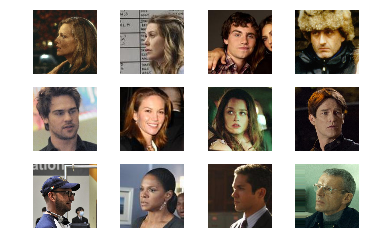

In [21]:
show_imgs(img_paths)

In [24]:
def filter_images(full_path, face_score, second_face_score, age):
    paths_out = []
    ages_out = []

    for i in range(len(full_path)):
        if age[i] >= 0.0 and age[i] <= 100.0 and face_score[i] > 1.0 and np.isnan(second_face_score[i]):
            paths_out.append(full_path[i])
            ages_out.append(age[i])
    return paths_out, ages_out

In [25]:
paths, ages = filter_images(full_path, face_score, second_face_score, age)

In [26]:
print(len(paths))

174632


In [27]:
unique_ages = np.unique(np.array(ages))

In [28]:
unique_ages

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
       68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84,
       85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98])

Text(0.5, 0, 'ages')

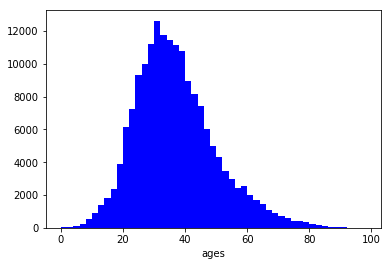

In [29]:
hist = plt.hist(ages, bins=np.arange(0, 100, 2), color='b')
plt.xlabel("ages")

In [30]:
np.histogram(ages, np.arange(100))

(array([   5,   33,   49,    8,   27,   59,   98,  160,  236,  284,  353,
         573,  609,  769,  837,  973, 1045, 1299, 1606, 2272, 2976, 3182,
        3404, 3839, 4663, 4681, 4984, 4991, 5384, 5835, 6264, 6362, 5991,
        5788, 5557, 5875, 5770, 5386, 5520, 5279, 4392, 4571, 4177, 3954,
        3450, 3954, 3130, 2898, 2543, 2432, 2164, 2146, 1873, 1607, 1696,
        1307, 1233, 1209, 1298, 1226, 1084,  909,  838,  867,  735,  741,
         489,  567,  440,  480,  379,  340,  344,  277,  234,  206,  227,
         184,  154,  174,  118,  105,   86,   61,   71,   52,   28,   51,
          30,   14,   27,    1,    7,   10,    6,    1,    5,    1,    3]),
 array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
        51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
        68, 69, 70, 71, 72, 

In [ ]:
images_input_dir = "imdb_crop_resize/"
images_dir = "imdb_classes"


if not os.path.exists(images_dir):
    os.makedirs(images_dir)
if not os.path.exists(train_dir):
    os.makedirs(train_dir)
if not os.path.exists(val_dir):
    os.makedirs(val_dir)

for i in range (0, 100):
    dir_name = os.path.join(images_dir, str(i))
    if not os.path.exists(dir_name):
        os.makedirs(dir_name)
        
for i in range(len(paths)):
    dir_name = os.path.join(images_dir, str(ages[i]))
    print ("copying file " + paths[i] + " with age " + str(ages[i]) + " to " + dir_name)
    copy(os.path.join(images_input_dir, paths[i]), dir_name)

copying file nm0000001_rm946909184_1899-5-10_1968.jpg with age 69 to imdb_classes/69
copying file nm0000001_rm980463616_1899-5-10_1968.jpg with age 69 to imdb_classes/69
copying file nm0000002_rm1346607872_1924-9-16_2004.jpg with age 79 to imdb_classes/79
copying file nm0000002_rm1363385088_1924-9-16_2004.jpg with age 79 to imdb_classes/79
copying file nm0000002_rm221957120_1924-9-16_1974.jpg with age 49 to imdb_classes/49
copying file nm0000002_rm2287049216_1924-9-16_2007.jpg with age 82 to imdb_classes/82
copying file nm0000002_rm238734336_1924-9-16_1974.jpg with age 49 to imdb_classes/49
copying file nm0000002_rm2585828096_1924-9-16_2006.jpg with age 81 to imdb_classes/81
copying file nm0000002_rm2769394176_1924-9-16_2006.jpg with age 81 to imdb_classes/81
copying file nm0000002_rm2780403712_1924-9-16_2004.jpg with age 79 to imdb_classes/79
copying file nm0000002_rm2983566080_1924-9-16_2007.jpg with age 82 to imdb_classes/82
copying file nm0000002_rm3453524224_1924-9-16_2007.jpg wit

copying file nm0000093_rm130390016_1963-12-18_1999.jpg with age 35 to imdb_classes/35
copying file nm0000093_rm1331804416_1963-12-18_2011.jpg with age 47 to imdb_classes/47
copying file nm0000093_rm1335401216_1963-12-18_2002.jpg with age 38 to imdb_classes/38
copying file nm0000093_rm1339529216_1963-12-18_2008.jpg with age 44 to imdb_classes/44
copying file nm0000093_rm1345690112_1963-12-18_2004.jpg with age 40 to imdb_classes/40
copying file nm0000093_rm1348969472_1963-12-18_2013.jpg with age 49 to imdb_classes/49
copying file nm0000093_rm1356960768_1963-12-18_2008.jpg with age 44 to imdb_classes/44
copying file nm0000093_rm1362467328_1963-12-18_2004.jpg with age 40 to imdb_classes/40
copying file nm0000093_rm1383987712_1963-12-18_2014.jpg with age 50 to imdb_classes/50
copying file nm0000093_rm1442366720_1963-12-18_2014.jpg with age 50 to imdb_classes/50
copying file nm0000093_rm1451002368_1963-12-18_2009.jpg with age 45 to imdb_classes/45
copying file nm0000093_rm1451096576_1963-12-

copying file nm0000098_rm793218816_1969-2-11_2010.jpg with age 41 to imdb_classes/41
copying file nm0000098_rm79664128_1969-2-11_2008.jpg with age 39 to imdb_classes/39
copying file nm0000098_rm8030464_1969-2-11_2009.jpg with age 40 to imdb_classes/40
copying file nm0000098_rm82304256_1969-2-11_1994.jpg with age 25 to imdb_classes/25
copying file nm0000098_rm832801280_1969-2-11_2008.jpg with age 39 to imdb_classes/39
copying file nm0000098_rm849578496_1969-2-11_2008.jpg with age 39 to imdb_classes/39
copying file nm0000098_rm859757568_1969-2-11_1994.jpg with age 25 to imdb_classes/25
copying file nm0000098_rm867077120_1969-2-11_2005.jpg with age 36 to imdb_classes/36
copying file nm0000098_rm872013056_1969-2-11_1994.jpg with age 25 to imdb_classes/25
copying file nm0000098_rm87529472_1969-2-11_1998.jpg with age 29 to imdb_classes/29
copying file nm0000098_rm876534784_1969-2-11_1994.jpg with age 25 to imdb_classes/25
copying file nm0000098_rm883132928_1969-2-11_2008.jpg with age 39 to i

copying file nm0000107_rm2858471424_1953-12-8_2013.jpg with age 59 to imdb_classes/59
copying file nm0000107_rm2863368704_1953-12-8_2008.jpg with age 54 to imdb_classes/54
copying file nm0000107_rm2880145920_1953-12-8_2008.jpg with age 54 to imdb_classes/54
copying file nm0000107_rm2896923136_1953-12-8_2008.jpg with age 54 to imdb_classes/54
copying file nm0000107_rm2913700352_1953-12-8_2008.jpg with age 54 to imdb_classes/54
copying file nm0000107_rm2986181888_1953-12-8_1984.jpg with age 30 to imdb_classes/30
copying file nm0000107_rm303795712_1953-12-8_2000.jpg with age 46 to imdb_classes/46
copying file nm0000107_rm304385536_1953-12-8_1991.jpg with age 37 to imdb_classes/37
copying file nm0000107_rm3186263808_1953-12-8_1997.jpg with age 43 to imdb_classes/43
copying file nm0000107_rm334674432_1953-12-8_2004.jpg with age 50 to imdb_classes/50
copying file nm0000107_rm3359084032_1953-12-8_1988.jpg with age 34 to imdb_classes/34
copying file nm0000107_rm337350144_1953-12-8_2000.jpg wit

copying file nm0000115_rm3508845312_1964-1-7_2002.jpg with age 38 to imdb_classes/38
copying file nm0000115_rm355113216_1964-1-7_1999.jpg with age 35 to imdb_classes/35
copying file nm0000115_rm3626285824_1964-1-7_2002.jpg with age 38 to imdb_classes/38
copying file nm0000115_rm3645152000_1964-1-7_1998.jpg with age 34 to imdb_classes/34
copying file nm0000115_rm3659840256_1964-1-7_2002.jpg with age 38 to imdb_classes/38
copying file nm0000115_rm3661929216_1964-1-7_1998.jpg with age 34 to imdb_classes/34
copying file nm0000115_rm3711353088_1964-1-7_2014.jpg with age 50 to imdb_classes/50
copying file nm0000115_rm3744569088_1964-1-7_2009.jpg with age 45 to imdb_classes/45
copying file nm0000115_rm3763194368_1964-1-7_2013.jpg with age 49 to imdb_classes/49
copying file nm0000115_rm3784081664_1964-1-7_1984.jpg with age 20 to imdb_classes/20
copying file nm0000115_rm3822761472_1964-1-7_2011.jpg with age 47 to imdb_classes/47
copying file nm0000115_rm3842938880_1964-1-7_2001.jpg with age 37 

copying file nm0000125_rm307528960_1930-8-25_1963.jpg with age 32 to imdb_classes/32
copying file nm0000125_rm3203512832_1930-8-25_1988.jpg with age 57 to imdb_classes/57
copying file nm0000125_rm3234118400_1930-8-25_1983.jpg with age 52 to imdb_classes/52
copying file nm0000125_rm323983616_1930-8-25_1996.jpg with age 65 to imdb_classes/65
copying file nm0000125_rm3242375936_1930-8-25_1965.jpg with age 34 to imdb_classes/34
copying file nm0000125_rm3385113344_1930-8-25_1983.jpg with age 52 to imdb_classes/52
copying file nm0000125_rm3418667776_1930-8-25_1983.jpg with age 52 to imdb_classes/52
copying file nm0000125_rm3485776640_1930-8-25_1983.jpg with age 52 to imdb_classes/52
copying file nm0000125_rm3569662720_1930-8-25_1983.jpg with age 52 to imdb_classes/52
copying file nm0000125_rm357860608_1930-8-25_1963.jpg with age 32 to imdb_classes/32
copying file nm0000125_rm3643770112_1930-8-25_1978.jpg with age 47 to imdb_classes/47
copying file nm0000125_rm3658583552_1930-8-25_2000.jpg wi

copying file nm0000131_rm3308820480_1966-6-28_2003.jpg with age 37 to imdb_classes/37
copying file nm0000131_rm3318271744_1966-6-28_2014.jpg with age 48 to imdb_classes/48
copying file nm0000131_rm3342506752_1966-6-28_2007.jpg with age 41 to imdb_classes/41
copying file nm0000131_rm3358890752_1966-6-28_2002.jpg with age 36 to imdb_classes/36
copying file nm0000131_rm3364933120_1966-6-28_1985.jpg with age 19 to imdb_classes/19
copying file nm0000131_rm3373960704_1966-6-28_1999.jpg with age 33 to imdb_classes/33
copying file nm0000131_rm3381710336_1966-6-28_1985.jpg with age 19 to imdb_classes/19
copying file nm0000131_rm3415264768_1966-6-28_1985.jpg with age 19 to imdb_classes/19
copying file nm0000131_rm3415848192_1966-6-28_2012.jpg with age 46 to imdb_classes/46
copying file nm0000131_rm3458842112_1966-6-28_2012.jpg with age 46 to imdb_classes/46
copying file nm0000131_rm3465984000_1966-6-28_1985.jpg with age 19 to imdb_classes/19
copying file nm0000131_rm3498941184_1966-6-28_2002.jpg

copying file nm0000137_rm185370368_1956-11-20_1995.jpg with age 38 to imdb_classes/38
copying file nm0000137_rm1939177984_1956-11-20_2010.jpg with age 53 to imdb_classes/53
copying file nm0000137_rm194694656_1956-11-20_1979.jpg with age 22 to imdb_classes/22
copying file nm0000137_rm1955955200_1956-11-20_2010.jpg with age 53 to imdb_classes/53
copying file nm0000137_rm1972732416_1956-11-20_2010.jpg with age 53 to imdb_classes/53
copying file nm0000137_rm2284040192_1956-11-20_1981.jpg with age 24 to imdb_classes/24
copying file nm0000137_rm2502144000_1956-11-20_1981.jpg with age 24 to imdb_classes/24
copying file nm0000137_rm2518921216_1956-11-20_1981.jpg with age 24 to imdb_classes/24
copying file nm0000137_rm2535698432_1956-11-20_1981.jpg with age 24 to imdb_classes/24
copying file nm0000137_rm312331776_1956-11-20_1981.jpg with age 24 to imdb_classes/24
copying file nm0000137_rm3460799232_1956-11-20_2002.jpg with age 45 to imdb_classes/45
copying file nm0000137_rm3553007616_1956-11-20

copying file nm0000140_rm3733038848_1944-9-25_2013.jpg with age 68 to imdb_classes/68
copying file nm0000140_rm3787692288_1944-9-25_2001.jpg with age 56 to imdb_classes/56
copying file nm0000140_rm3871578368_1944-9-25_2001.jpg with age 56 to imdb_classes/56
copying file nm0000140_rm3896106240_1944-9-25_2013.jpg with age 68 to imdb_classes/68
copying file nm0000140_rm392547840_1944-9-25_2000.jpg with age 55 to imdb_classes/55
copying file nm0000140_rm3963215104_1944-9-25_2013.jpg with age 68 to imdb_classes/68
copying file nm0000140_rm4028012544_1944-9-25_2003.jpg with age 58 to imdb_classes/58
copying file nm0000140_rm4030323968_1944-9-25_2013.jpg with age 68 to imdb_classes/68
copying file nm0000140_rm4044789760_1944-9-25_2003.jpg with age 58 to imdb_classes/58
copying file nm0000140_rm4046687744_1944-9-25_1985.jpg with age 40 to imdb_classes/40
copying file nm0000140_rm4060512512_1944-9-25_2010.jpg with age 65 to imdb_classes/65
copying file nm0000140_rm4063878400_1944-9-25_2013.jpg 

copying file nm0000146_rm483170304_1962-12-22_2005.jpg with age 42 to imdb_classes/42
copying file nm0000146_rm489396480_1962-12-22_2007.jpg with age 44 to imdb_classes/44
copying file nm0000146_rm489868288_1962-12-22_1995.jpg with age 32 to imdb_classes/32
copying file nm0000146_rm496599808_1962-12-22_2010.jpg with age 47 to imdb_classes/47
copying file nm0000146_rm499103232_1962-12-22_2012.jpg with age 49 to imdb_classes/49
copying file nm0000146_rm508397312_1962-12-22_2010.jpg with age 47 to imdb_classes/47
copying file nm0000146_rm513377024_1962-12-22_2010.jpg with age 47 to imdb_classes/47
copying file nm0000146_rm530547712_1962-12-22_2008.jpg with age 45 to imdb_classes/45
copying file nm0000146_rm548705280_1962-12-22_2006.jpg with age 43 to imdb_classes/43
copying file nm0000146_rm615815936_1962-12-22_2002.jpg with age 39 to imdb_classes/39
copying file nm0000146_rm632593152_1962-12-22_2002.jpg with age 39 to imdb_classes/39
copying file nm0000146_rm702004736_1962-12-22_2011.jpg

copying file nm0000151_rm3026947584_1937-6-1_2009.jpg with age 72 to imdb_classes/72
copying file nm0000151_rm3032521472_1937-6-1_2002.jpg with age 65 to imdb_classes/65
copying file nm0000151_rm3049298688_1937-6-1_2002.jpg with age 65 to imdb_classes/65
copying file nm0000151_rm3064502272_1937-6-1_2006.jpg with age 69 to imdb_classes/69
copying file nm0000151_rm3082660608_1937-6-1_2012.jpg with age 75 to imdb_classes/75
copying file nm0000151_rm3110049792_1937-6-1_2007.jpg with age 70 to imdb_classes/70
copying file nm0000151_rm3132725248_1937-6-1_2005.jpg with age 68 to imdb_classes/68
copying file nm0000151_rm3143604224_1937-6-1_2007.jpg with age 70 to imdb_classes/70
copying file nm0000151_rm3161165312_1937-6-1_2009.jpg with age 72 to imdb_classes/72
copying file nm0000151_rm3181161216_1937-6-1_2012.jpg with age 75 to imdb_classes/75
copying file nm0000151_rm3203697664_1937-6-1_2004.jpg with age 67 to imdb_classes/67
copying file nm0000151_rm3288572672_1937-6-1_2013.jpg with age 76

copying file nm0000158_rm2811144448_1956-7-9_2012.jpg with age 55 to imdb_classes/55
copying file nm0000158_rm2819467520_1956-7-9_2012.jpg with age 55 to imdb_classes/55
copying file nm0000158_rm2826231552_1956-7-9_2013.jpg with age 56 to imdb_classes/56
copying file nm0000158_rm2843008768_1956-7-9_2013.jpg with age 56 to imdb_classes/56
copying file nm0000158_rm2859785984_1956-7-9_2013.jpg with age 56 to imdb_classes/56
copying file nm0000158_rm2866060032_1956-7-9_2006.jpg with age 49 to imdb_classes/49
copying file nm0000158_rm2876563200_1956-7-9_2013.jpg with age 56 to imdb_classes/56
copying file nm0000158_rm2882837248_1956-7-9_2006.jpg with age 49 to imdb_classes/49
copying file nm0000158_rm2891877888_1956-7-9_1984.jpg with age 27 to imdb_classes/27
copying file nm0000158_rm2894305536_1956-7-9_2002.jpg with age 45 to imdb_classes/45
copying file nm0000158_rm2895030528_1956-7-9_2012.jpg with age 55 to imdb_classes/55
copying file nm0000158_rm2926894848_1956-7-9_2013.jpg with age 56

copying file nm0000163_rm1702009600_1937-8-8_1999.jpg with age 61 to imdb_classes/61
copying file nm0000163_rm170504192_1937-8-8_1978.jpg with age 40 to imdb_classes/40
copying file nm0000163_rm1718786816_1937-8-8_1999.jpg with age 61 to imdb_classes/61
copying file nm0000163_rm1722518784_1937-8-8_2003.jpg with age 65 to imdb_classes/65
copying file nm0000163_rm1752022016_1937-8-8_1970.jpg with age 32 to imdb_classes/32
copying file nm0000163_rm1772328960_1937-8-8_2004.jpg with age 66 to imdb_classes/66
copying file nm0000163_rm1802353664_1937-8-8_1970.jpg with age 32 to imdb_classes/32
copying file nm0000163_rm1816691712_1937-8-8_2010.jpg with age 72 to imdb_classes/72
copying file nm0000163_rm1833474560_1937-8-8_2002.jpg with age 64 to imdb_classes/64
copying file nm0000163_rm1850251776_1937-8-8_2002.jpg with age 64 to imdb_classes/64
copying file nm0000163_rm1869139456_1937-8-8_1992.jpg with age 54 to imdb_classes/54
copying file nm0000163_rm187281408_1937-8-8_1978.jpg with age 40 t

copying file nm0000168_rm3620901888_1948-12-21_2008.jpg with age 59 to imdb_classes/59
copying file nm0000168_rm3622619904_1948-12-21_2014.jpg with age 65 to imdb_classes/65
copying file nm0000168_rm3639523840_1948-12-21_2011.jpg with age 62 to imdb_classes/62
copying file nm0000168_rm3689855488_1948-12-21_2011.jpg with age 62 to imdb_classes/62
copying file nm0000168_rm3704787968_1948-12-21_2008.jpg with age 59 to imdb_classes/59
copying file nm0000168_rm3730151936_1948-12-21_2006.jpg with age 57 to imdb_classes/57
copying file nm0000168_rm373143808_1948-12-21_2001.jpg with age 52 to imdb_classes/52
copying file nm0000168_rm3784629760_1948-12-21_2014.jpg with age 65 to imdb_classes/65
copying file nm0000168_rm3850410752_1948-12-21_2004.jpg with age 55 to imdb_classes/55
copying file nm0000168_rm3852712448_1948-12-21_1996.jpg with age 47 to imdb_classes/47
copying file nm0000168_rm3856659968_1948-12-21_2015.jpg with age 66 to imdb_classes/66
copying file nm0000168_rm3860314368_1948-12-

copying file nm0000173_rm3299907584_1967-6-20_2007.jpg with age 40 to imdb_classes/40
copying file nm0000173_rm330662144_1967-6-20_2004.jpg with age 37 to imdb_classes/37
copying file nm0000173_rm332433408_1967-6-20_2005.jpg with age 38 to imdb_classes/38
copying file nm0000173_rm3325336064_1967-6-20_2006.jpg with age 39 to imdb_classes/39
copying file nm0000173_rm3341263616_1967-6-20_2014.jpg with age 47 to imdb_classes/47
copying file nm0000173_rm3342113280_1967-6-20_2006.jpg with age 39 to imdb_classes/39
copying file nm0000173_rm3365123328_1967-6-20_2012.jpg with age 45 to imdb_classes/45
copying file nm0000173_rm3365516544_1967-6-20_2012.jpg with age 45 to imdb_classes/45
copying file nm0000173_rm3373003264_1967-6-20_2015.jpg with age 48 to imdb_classes/48
copying file nm0000173_rm3398677760_1967-6-20_2012.jpg with age 45 to imdb_classes/45
copying file nm0000173_rm3420101376_1967-6-20_2002.jpg with age 35 to imdb_classes/35
copying file nm0000173_rm3429549568_1967-6-20_2014.jpg w

copying file nm0000183_rm4282484992_1968-5-7_2009.jpg with age 41 to imdb_classes/41
copying file nm0000183_rm641046272_1968-5-7_2008.jpg with age 40 to imdb_classes/40
copying file nm0000184_rm1549185024_1944-5-14_2012.jpg with age 68 to imdb_classes/68
copying file nm0000184_rm1648139008_1944-5-14_2007.jpg with age 63 to imdb_classes/63
copying file nm0000184_rm2147859200_1944-5-14_2005.jpg with age 61 to imdb_classes/61
copying file nm0000184_rm2150010624_1944-5-14_2002.jpg with age 58 to imdb_classes/58
copying file nm0000184_rm2166787840_1944-5-14_2002.jpg with age 58 to imdb_classes/58
copying file nm0000184_rm2181413632_1944-5-14_2005.jpg with age 61 to imdb_classes/61
copying file nm0000184_rm2231745280_1944-5-14_2005.jpg with age 61 to imdb_classes/61
copying file nm0000184_rm2248522496_1944-5-14_2005.jpg with age 61 to imdb_classes/61
copying file nm0000184_rm232036096_1944-5-14_2008.jpg with age 64 to imdb_classes/64
copying file nm0000184_rm2365963008_1944-5-14_2005.jpg wit

copying file nm0000192_rm549821184_1972-12-19_2005.jpg with age 32 to imdb_classes/32
copying file nm0000192_rm557354496_1972-12-19_1994.jpg with age 21 to imdb_classes/21
copying file nm0000192_rm652341504_1972-12-19_2015.jpg with age 42 to imdb_classes/42
copying file nm0000192_rm662554624_1972-12-19_1984.jpg with age 11 to imdb_classes/11
copying file nm0000192_rm70818560_1972-12-19_2005.jpg with age 32 to imdb_classes/32
copying file nm0000192_rm734370560_1972-12-19_2005.jpg with age 32 to imdb_classes/32
copying file nm0000192_rm751147776_1972-12-19_2005.jpg with age 32 to imdb_classes/32
copying file nm0000192_rm767924992_1972-12-19_2005.jpg with age 32 to imdb_classes/32
copying file nm0000192_rm784702208_1972-12-19_2005.jpg with age 32 to imdb_classes/32
copying file nm0000192_rm801479424_1972-12-19_2005.jpg with age 32 to imdb_classes/32
copying file nm0000192_rm858905088_1972-12-19_2013.jpg with age 40 to imdb_classes/40
copying file nm0000192_rm87595776_1972-12-19_2005.jpg w

copying file nm0000199_rm3745106944_1940-4-25_1974.jpg with age 34 to imdb_classes/34
copying file nm0000199_rm3774329600_1940-4-25_1979.jpg with age 39 to imdb_classes/39
copying file nm0000199_rm3803682816_1940-4-25_1997.jpg with age 57 to imdb_classes/57
copying file nm0000199_rm3804338944_1940-4-25_2004.jpg with age 64 to imdb_classes/64
copying file nm0000199_rm3821116160_1940-4-25_2004.jpg with age 64 to imdb_classes/64
copying file nm0000199_rm3854151680_1940-4-25_1983.jpg with age 43 to imdb_classes/43
copying file nm0000199_rm3855587584_1940-4-25_1983.jpg with age 43 to imdb_classes/43
copying file nm0000199_rm3887706112_1940-4-25_1983.jpg with age 43 to imdb_classes/43
copying file nm0000199_rm3908296192_1940-4-25_1990.jpg with age 50 to imdb_classes/50
copying file nm0000199_rm3918646784_1940-4-25_1985.jpg with age 45 to imdb_classes/45
copying file nm0000199_rm3963466240_1940-4-25_2011.jpg with age 71 to imdb_classes/71
copying file nm0000199_rm3992433408_1940-4-25_1979.jpg

copying file nm0000206_rm582796288_1964-9-2_2014.jpg with age 49 to imdb_classes/49
copying file nm0000206_rm663326208_1964-9-2_2009.jpg with age 44 to imdb_classes/44
copying file nm0000206_rm67279360_1964-9-2_2006.jpg with age 41 to imdb_classes/41
copying file nm0000206_rm711498240_1964-9-2_2006.jpg with age 41 to imdb_classes/41
copying file nm0000206_rm761829888_1964-9-2_2006.jpg with age 41 to imdb_classes/41
copying file nm0000206_rm794004224_1964-9-2_2008.jpg with age 43 to imdb_classes/43
copying file nm0000206_rm84973568_1964-9-2_2005.jpg with age 40 to imdb_classes/40
copying file nm0000206_rm918603008_1964-9-2_2014.jpg with age 49 to imdb_classes/49
copying file nm0000206_rm936622080_1964-9-2_2010.jpg with age 45 to imdb_classes/45
copying file nm0000206_rm940611584_1964-9-2_2005.jpg with age 40 to imdb_classes/40
copying file nm0000206_rm942668800_1964-9-2_2015.jpg with age 50 to imdb_classes/50
copying file nm0000206_rm979862528_1964-9-2_2006.jpg with age 41 to imdb_class

copying file nm0000215_rm1728487680_1946-10-4_2013.jpg with age 66 to imdb_classes/66
copying file nm0000215_rm1749588480_1946-10-4_2002.jpg with age 55 to imdb_classes/55
copying file nm0000215_rm1766365696_1946-10-4_2002.jpg with age 55 to imdb_classes/55
copying file nm0000215_rm1785436928_1946-10-4_2005.jpg with age 58 to imdb_classes/58
copying file nm0000215_rm1818991360_1946-10-4_2005.jpg with age 58 to imdb_classes/58
copying file nm0000215_rm1835768576_1946-10-4_2005.jpg with age 58 to imdb_classes/58
copying file nm0000215_rm1836365312_1946-10-4_2011.jpg with age 64 to imdb_classes/64
copying file nm0000215_rm185047040_1946-10-4_2003.jpg with age 56 to imdb_classes/56
copying file nm0000215_rm1852545792_1946-10-4_2005.jpg with age 58 to imdb_classes/58
copying file nm0000215_rm1853142528_1946-10-4_2011.jpg with age 64 to imdb_classes/64
copying file nm0000215_rm1920251392_1946-10-4_2011.jpg with age 64 to imdb_classes/64
copying file nm0000215_rm1944957184_1946-10-4_2011.jpg 

copying file nm0000225_rm4124162560_1969-8-18_1996.jpg with age 26 to imdb_classes/26
copying file nm0000225_rm4168192_1969-8-18_2006.jpg with age 36 to imdb_classes/36
copying file nm0000225_rm458925056_1969-8-18_2013.jpg with age 43 to imdb_classes/43
copying file nm0000225_rm492479488_1969-8-18_2013.jpg with age 43 to imdb_classes/43
copying file nm0000225_rm526033920_1969-8-18_2013.jpg with age 43 to imdb_classes/43
copying file nm0000225_rm540711424_1969-8-18_2000.jpg with age 30 to imdb_classes/30
copying file nm0000225_rm557488640_1969-8-18_2000.jpg with age 30 to imdb_classes/30
copying file nm0000225_rm560762368_1969-8-18_2009.jpg with age 39 to imdb_classes/39
copying file nm0000225_rm574265856_1969-8-18_2000.jpg with age 30 to imdb_classes/30
copying file nm0000225_rm58897664_1969-8-18_2012.jpg with age 42 to imdb_classes/42
copying file nm0000225_rm589675264_1969-8-18_2002.jpg with age 32 to imdb_classes/32
copying file nm0000225_rm594316800_1969-8-18_2009.jpg with age 39 t

copying file nm0000230_rm3043852288_1946-7-6_2010.jpg with age 63 to imdb_classes/63
copying file nm0000230_rm3047471872_1946-7-6_2006.jpg with age 59 to imdb_classes/59
copying file nm0000230_rm3056651264_1946-7-6_1989.jpg with age 42 to imdb_classes/42
copying file nm0000230_rm3060629504_1946-7-6_2010.jpg with age 63 to imdb_classes/63
copying file nm0000230_rm3093352448_1946-7-6_2013.jpg with age 66 to imdb_classes/66
copying file nm0000230_rm3094183936_1946-7-6_2010.jpg with age 63 to imdb_classes/63
copying file nm0000230_rm3146960384_1946-7-6_1986.jpg with age 39 to imdb_classes/39
copying file nm0000230_rm3164912384_1946-7-6_2006.jpg with age 59 to imdb_classes/59
copying file nm0000230_rm3180114432_1946-7-6_1997.jpg with age 50 to imdb_classes/50
copying file nm0000230_rm3180514816_1946-7-6_1986.jpg with age 39 to imdb_classes/39
copying file nm0000230_rm319393280_1946-7-6_1989.jpg with age 42 to imdb_classes/42
copying file nm0000230_rm3197952_1946-7-6_1988.jpg with age 41 to 

copying file nm0000234_rm824809728_1975-8-7_2005.jpg with age 29 to imdb_classes/29
copying file nm0000234_rm838448384_1975-8-7_2012.jpg with age 36 to imdb_classes/36
copying file nm0000234_rm858364160_1975-8-7_2005.jpg with age 29 to imdb_classes/29
copying file nm0000234_rm860927232_1975-8-7_2012.jpg with age 36 to imdb_classes/36
copying file nm0000234_rm87667456_1975-8-7_2011.jpg with age 35 to imdb_classes/35
copying file nm0000234_rm888707328_1975-8-7_2004.jpg with age 28 to imdb_classes/28
copying file nm0000234_rm891918592_1975-8-7_2005.jpg with age 29 to imdb_classes/29
copying file nm0000234_rm943305472_1975-8-7_2011.jpg with age 35 to imdb_classes/35
copying file nm0000234_rm953064192_1975-8-7_2008.jpg with age 32 to imdb_classes/32
copying file nm0000234_rm955888896_1975-8-7_2012.jpg with age 36 to imdb_classes/36
copying file nm0000234_rm969841408_1975-8-7_2008.jpg with age 32 to imdb_classes/32
copying file nm0000234_rm973321984_1975-8-7_2012.jpg with age 36 to imdb_clas

copying file nm0000243_rm1379768320_1954-12-28_2002.jpg with age 47 to imdb_classes/47
copying file nm0000243_rm1384492800_1954-12-28_2012.jpg with age 57 to imdb_classes/57
copying file nm0000243_rm1387628544_1954-12-28_2009.jpg with age 54 to imdb_classes/54
copying file nm0000243_rm1388550400_1954-12-28_2002.jpg with age 47 to imdb_classes/47
copying file nm0000243_rm1418047232_1954-12-28_2012.jpg with age 57 to imdb_classes/57
copying file nm0000243_rm1455659264_1954-12-28_2002.jpg with age 47 to imdb_classes/47
copying file nm0000243_rm1461497344_1954-12-28_2012.jpg with age 57 to imdb_classes/57
copying file nm0000243_rm1506772736_1954-12-28_2010.jpg with age 55 to imdb_classes/55
copying file nm0000243_rm1508415488_1954-12-28_2004.jpg with age 49 to imdb_classes/49
copying file nm0000243_rm1521846272_1954-12-28_2009.jpg with age 54 to imdb_classes/54
copying file nm0000243_rm1523549952_1954-12-28_2010.jpg with age 55 to imdb_classes/55
copying file nm0000243_rm1581094912_1954-12

copying file nm0000250_rm3135290880_1969-4-25_1999.jpg with age 30 to imdb_classes/30
copying file nm0000250_rm3152068096_1969-4-25_1999.jpg with age 30 to imdb_classes/30
copying file nm0000250_rm3233715200_1969-4-25_2008.jpg with age 39 to imdb_classes/39
copying file nm0000250_rm3249969408_1969-4-25_2009.jpg with age 40 to imdb_classes/40
copying file nm0000250_rm3250492416_1969-4-25_2008.jpg with age 39 to imdb_classes/39
copying file nm0000250_rm3267269632_1969-4-25_2008.jpg with age 39 to imdb_classes/39
copying file nm0000250_rm3283523840_1969-4-25_2009.jpg with age 40 to imdb_classes/40
copying file nm0000250_rm3284046848_1969-4-25_2008.jpg with age 39 to imdb_classes/39
copying file nm0000250_rm3302983936_1969-4-25_2009.jpg with age 40 to imdb_classes/40
copying file nm0000250_rm3410659840_1969-4-25_2009.jpg with age 40 to imdb_classes/40
copying file nm0000250_rm3427437056_1969-4-25_2009.jpg with age 40 to imdb_classes/40
copying file nm0000250_rm3451819008_1969-4-25_2008.jpg

copying file nm0000274_rm3546909952_1971-9-8_2002.jpg with age 30 to imdb_classes/30
copying file nm0000274_rm3767055616_1971-9-8_2009.jpg with age 37 to imdb_classes/37
copying file nm0000274_rm3787102976_1971-9-8_2004.jpg with age 32 to imdb_classes/32
copying file nm0000274_rm3803880192_1971-9-8_2004.jpg with age 32 to imdb_classes/32
copying file nm0000274_rm3820657408_1971-9-8_2004.jpg with age 32 to imdb_classes/32
copying file nm0000274_rm382784768_1971-9-8_2014.jpg with age 42 to imdb_classes/42
copying file nm0000274_rm3837434624_1971-9-8_2004.jpg with age 32 to imdb_classes/32
copying file nm0000274_rm3885669120_1971-9-8_2005.jpg with age 33 to imdb_classes/33
copying file nm0000274_rm3895311104_1971-9-8_1995.jpg with age 23 to imdb_classes/23
copying file nm0000274_rm3936139264_1971-9-8_2011.jpg with age 39 to imdb_classes/39
copying file nm0000274_rm399561984_1971-9-8_2014.jpg with age 42 to imdb_classes/42
copying file nm0000274_rm428513280_1971-9-8_1997.jpg with age 25 to

copying file nm0000288_rm924817920_1974-1-30_2005.jpg with age 31 to imdb_classes/31
copying file nm0000288_rm93114368_1974-1-30_2013.jpg with age 39 to imdb_classes/39
copying file nm0000288_rm949213696_1974-1-30_2013.jpg with age 39 to imdb_classes/39
copying file nm0000288_rm965990912_1974-1-30_2013.jpg with age 39 to imdb_classes/39
copying file nm0000288_rm979212288_1974-1-30_2006.jpg with age 32 to imdb_classes/32
copying file nm0000289_rm1065196032_1954-4-16_1996.jpg with age 42 to imdb_classes/42
copying file nm0000289_rm1528466944_1954-4-16_1995.jpg with age 41 to imdb_classes/41
copying file nm0000289_rm1848556288_1954-4-16_2011.jpg with age 57 to imdb_classes/57
copying file nm0000289_rm1899924992_1954-4-16_1996.jpg with age 42 to imdb_classes/42
copying file nm0000289_rm2092144640_1954-4-16_1996.jpg with age 42 to imdb_classes/42
copying file nm0000289_rm2310511360_1954-4-16_2007.jpg with age 53 to imdb_classes/53
copying file nm0000289_rm2327288576_1954-4-16_2007.jpg with 

copying file nm0000302_rm3376073728_1944-9-13_1977.jpg with age 32 to imdb_classes/32
copying file nm0000302_rm3392850944_1944-9-13_1977.jpg with age 32 to imdb_classes/32
copying file nm0000302_rm3392903936_1944-9-13_1999.jpg with age 54 to imdb_classes/54
copying file nm0000302_rm3409681152_1944-9-13_1999.jpg with age 54 to imdb_classes/54
copying file nm0000302_rm3426405376_1944-9-13_1977.jpg with age 32 to imdb_classes/32
copying file nm0000302_rm3459959808_1944-9-13_1977.jpg with age 32 to imdb_classes/32
copying file nm0000302_rm3719272448_1944-9-13_1997.jpg with age 52 to imdb_classes/52
copying file nm0000302_rm3795095040_1944-9-13_1981.jpg with age 36 to imdb_classes/36
copying file nm0000302_rm409049856_1944-9-13_2002.jpg with age 57 to imdb_classes/57
copying file nm0000302_rm4263352832_1944-9-13_2004.jpg with age 59 to imdb_classes/59
copying file nm0000302_rm566074112_1944-9-13_2005.jpg with age 60 to imdb_classes/60
copying file nm0000302_rm582851328_1944-9-13_2005.jpg wi

copying file nm0000323_rm223648256_1933-3-14_2005.jpg with age 72 to imdb_classes/72
copying file nm0000323_rm2242287872_1933-3-14_2003.jpg with age 70 to imdb_classes/70
copying file nm0000323_rm2242885632_1933-3-14_1968.jpg with age 35 to imdb_classes/35
copying file nm0000323_rm2275842304_1933-3-14_2003.jpg with age 70 to imdb_classes/70
copying file nm0000323_rm2406201856_1933-3-14_1971.jpg with age 38 to imdb_classes/38
copying file nm0000323_rm2426064384_1933-3-14_1980.jpg with age 47 to imdb_classes/47
copying file nm0000323_rm2473851648_1933-3-14_2014.jpg with age 81 to imdb_classes/81
copying file nm0000323_rm2512235264_1933-3-14_2012.jpg with age 79 to imdb_classes/79
copying file nm0000323_rm260951040_1933-3-14_1977.jpg with age 44 to imdb_classes/44
copying file nm0000323_rm2633865472_1933-3-14_2006.jpg with age 73 to imdb_classes/73
copying file nm0000323_rm2677722624_1933-3-14_1980.jpg with age 47 to imdb_classes/47
copying file nm0000323_rm2771962880_1933-3-14_1969.jpg w

copying file nm0000334_rm717325568_1955-5-18_2003.jpg with age 48 to imdb_classes/48
copying file nm0000334_rm750880000_1955-5-18_2003.jpg with age 48 to imdb_classes/48
copying file nm0000334_rm825464832_1955-5-18_2008.jpg with age 53 to imdb_classes/53
copying file nm0000334_rm834766080_1955-5-18_2003.jpg with age 48 to imdb_classes/48
copying file nm0000334_rm843159808_1955-5-18_1998.jpg with age 43 to imdb_classes/43
copying file nm0000335_rm1047697664_1947-3-19_2007.jpg with age 60 to imdb_classes/60
copying file nm0000335_rm1070117632_1947-3-19_1997.jpg with age 50 to imdb_classes/50
copying file nm0000335_rm1212979712_1947-3-19_2008.jpg with age 61 to imdb_classes/61
copying file nm0000335_rm1320982528_1947-3-19_2001.jpg with age 54 to imdb_classes/54
copying file nm0000335_rm1497925632_1947-3-19_1983.jpg with age 36 to imdb_classes/36
copying file nm0000335_rm1632279040_1947-3-19_2004.jpg with age 57 to imdb_classes/57
copying file nm0000335_rm1682610688_1947-3-19_2004.jpg with

copying file nm0000353_rm531094016_1955-7-22_2013.jpg with age 57 to imdb_classes/57
copying file nm0000353_rm62425088_1955-7-22_2009.jpg with age 53 to imdb_classes/53
copying file nm0000353_rm65387264_1955-7-22_2008.jpg with age 52 to imdb_classes/52
copying file nm0000353_rm700823040_1955-7-22_2011.jpg with age 55 to imdb_classes/55
copying file nm0000353_rm70555648_1955-7-22_2004.jpg with age 48 to imdb_classes/48
copying file nm0000353_rm716621056_1955-7-22_2014.jpg with age 58 to imdb_classes/58
copying file nm0000353_rm728013568_1955-7-22_2002.jpg with age 46 to imdb_classes/46
copying file nm0000353_rm744790784_1955-7-22_2002.jpg with age 46 to imdb_classes/46
copying file nm0000353_rm87332864_1955-7-22_2004.jpg with age 48 to imdb_classes/48
copying file nm0000353_rm875613184_1955-7-22_1988.jpg with age 32 to imdb_classes/32
copying file nm0000353_rm915520256_1955-7-22_2010.jpg with age 54 to imdb_classes/54
copying file nm0000353_rm942722048_1955-7-22_1988.jpg with age 32 to 

copying file nm0000366_rm2620827392_1943-10-22_1964.jpg with age 20 to imdb_classes/20
copying file nm0000366_rm2691137792_1943-10-22_2010.jpg with age 66 to imdb_classes/66
copying file nm0000366_rm30929408_1943-10-22_2012.jpg with age 68 to imdb_classes/68
copying file nm0000366_rm3274938880_1943-10-22_2000.jpg with age 56 to imdb_classes/56
copying file nm0000366_rm3291716096_1943-10-22_2000.jpg with age 56 to imdb_classes/56
copying file nm0000366_rm3304240640_1943-10-22_1967.jpg with age 23 to imdb_classes/23
copying file nm0000366_rm3308493312_1943-10-22_2000.jpg with age 56 to imdb_classes/56
copying file nm0000366_rm3321017856_1943-10-22_1967.jpg with age 23 to imdb_classes/23
copying file nm0000366_rm3325270528_1943-10-22_2000.jpg with age 56 to imdb_classes/56
copying file nm0000366_rm3337795072_1943-10-22_1967.jpg with age 23 to imdb_classes/23
copying file nm0000366_rm3342047744_1943-10-22_2000.jpg with age 56 to imdb_classes/56
copying file nm0000366_rm3354572288_1943-10-2

copying file nm0000376_rm137533952_1957-9-30_1999.jpg with age 41 to imdb_classes/41
copying file nm0000376_rm1478728448_1957-9-30_2006.jpg with age 48 to imdb_classes/48
copying file nm0000376_rm154311168_1957-9-30_1999.jpg with age 41 to imdb_classes/41
copying file nm0000376_rm1623169024_1957-9-30_1999.jpg with age 41 to imdb_classes/41
copying file nm0000376_rm171088384_1957-9-30_1999.jpg with age 41 to imdb_classes/41
copying file nm0000376_rm179344384_1957-9-30_2008.jpg with age 50 to imdb_classes/50
copying file nm0000376_rm1858050048_1957-9-30_1999.jpg with age 41 to imdb_classes/41
copying file nm0000376_rm187865600_1957-9-30_1999.jpg with age 41 to imdb_classes/41
copying file nm0000376_rm190487296_1957-9-30_2005.jpg with age 47 to imdb_classes/47
copying file nm0000376_rm2045347072_1957-9-30_1990.jpg with age 32 to imdb_classes/32
copying file nm0000376_rm221420032_1957-9-30_1999.jpg with age 41 to imdb_classes/41
copying file nm0000376_rm2430966528_1957-9-30_1999.jpg with a

copying file nm0000391_rm3811741184_1959-5-29_1997.jpg with age 38 to imdb_classes/38
copying file nm0000391_rm4008360192_1959-5-29_2004.jpg with age 45 to imdb_classes/45
copying file nm0000391_rm4181301248_1959-5-29_1999.jpg with age 40 to imdb_classes/40
copying file nm0000391_rm4217346816_1959-5-29_1999.jpg with age 40 to imdb_classes/40
copying file nm0000391_rm4257451008_1959-5-29_2004.jpg with age 45 to imdb_classes/45
copying file nm0000391_rm4267678464_1959-5-29_1999.jpg with age 40 to imdb_classes/40
copying file nm0000391_rm4284455680_1959-5-29_1999.jpg with age 40 to imdb_classes/40
copying file nm0000391_rm763533312_1959-5-29_2004.jpg with age 45 to imdb_classes/45
copying file nm0000391_rm954829824_1959-5-29_2005.jpg with age 46 to imdb_classes/46
copying file nm0000392_rm2846528768_1950-2-3_2007.jpg with age 57 to imdb_classes/57
copying file nm0000392_rm2896860416_1950-2-3_2007.jpg with age 57 to imdb_classes/57
copying file nm0000392_rm521178112_1950-2-3_2009.jpg with 

copying file nm0000409_rm2137429760_1968-12-3_2008.jpg with age 39 to imdb_classes/39
copying file nm0000409_rm2170657024_1968-12-3_1999.jpg with age 30 to imdb_classes/30
copying file nm0000409_rm2180615936_1968-12-3_2010.jpg with age 41 to imdb_classes/41
copying file nm0000409_rm2214170368_1968-12-3_2010.jpg with age 41 to imdb_classes/41
copying file nm0000409_rm2247724800_1968-12-3_2010.jpg with age 41 to imdb_classes/41
copying file nm0000409_rm2264502016_1968-12-3_2010.jpg with age 41 to imdb_classes/41
copying file nm0000409_rm2272171776_1968-12-3_2008.jpg with age 39 to imdb_classes/39
copying file nm0000409_rm2281279232_1968-12-3_2010.jpg with age 41 to imdb_classes/41
copying file nm0000409_rm2304478720_1968-12-3_2009.jpg with age 40 to imdb_classes/40
copying file nm0000409_rm2314833664_1968-12-3_2010.jpg with age 41 to imdb_classes/41
copying file nm0000409_rm2331610880_1968-12-3_2010.jpg with age 41 to imdb_classes/41
copying file nm0000409_rm2365165312_1968-12-3_2010.jpg

copying file nm0000422_rm3477576192_1952-6-20_2001.jpg with age 49 to imdb_classes/49
copying file nm0000422_rm3506812672_1952-6-20_2009.jpg with age 57 to imdb_classes/57
copying file nm0000422_rm351375104_1952-6-20_2010.jpg with age 58 to imdb_classes/58
copying file nm0000422_rm3523841536_1952-6-20_1990.jpg with age 38 to imdb_classes/38
copying file nm0000422_rm3559034368_1952-6-20_1991.jpg with age 39 to imdb_classes/39
copying file nm0000422_rm3609366016_1952-6-20_1991.jpg with age 39 to imdb_classes/39
copying file nm0000422_rm361343232_1952-6-20_2012.jpg with age 60 to imdb_classes/60
copying file nm0000422_rm3654523136_1952-6-20_2001.jpg with age 49 to imdb_classes/49
copying file nm0000422_rm3702817024_1952-6-20_1991.jpg with age 39 to imdb_classes/39
copying file nm0000422_rm3753148672_1952-6-20_1991.jpg with age 39 to imdb_classes/39
copying file nm0000422_rm3987001600_1952-6-20_2014.jpg with age 62 to imdb_classes/62
copying file nm0000422_rm4003778816_1952-6-20_2014.jpg w

copying file nm0000438_rm2715587584_1950-11-28_2008.jpg with age 57 to imdb_classes/57
copying file nm0000438_rm2732364800_1950-11-28_2008.jpg with age 57 to imdb_classes/57
copying file nm0000438_rm273651968_1950-11-28_1996.jpg with age 45 to imdb_classes/45
copying file nm0000438_rm2754263808_1950-11-28_1983.jpg with age 32 to imdb_classes/32
copying file nm0000438_rm2850458880_1950-11-28_2007.jpg with age 56 to imdb_classes/56
copying file nm0000438_rm2866582528_1950-11-28_2008.jpg with age 57 to imdb_classes/57
copying file nm0000438_rm2933691392_1950-11-28_2008.jpg with age 57 to imdb_classes/57
copying file nm0000438_rm2951331328_1950-11-28_1998.jpg with age 47 to imdb_classes/47
copying file nm0000438_rm2966722816_1950-11-28_2006.jpg with age 55 to imdb_classes/55
copying file nm0000438_rm3000277248_1950-11-28_2006.jpg with age 55 to imdb_classes/55
copying file nm0000438_rm304385024_1950-11-28_2002.jpg with age 51 to imdb_classes/51
copying file nm0000438_rm3067909120_1950-11-2

copying file nm0000452_rm409894912_1963-10-28_2010.jpg with age 46 to imdb_classes/46
copying file nm0000452_rm477665792_1963-10-28_1998.jpg with age 34 to imdb_classes/34
copying file nm0000452_rm494443008_1963-10-28_1998.jpg with age 34 to imdb_classes/34
copying file nm0000452_rm622828032_1963-10-28_1997.jpg with age 33 to imdb_classes/33
copying file nm0000452_rm715823104_1963-10-28_1998.jpg with age 34 to imdb_classes/34
copying file nm0000453_rm1360181248_1931-9-12_2005.jpg with age 73 to imdb_classes/73
copying file nm0000453_rm208181504_1931-9-12_2001.jpg with age 69 to imdb_classes/69
copying file nm0000453_rm2304809472_1931-9-12_2004.jpg with age 72 to imdb_classes/72
copying file nm0000453_rm258513152_1931-9-12_2001.jpg with age 69 to imdb_classes/69
copying file nm0000453_rm2655435264_1931-9-12_1994.jpg with age 62 to imdb_classes/62
copying file nm0000453_rm2708191744_1931-9-12_1974.jpg with age 42 to imdb_classes/42
copying file nm0000453_rm2881985280_1931-9-12_2001.jpg w

copying file nm0000473_rm2657914112_1946-1-5_2008.jpg with age 62 to imdb_classes/62
copying file nm0000473_rm2674691328_1946-1-5_2008.jpg with age 62 to imdb_classes/62
copying file nm0000473_rm2964560640_1946-1-5_1996.jpg with age 50 to imdb_classes/50
copying file nm0000473_rm3168180224_1946-1-5_2008.jpg with age 62 to imdb_classes/62
copying file nm0000473_rm3251804928_1946-1-5_2005.jpg with age 59 to imdb_classes/59
copying file nm0000473_rm3268582144_1946-1-5_2005.jpg with age 59 to imdb_classes/59
copying file nm0000473_rm3365570304_1946-1-5_1977.jpg with age 31 to imdb_classes/31
copying file nm0000473_rm3394745856_1946-1-5_2012.jpg with age 66 to imdb_classes/66
copying file nm0000473_rm3419577088_1946-1-5_2005.jpg with age 59 to imdb_classes/59
copying file nm0000473_rm3436354304_1946-1-5_2005.jpg with age 59 to imdb_classes/59
copying file nm0000473_rm3449456384_1946-1-5_1977.jpg with age 31 to imdb_classes/31
copying file nm0000473_rm3681453824_1946-1-5_2010.jpg with age 64

copying file nm0000498_rm3449600000_1970-1-24_2011.jpg with age 41 to imdb_classes/41
copying file nm0000498_rm347986432_1970-1-24_2013.jpg with age 43 to imdb_classes/43
copying file nm0000498_rm3551707904_1970-1-24_2014.jpg with age 44 to imdb_classes/44
copying file nm0000498_rm3571161856_1970-1-24_1998.jpg with age 28 to imdb_classes/28
copying file nm0000498_rm3587939072_1970-1-24_1998.jpg with age 28 to imdb_classes/28
copying file nm0000498_rm3638270208_1970-1-24_2004.jpg with age 34 to imdb_classes/34
copying file nm0000498_rm4091910912_1970-1-24_1999.jpg with age 29 to imdb_classes/29
copying file nm0000498_rm4179270400_1970-1-24_2005.jpg with age 35 to imdb_classes/35
copying file nm0000498_rm431872512_1970-1-24_2013.jpg with age 43 to imdb_classes/43
copying file nm0000498_rm436508672_1970-1-24_1998.jpg with age 28 to imdb_classes/28
copying file nm0000498_rm451385344_1970-1-24_2007.jpg with age 37 to imdb_classes/37
copying file nm0000498_rm489003008_1970-1-24_2004.jpg with

copying file nm0000515_rm1454670848_1961-9-11_2010.jpg with age 48 to imdb_classes/48
copying file nm0000515_rm1456904960_1961-9-11_2000.jpg with age 38 to imdb_classes/38
copying file nm0000515_rm1460250112_1961-9-11_2013.jpg with age 51 to imdb_classes/51
copying file nm0000515_rm1473682176_1961-9-11_2000.jpg with age 38 to imdb_classes/38
copying file nm0000515_rm148085504_1961-9-11_2005.jpg with age 43 to imdb_classes/43
copying file nm0000515_rm149002496_1961-9-11_2006.jpg with age 44 to imdb_classes/44
copying file nm0000515_rm1618057728_1961-9-11_2006.jpg with age 44 to imdb_classes/44
copying file nm0000515_rm1623622400_1961-9-11_2010.jpg with age 48 to imdb_classes/48
copying file nm0000515_rm164862720_1961-9-11_2005.jpg with age 43 to imdb_classes/43
copying file nm0000515_rm1668651520_1961-9-11_1996.jpg with age 34 to imdb_classes/34
copying file nm0000515_rm1681362432_1961-9-11_1986.jpg with age 24 to imdb_classes/24
copying file nm0000515_rm181639936_1961-9-11_2005.jpg wit

copying file nm0000535_rm2594871296_1973-9-5_1999.jpg with age 25 to imdb_classes/25
copying file nm0000535_rm2597041152_1973-9-5_2009.jpg with age 35 to imdb_classes/35
copying file nm0000535_rm2611648512_1973-9-5_1999.jpg with age 25 to imdb_classes/25
copying file nm0000535_rm2613151744_1973-9-5_2009.jpg with age 35 to imdb_classes/35
copying file nm0000535_rm2689567488_1973-9-5_2008.jpg with age 34 to imdb_classes/34
copying file nm0000535_rm2759432704_1973-9-5_2000.jpg with age 26 to imdb_classes/26
copying file nm0000535_rm2776209920_1973-9-5_2000.jpg with age 26 to imdb_classes/26
copying file nm0000535_rm2792987136_1973-9-5_2000.jpg with age 26 to imdb_classes/26
copying file nm0000535_rm2809764352_1973-9-5_2000.jpg with age 26 to imdb_classes/26
copying file nm0000535_rm2818414592_1973-9-5_2007.jpg with age 33 to imdb_classes/33
copying file nm0000535_rm2839648000_1973-9-5_2007.jpg with age 33 to imdb_classes/33
copying file nm0000535_rm2856425216_1973-9-5_2007.jpg with age 33

copying file nm0000553_rm2430773504_1952-6-7_2012.jpg with age 60 to imdb_classes/60
copying file nm0000553_rm2431752448_1952-6-7_1993.jpg with age 41 to imdb_classes/41
copying file nm0000553_rm2440141056_1952-6-7_2004.jpg with age 52 to imdb_classes/52
copying file nm0000553_rm2447550720_1952-6-7_2012.jpg with age 60 to imdb_classes/60
copying file nm0000553_rm2448529664_1952-6-7_1993.jpg with age 41 to imdb_classes/41
copying file nm0000553_rm2465306880_1952-6-7_1993.jpg with age 41 to imdb_classes/41
copying file nm0000553_rm2481105152_1952-6-7_2012.jpg with age 60 to imdb_classes/60
copying file nm0000553_rm2482084096_1952-6-7_1993.jpg with age 41 to imdb_classes/41
copying file nm0000553_rm250910976_1952-6-7_2005.jpg with age 53 to imdb_classes/53
copying file nm0000553_rm2514659584_1952-6-7_2012.jpg with age 60 to imdb_classes/60
copying file nm0000553_rm2524949248_1952-6-7_2012.jpg with age 60 to imdb_classes/60
copying file nm0000553_rm2527434752_1952-6-7_2005.jpg with age 53 

copying file nm0000571_rm3022100992_1964-8-2_2007.jpg with age 42 to imdb_classes/42
copying file nm0000571_rm3095837440_1964-8-2_2004.jpg with age 39 to imdb_classes/39
copying file nm0000571_rm3126574592_1964-8-2_2011.jpg with age 46 to imdb_classes/46
copying file nm0000571_rm3129050624_1964-8-2_2010.jpg with age 45 to imdb_classes/45
copying file nm0000571_rm3162605056_1964-8-2_2010.jpg with age 45 to imdb_classes/45
copying file nm0000571_rm3262351360_1964-8-2_2005.jpg with age 40 to imdb_classes/40
copying file nm0000571_rm3305347072_1964-8-2_2005.jpg with age 40 to imdb_classes/40
copying file nm0000571_rm3319244800_1964-8-2_2005.jpg with age 40 to imdb_classes/40
copying file nm0000571_rm3361245184_1964-8-2_2005.jpg with age 40 to imdb_classes/40
copying file nm0000571_rm3378022400_1964-8-2_2005.jpg with age 40 to imdb_classes/40
copying file nm0000571_rm3523450880_1964-8-2_2005.jpg with age 40 to imdb_classes/40
copying file nm0000571_rm3540228096_1964-8-2_2005.jpg with age 40

copying file nm0000586_rm1625266176_1971-9-18_2006.jpg with age 34 to imdb_classes/34
copying file nm0000586_rm1672186368_1971-9-18_2008.jpg with age 36 to imdb_classes/36
copying file nm0000586_rm1705740800_1971-9-18_2008.jpg with age 36 to imdb_classes/36
copying file nm0000586_rm1786944256_1971-9-18_2005.jpg with age 33 to imdb_classes/33
copying file nm0000586_rm1803721472_1971-9-18_2005.jpg with age 33 to imdb_classes/33
copying file nm0000586_rm1888392192_1971-9-18_2008.jpg with age 36 to imdb_classes/36
copying file nm0000586_rm2061146880_1971-9-18_2003.jpg with age 31 to imdb_classes/31
copying file nm0000586_rm2106496000_1971-9-18_2008.jpg with age 36 to imdb_classes/36
copying file nm0000586_rm2123273216_1971-9-18_2008.jpg with age 36 to imdb_classes/36
copying file nm0000586_rm2140050432_1971-9-18_2008.jpg with age 36 to imdb_classes/36
copying file nm0000586_rm2182912512_1971-9-18_2005.jpg with age 33 to imdb_classes/33
copying file nm0000586_rm2199689728_1971-9-18_2005.jpg

copying file nm0000607_rm1899138560_1952-8-27_1999.jpg with age 46 to imdb_classes/46
copying file nm0000607_rm1920121344_1952-8-27_2011.jpg with age 58 to imdb_classes/58
copying file nm0000607_rm1936898560_1952-8-27_2011.jpg with age 58 to imdb_classes/58
copying file nm0000607_rm2004007424_1952-8-27_2011.jpg with age 58 to imdb_classes/58
copying file nm0000607_rm2218167808_1952-8-27_1988.jpg with age 35 to imdb_classes/35
copying file nm0000607_rm2268499456_1952-8-27_1988.jpg with age 35 to imdb_classes/35
copying file nm0000607_rm2499392768_1952-8-27_2012.jpg with age 59 to imdb_classes/59
copying file nm0000607_rm2588325120_1952-8-27_2008.jpg with age 55 to imdb_classes/55
copying file nm0000607_rm2709494272_1952-8-27_2006.jpg with age 53 to imdb_classes/53
copying file nm0000607_rm3090583040_1952-8-27_1988.jpg with age 35 to imdb_classes/35
copying file nm0000607_rm3457587712_1952-8-27_2001.jpg with age 48 to imdb_classes/48
copying file nm0000607_rm3474364928_1952-8-27_2001.jpg

copying file nm0000625_rm2778563840_1976-7-9_1988.jpg with age 11 to imdb_classes/11
copying file nm0000625_rm2789316864_1976-7-9_1988.jpg with age 11 to imdb_classes/11
copying file nm0000625_rm2808461824_1976-7-9_1989.jpg with age 12 to imdb_classes/12
copying file nm0000625_rm2873202944_1976-7-9_1988.jpg with age 11 to imdb_classes/11
copying file nm0000625_rm3021573632_1976-7-9_1989.jpg with age 12 to imdb_classes/12
copying file nm0000625_rm3282933760_1976-7-9_2006.jpg with age 29 to imdb_classes/29
copying file nm0000625_rm3962799104_1976-7-9_2007.jpg with age 30 to imdb_classes/30
copying file nm0000625_rm4019225600_1976-7-9_1987.jpg with age 10 to imdb_classes/10
copying file nm0000625_rm4102920448_1976-7-9_2007.jpg with age 30 to imdb_classes/30
copying file nm0000625_rm963746304_1976-7-9_1998.jpg with age 21 to imdb_classes/21
copying file nm0000626_rm1804188672_1950-9-28_2010.jpg with age 59 to imdb_classes/59
copying file nm0000626_rm229873920_1950-9-28_1994.jpg with age 43

copying file nm0000652_rm2651048704_1960-2-7_2013.jpg with age 53 to imdb_classes/53
copying file nm0000652_rm2667825920_1960-2-7_2013.jpg with age 53 to imdb_classes/53
copying file nm0000652_rm2775895552_1960-2-7_2013.jpg with age 53 to imdb_classes/53
copying file nm0000652_rm2820660992_1960-2-7_2004.jpg with age 44 to imdb_classes/44
copying file nm0000652_rm2837438208_1960-2-7_2004.jpg with age 44 to imdb_classes/44
copying file nm0000652_rm2868287744_1960-2-7_1994.jpg with age 34 to imdb_classes/34
copying file nm0000652_rm2876558848_1960-2-7_2013.jpg with age 53 to imdb_classes/53
copying file nm0000652_rm2885064960_1960-2-7_1994.jpg with age 34 to imdb_classes/34
copying file nm0000652_rm290112256_1960-2-7_2015.jpg with age 55 to imdb_classes/55
copying file nm0000652_rm2910113280_1960-2-7_2013.jpg with age 53 to imdb_classes/53
copying file nm0000652_rm2943667712_1960-2-7_2013.jpg with age 53 to imdb_classes/53
copying file nm0000652_rm294439680_1960-2-7_2013.jpg with age 53 t

copying file nm0000662_rm410886144_1966-12-21_2012.jpg with age 45 to imdb_classes/45
copying file nm0000662_rm4115696128_1966-12-21_2001.jpg with age 34 to imdb_classes/34
copying file nm0000662_rm412516864_1966-12-21_2010.jpg with age 43 to imdb_classes/43
copying file nm0000662_rm4142502912_1966-12-21_2008.jpg with age 41 to imdb_classes/41
copying file nm0000662_rm4143943424_1966-12-21_2001.jpg with age 34 to imdb_classes/34
copying file nm0000662_rm4146181632_1966-12-21_2012.jpg with age 45 to imdb_classes/45
copying file nm0000662_rm4160720640_1966-12-21_2001.jpg with age 34 to imdb_classes/34
copying file nm0000662_rm4161124096_1966-12-21_2012.jpg with age 45 to imdb_classes/45
copying file nm0000662_rm4162958848_1966-12-21_2012.jpg with age 45 to imdb_classes/45
copying file nm0000662_rm4163816704_1966-12-21_2014.jpg with age 47 to imdb_classes/47
copying file nm0000662_rm4177901312_1966-12-21_2012.jpg with age 45 to imdb_classes/45
copying file nm0000662_rm4211455744_1966-12-2

copying file nm0000677_rm413315584_1972-6-19_2008.jpg with age 36 to imdb_classes/36
copying file nm0000677_rm457153280_1972-6-19_2002.jpg with age 30 to imdb_classes/30
copying file nm0000677_rm467896320_1972-6-19_2008.jpg with age 36 to imdb_classes/36
copying file nm0000677_rm473930496_1972-6-19_2002.jpg with age 30 to imdb_classes/30
copying file nm0000677_rm499095552_1972-6-19_1999.jpg with age 27 to imdb_classes/27
copying file nm0000677_rm508867072_1972-6-19_2008.jpg with age 36 to imdb_classes/36
copying file nm0000677_rm515872768_1972-6-19_1999.jpg with age 27 to imdb_classes/27
copying file nm0000677_rm525644288_1972-6-19_2008.jpg with age 36 to imdb_classes/36
copying file nm0000677_rm532649984_1972-6-19_1999.jpg with age 27 to imdb_classes/27
copying file nm0000677_rm579451904_1972-6-19_2008.jpg with age 36 to imdb_classes/36
copying file nm0000677_rm584568832_1972-6-19_2008.jpg with age 36 to imdb_classes/36
copying file nm0000677_rm596229120_1972-6-19_2008.jpg with age 36

copying file nm0000702_rm1069782272_1976-3-22_2008.jpg with age 32 to imdb_classes/32
copying file nm0000702_rm1084144384_1976-3-22_1994.jpg with age 18 to imdb_classes/18
copying file nm0000702_rm1121553152_1976-3-22_2009.jpg with age 33 to imdb_classes/33
copying file nm0000702_rm1141764608_1976-3-22_2015.jpg with age 39 to imdb_classes/39
copying file nm0000702_rm1176214272_1976-3-22_2001.jpg with age 25 to imdb_classes/25
copying file nm0000702_rm1192991488_1976-3-22_2001.jpg with age 25 to imdb_classes/25
copying file nm0000702_rm1208916736_1976-3-22_2006.jpg with age 30 to imdb_classes/30
copying file nm0000702_rm1211931392_1976-3-22_2007.jpg with age 31 to imdb_classes/31
copying file nm0000702_rm1240332544_1976-3-22_2014.jpg with age 38 to imdb_classes/38
copying file nm0000702_rm1269730304_1976-3-22_2003.jpg with age 27 to imdb_classes/27
copying file nm0000702_rm1340995840_1976-3-22_2014.jpg with age 38 to imdb_classes/38
copying file nm0000702_rm142181376_1976-3-22_2010.jpg 

copying file nm0000732_rm3580533504_1933-6-20_2006.jpg with age 73 to imdb_classes/73
copying file nm0000732_rm3609431552_1933-6-20_1991.jpg with age 58 to imdb_classes/58
copying file nm0000732_rm3756688640_1933-6-20_1991.jpg with age 58 to imdb_classes/58
copying file nm0000732_rm3879705344_1933-6-20_2006.jpg with age 73 to imdb_classes/73
copying file nm0000732_rm4127755776_1933-6-20_1989.jpg with age 56 to imdb_classes/56
copying file nm0000733_rm277531648_1932-4-27_1966.jpg with age 34 to imdb_classes/34
copying file nm0000733_rm478858240_1932-4-27_1966.jpg with age 34 to imdb_classes/34
copying file nm0000734_rm3053434880_1906-4-22_1965.jpg with age 59 to imdb_classes/59
copying file nm0000734_rm3659641088_1906-4-22_1974.jpg with age 68 to imdb_classes/68
copying file nm0000734_rm3719475200_1906-4-22_1975.jpg with age 69 to imdb_classes/69
copying file nm0000737_rm1256167424_1939-10-28_2005.jpg with age 65 to imdb_classes/65
copying file nm0000737_rm18257920_1939-10-28_1970.jpg w

copying file nm0000799_rm4283672832_1929-11-15_2010.jpg with age 80 to imdb_classes/80
copying file nm0000799_rm863811840_1929-11-15_2011.jpg with age 81 to imdb_classes/81
copying file nm0000800_rm1075025920_1949-10-4_1995.jpg with age 45 to imdb_classes/45
copying file nm0000800_rm1083803904_1949-10-4_2009.jpg with age 59 to imdb_classes/59
copying file nm0000800_rm1965198848_1949-10-4_1990.jpg with age 40 to imdb_classes/40
copying file nm0000800_rm1972869632_1949-10-4_2000.jpg with age 50 to imdb_classes/50
copying file nm0000800_rm1989646848_1949-10-4_2000.jpg with age 50 to imdb_classes/50
copying file nm0000800_rm20087808_1949-10-4_2009.jpg with age 59 to imdb_classes/59
copying file nm0000800_rm2302903808_1949-10-4_2007.jpg with age 57 to imdb_classes/57
copying file nm0000800_rm2503511552_1949-10-4_1993.jpg with age 43 to imdb_classes/43
copying file nm0000800_rm4037709056_1949-10-4_2010.jpg with age 60 to imdb_classes/60
copying file nm0000800_rm4054486272_1949-10-4_2010.jpg 

copying file nm0000870_rm406817792_1948-6-28_2006.jpg with age 58 to imdb_classes/58
copying file nm0000870_rm4091796736_1948-6-28_2011.jpg with age 63 to imdb_classes/63
copying file nm0000870_rm4197038592_1948-6-28_1990.jpg with age 42 to imdb_classes/42
copying file nm0000870_rm4219664896_1948-6-28_2011.jpg with age 63 to imdb_classes/63
copying file nm0000870_rm4230593024_1948-6-28_1990.jpg with age 42 to imdb_classes/42
copying file nm0000870_rm4236349184_1948-6-28_2005.jpg with age 57 to imdb_classes/57
copying file nm0000870_rm4253126400_1948-6-28_2005.jpg with age 57 to imdb_classes/57
copying file nm0000870_rm540932096_1948-6-28_2011.jpg with age 63 to imdb_classes/63
copying file nm0000870_rm629471744_1948-6-28_2011.jpg with age 63 to imdb_classes/63
copying file nm0000870_rm653310464_1948-6-28_2002.jpg with age 54 to imdb_classes/54
copying file nm0000870_rm690076928_1948-6-28_2011.jpg with age 63 to imdb_classes/63
copying file nm0000870_rm740408576_1948-6-28_2011.jpg with 

copying file nm0000932_rm2628684800_1966-8-14_2007.jpg with age 40 to imdb_classes/40
copying file nm0000932_rm2645462016_1966-8-14_2007.jpg with age 40 to imdb_classes/40
copying file nm0000932_rm2650195456_1966-8-14_2014.jpg with age 47 to imdb_classes/47
copying file nm0000932_rm2654569728_1966-8-14_2010.jpg with age 43 to imdb_classes/43
copying file nm0000932_rm2662239232_1966-8-14_2007.jpg with age 40 to imdb_classes/40
copying file nm0000932_rm2669644544_1966-8-14_2009.jpg with age 42 to imdb_classes/42
copying file nm0000932_rm2671346944_1966-8-14_2010.jpg with age 43 to imdb_classes/43
copying file nm0000932_rm2675481088_1966-8-14_2004.jpg with age 37 to imdb_classes/37
copying file nm0000932_rm2676002048_1966-8-14_2007.jpg with age 40 to imdb_classes/40
copying file nm0000932_rm2689582848_1966-8-14_2014.jpg with age 47 to imdb_classes/47
copying file nm0000932_rm2706360064_1966-8-14_2014.jpg with age 47 to imdb_classes/47
copying file nm0000932_rm2739914496_1966-8-14_2014.jpg

copying file nm0000966_rm515474176_1954-10-2_2010.jpg with age 55 to imdb_classes/55
copying file nm0000966_rm571051520_1954-10-2_1989.jpg with age 34 to imdb_classes/34
copying file nm0000966_rm88443136_1954-10-2_1999.jpg with age 44 to imdb_classes/44
copying file nm0000968_rm1947373056_1950-6-8_1983.jpg with age 33 to imdb_classes/33
copying file nm0000968_rm2150139648_1950-6-8_2006.jpg with age 56 to imdb_classes/56
copying file nm0000968_rm2166916864_1950-6-8_2006.jpg with age 56 to imdb_classes/56
copying file nm0000968_rm2200471296_1950-6-8_2006.jpg with age 56 to imdb_classes/56
copying file nm0000968_rm2217248512_1950-6-8_2006.jpg with age 56 to imdb_classes/56
copying file nm0000968_rm2351466240_1950-6-8_2006.jpg with age 56 to imdb_classes/56
copying file nm0000968_rm2616825856_1950-6-8_2002.jpg with age 52 to imdb_classes/52
copying file nm0000968_rm2630916864_1950-6-8_2006.jpg with age 56 to imdb_classes/56
copying file nm0000968_rm2979502848_1950-6-8_2002.jpg with age 52 

copying file nm0001001_rm470715648_1940-3-26_2009.jpg with age 69 to imdb_classes/69
copying file nm0001001_rm487492864_1940-3-26_2009.jpg with age 69 to imdb_classes/69
copying file nm0001001_rm914607616_1940-3-26_1977.jpg with age 37 to imdb_classes/37
copying file nm0001001_rm931384832_1940-3-26_1977.jpg with age 37 to imdb_classes/37
copying file nm0001001_rm986953728_1940-3-26_2010.jpg with age 70 to imdb_classes/70
copying file nm0001002_rm1037670656_1966-7-31_2003.jpg with age 36 to imdb_classes/36
copying file nm0001002_rm1040685568_1966-7-31_2003.jpg with age 36 to imdb_classes/36
copying file nm0001002_rm1729665024_1966-7-31_2007.jpg with age 40 to imdb_classes/40
copying file nm0001002_rm1890490368_1966-7-31_2000.jpg with age 33 to imdb_classes/33
copying file nm0001002_rm2058262528_1966-7-31_2000.jpg with age 33 to imdb_classes/33
copying file nm0001002_rm2075039744_1966-7-31_2000.jpg with age 33 to imdb_classes/33
copying file nm0001002_rm2091816960_1966-7-31_2000.jpg with

copying file nm0001030_rm4014375168_1935-8-12_1974.jpg with age 38 to imdb_classes/38
copying file nm0001035_rm1214560256_1970-7-31_2006.jpg with age 35 to imdb_classes/35
copying file nm0001035_rm1231337472_1970-7-31_2006.jpg with age 35 to imdb_classes/35
copying file nm0001035_rm1466218496_1970-7-31_2006.jpg with age 35 to imdb_classes/35
copying file nm0001035_rm149068032_1970-7-31_2002.jpg with age 31 to imdb_classes/31
copying file nm0001035_rm1721743872_1970-7-31_2000.jpg with age 29 to imdb_classes/29
copying file nm0001035_rm221682176_1970-7-31_2001.jpg with age 30 to imdb_classes/30
copying file nm0001035_rm2480248832_1970-7-31_2005.jpg with age 34 to imdb_classes/34
copying file nm0001035_rm255236608_1970-7-31_2001.jpg with age 30 to imdb_classes/30
copying file nm0001035_rm2599205632_1970-7-31_2011.jpg with age 40 to imdb_classes/40
copying file nm0001035_rm2665003776_1970-7-31_2011.jpg with age 40 to imdb_classes/40
copying file nm0001035_rm3014105088_1970-7-31_2004.jpg wi

copying file nm0001073_rm3927541248_1964-6-15_2009.jpg with age 45 to imdb_classes/45
copying file nm0001073_rm3936454656_1964-6-15_2009.jpg with age 45 to imdb_classes/45
copying file nm0001073_rm3944318464_1964-6-15_2009.jpg with age 45 to imdb_classes/45
copying file nm0001073_rm3947535104_1964-6-15_1996.jpg with age 32 to imdb_classes/32
copying file nm0001073_rm3952054016_1964-6-15_2009.jpg with age 45 to imdb_classes/45
copying file nm0001073_rm3974946048_1964-6-15_1994.jpg with age 30 to imdb_classes/30
copying file nm0001073_rm3977872896_1964-6-15_2009.jpg with age 45 to imdb_classes/45
copying file nm0001073_rm3985608448_1964-6-15_2009.jpg with age 45 to imdb_classes/45
copying file nm0001073_rm3986591232_1964-6-15_2009.jpg with age 45 to imdb_classes/45
copying file nm0001073_rm3986786304_1964-6-15_2009.jpg with age 45 to imdb_classes/45
copying file nm0001073_rm3997162496_1964-6-15_1994.jpg with age 30 to imdb_classes/30
copying file nm0001073_rm4000758016_1964-6-15_2009.jpg

copying file nm0001104_rm3317794560_1959-1-28_2010.jpg with age 51 to imdb_classes/51
copying file nm0001104_rm3385820928_1959-1-28_2010.jpg with age 51 to imdb_classes/51
copying file nm0001104_rm3402598144_1959-1-28_2010.jpg with age 51 to imdb_classes/51
copying file nm0001104_rm3417407488_1959-1-28_2010.jpg with age 51 to imdb_classes/51
copying file nm0001104_rm3558128896_1959-1-28_2010.jpg with age 51 to imdb_classes/51
copying file nm0001107_rm1376620288_1967-1-20_2010.jpg with age 43 to imdb_classes/43
copying file nm0001107_rm1393397504_1967-1-20_2010.jpg with age 43 to imdb_classes/43
copying file nm0001107_rm1410174720_1967-1-20_2010.jpg with age 43 to imdb_classes/43
copying file nm0001107_rm1587255040_1967-1-20_2008.jpg with age 41 to imdb_classes/41
copying file nm0001107_rm1711339520_1967-1-20_2014.jpg with age 47 to imdb_classes/47
copying file nm0001107_rm3173289472_1967-1-20_1992.jpg with age 25 to imdb_classes/25
copying file nm0001107_rm3373108992_1967-1-20_2010.jpg

copying file nm0001139_rm329488384_1953-8-14_2006.jpg with age 52 to imdb_classes/52
copying file nm0001141_rm261017088_1931-9-30_1971.jpg with age 39 to imdb_classes/39
copying file nm0001141_rm2660945408_1931-9-30_1980.jpg with age 48 to imdb_classes/48
copying file nm0001141_rm492744704_1931-9-30_1967.jpg with age 35 to imdb_classes/35
copying file nm0001141_rm597591296_1931-9-30_1980.jpg with age 48 to imdb_classes/48
copying file nm0001141_rm765363456_1931-9-30_1980.jpg with age 48 to imdb_classes/48
copying file nm0001141_rm965660160_1931-9-30_1971.jpg with age 39 to imdb_classes/39
copying file nm0001143_rm1255969792_1965-8-19_2004.jpg with age 38 to imdb_classes/38
copying file nm0001143_rm1670682880_1965-8-19_2004.jpg with age 38 to imdb_classes/38
copying file nm0001143_rm1847953408_1965-8-19_2004.jpg with age 38 to imdb_classes/38
copying file nm0001143_rm1878375680_1965-8-19_2011.jpg with age 45 to imdb_classes/45
copying file nm0001143_rm1922341120_1965-8-19_2004.jpg with 

copying file nm0001191_rm1456511232_1966-9-9_2003.jpg with age 36 to imdb_classes/36
copying file nm0001191_rm1477424384_1966-9-9_2012.jpg with age 45 to imdb_classes/45
copying file nm0001191_rm1562941696_1966-9-9_2007.jpg with age 40 to imdb_classes/40
copying file nm0001191_rm1572509440_1966-9-9_2008.jpg with age 41 to imdb_classes/41
copying file nm0001191_rm1589286656_1966-9-9_2008.jpg with age 41 to imdb_classes/41
copying file nm0001191_rm1623169792_1966-9-9_1996.jpg with age 29 to imdb_classes/29
copying file nm0001191_rm1756534528_1966-9-9_2008.jpg with age 41 to imdb_classes/41
copying file nm0001191_rm1883097088_1966-9-9_2014.jpg with age 47 to imdb_classes/47
copying file nm0001191_rm2005719552_1966-9-9_2013.jpg with age 46 to imdb_classes/46
copying file nm0001191_rm2027668736_1966-9-9_2014.jpg with age 47 to imdb_classes/47
copying file nm0001191_rm2033235200_1966-9-9_2012.jpg with age 45 to imdb_classes/45
copying file nm0001191_rm204721152_1966-9-9_1998.jpg with age 31 

copying file nm0001254_rm3661732096_1961-9-18_1995.jpg with age 33 to imdb_classes/33
copying file nm0001254_rm376150784_1961-9-18_2005.jpg with age 43 to imdb_classes/43
copying file nm0001254_rm3794185216_1961-9-18_2012.jpg with age 50 to imdb_classes/50
copying file nm0001254_rm3812340480_1961-9-18_2005.jpg with age 43 to imdb_classes/43
copying file nm0001254_rm390433024_1961-9-18_1999.jpg with age 37 to imdb_classes/37
copying file nm0001254_rm392928000_1961-9-18_2005.jpg with age 43 to imdb_classes/43
copying file nm0001254_rm3942160640_1961-9-18_2004.jpg with age 42 to imdb_classes/42
copying file nm0001254_rm3946355968_1961-9-18_2006.jpg with age 44 to imdb_classes/44
copying file nm0001254_rm4078740224_1961-9-18_2013.jpg with age 51 to imdb_classes/51
copying file nm0001254_rm4096753920_1961-9-18_2010.jpg with age 48 to imdb_classes/48
copying file nm0001254_rm4113531136_1961-9-18_2010.jpg with age 48 to imdb_classes/48
copying file nm0001254_rm4183523328_1961-9-18_2010.jpg wi

copying file nm0001290_rm4259691264_1957-5-5_2009.jpg with age 52 to imdb_classes/52
copying file nm0001290_rm4293245696_1957-5-5_2009.jpg with age 52 to imdb_classes/52
copying file nm0001290_rm479514112_1957-5-5_1987.jpg with age 30 to imdb_classes/30
copying file nm0001290_rm513466112_1957-5-5_2013.jpg with age 56 to imdb_classes/56
copying file nm0001290_rm721141504_1957-5-5_2011.jpg with age 54 to imdb_classes/54
copying file nm0001290_rm815259136_1957-5-5_2013.jpg with age 56 to imdb_classes/56
copying file nm0001291_rm2078275584_1963-6-30_2014.jpg with age 51 to imdb_classes/51
copying file nm0001291_rm3096680960_1963-6-30_2005.jpg with age 42 to imdb_classes/42
copying file nm0001291_rm3113458176_1963-6-30_2005.jpg with age 42 to imdb_classes/42
copying file nm0001291_rm3130235392_1963-6-30_2005.jpg with age 42 to imdb_classes/42
copying file nm0001291_rm3147012608_1963-6-30_2005.jpg with age 42 to imdb_classes/42
copying file nm0001291_rm3255354880_1963-6-30_2014.jpg with age 

copying file nm0001326_rm2380844032_1978-7-21_2014.jpg with age 35 to imdb_classes/35
copying file nm0001326_rm2414398464_1978-7-21_2014.jpg with age 35 to imdb_classes/35
copying file nm0001326_rm2423757568_1978-7-21_2006.jpg with age 27 to imdb_classes/27
copying file nm0001326_rm2439695616_1978-7-21_2014.jpg with age 35 to imdb_classes/35
copying file nm0001326_rm2534539008_1978-7-21_2014.jpg with age 35 to imdb_classes/35
copying file nm0001326_rm2566494464_1978-7-21_2002.jpg with age 23 to imdb_classes/23
copying file nm0001326_rm2583271680_1978-7-21_2002.jpg with age 23 to imdb_classes/23
copying file nm0001326_rm2650380544_1978-7-21_2002.jpg with age 23 to imdb_classes/23
copying file nm0001326_rm2688850432_1978-7-21_2007.jpg with age 28 to imdb_classes/28
copying file nm0001326_rm2705627648_1978-7-21_2007.jpg with age 28 to imdb_classes/28
copying file nm0001326_rm2723715328_1978-7-21_2007.jpg with age 28 to imdb_classes/28
copying file nm0001326_rm2747844864_1978-7-21_2014.jpg

copying file nm0001349_rm555320576_1979-2-21_2001.jpg with age 22 to imdb_classes/22
copying file nm0001349_rm605652224_1979-2-21_2001.jpg with age 22 to imdb_classes/22
copying file nm0001349_rm640260096_1979-2-21_2003.jpg with age 24 to imdb_classes/24
copying file nm0001349_rm708677120_1979-2-21_1996.jpg with age 17 to imdb_classes/17
copying file nm0001349_rm72587776_1979-2-21_1996.jpg with age 17 to imdb_classes/17
copying file nm0001349_rm739869952_1979-2-21_2001.jpg with age 22 to imdb_classes/22
copying file nm0001349_rm840533248_1979-2-21_2001.jpg with age 22 to imdb_classes/22
copying file nm0001349_rm890864896_1979-2-21_2001.jpg with age 22 to imdb_classes/22
copying file nm0001349_rm903514880_1979-2-21_2009.jpg with age 30 to imdb_classes/30
copying file nm0001349_rm997689600_1979-2-21_2009.jpg with age 30 to imdb_classes/30
copying file nm0001350_rm433292544_1924-1-21_1968.jpg with age 44 to imdb_classes/44
copying file nm0001352_rm1614400512_1939-3-29_1973.jpg with age 34

copying file nm0001398_rm547259392_1974-4-9_2010.jpg with age 36 to imdb_classes/36
copying file nm0001399_rm1315017728_1967-4-26_2002.jpg with age 35 to imdb_classes/35
copying file nm0001399_rm1724225792_1967-4-26_1999.jpg with age 32 to imdb_classes/32
copying file nm0001399_rm2343868160_1967-4-26_2002.jpg with age 35 to imdb_classes/35
copying file nm0001399_rm2875103744_1967-4-26_2006.jpg with age 39 to imdb_classes/39
copying file nm0001399_rm3261526784_1967-4-26_2013.jpg with age 46 to imdb_classes/46
copying file nm0001399_rm3263208192_1967-4-26_2000.jpg with age 33 to imdb_classes/33
copying file nm0001399_rm3276904448_1967-4-26_2002.jpg with age 35 to imdb_classes/35
copying file nm0001399_rm3279985408_1967-4-26_2000.jpg with age 33 to imdb_classes/33
copying file nm0001399_rm3296762624_1967-4-26_2000.jpg with age 33 to imdb_classes/33
copying file nm0001399_rm3411122176_1967-4-26_2002.jpg with age 35 to imdb_classes/35
copying file nm0001399_rm3808801280_1967-4-26_2011.jpg w

copying file nm0001426_rm3642526464_1943-12-31_1982.jpg with age 38 to imdb_classes/38
copying file nm0001426_rm3676080896_1943-12-31_1982.jpg with age 38 to imdb_classes/38
copying file nm0001426_rm3692858112_1943-12-31_1982.jpg with age 38 to imdb_classes/38
copying file nm0001426_rm3726427648_1943-12-31_2014.jpg with age 70 to imdb_classes/70
copying file nm0001426_rm3831732480_1943-12-31_2003.jpg with age 59 to imdb_classes/59
copying file nm0001426_rm3840520192_1943-12-31_2011.jpg with age 67 to imdb_classes/67
copying file nm0001426_rm3851345152_1943-12-31_2013.jpg with age 69 to imdb_classes/69
copying file nm0001426_rm3852698112_1943-12-31_2010.jpg with age 66 to imdb_classes/66
copying file nm0001426_rm3870143232_1943-12-31_1982.jpg with age 38 to imdb_classes/38
copying file nm0001426_rm3886920448_1943-12-31_1982.jpg with age 38 to imdb_classes/38
copying file nm0001426_rm3896482560_1943-12-31_2006.jpg with age 62 to imdb_classes/62
copying file nm0001426_rm3913259776_1943-12

copying file nm0001451_rm3126505472_1970-3-18_2012.jpg with age 42 to imdb_classes/42
copying file nm0001451_rm3131216896_1970-3-18_2008.jpg with age 38 to imdb_classes/38
copying file nm0001451_rm3287658496_1970-3-18_2012.jpg with age 42 to imdb_classes/42
copying file nm0001451_rm3331632640_1970-3-18_2012.jpg with age 42 to imdb_classes/42
copying file nm0001451_rm3354767360_1970-3-18_2012.jpg with age 42 to imdb_classes/42
copying file nm0001451_rm3367278848_1970-3-18_1996.jpg with age 26 to imdb_classes/26
copying file nm0001451_rm3379010048_1970-3-18_2007.jpg with age 37 to imdb_classes/37
copying file nm0001451_rm338402048_1970-3-18_1998.jpg with age 28 to imdb_classes/28
copying file nm0001451_rm3386543104_1970-3-18_2006.jpg with age 36 to imdb_classes/36
copying file nm0001451_rm3410204928_1970-3-18_2004.jpg with age 34 to imdb_classes/34
copying file nm0001451_rm3412564224_1970-3-18_2007.jpg with age 37 to imdb_classes/37
copying file nm0001451_rm3429087232_1970-3-18_2008.jpg 

copying file nm0001475_rm3725102592_1945-10-19_1989.jpg with age 43 to imdb_classes/43
copying file nm0001475_rm3770452224_1945-10-19_2006.jpg with age 60 to imdb_classes/60
copying file nm0001475_rm3787229440_1945-10-19_2006.jpg with age 60 to imdb_classes/60
copying file nm0001475_rm3825502464_1945-10-19_2006.jpg with age 60 to imdb_classes/60
copying file nm0001475_rm3844574720_1945-10-19_1994.jpg with age 48 to imdb_classes/48
copying file nm0001475_rm3849570304_1945-10-19_1996.jpg with age 50 to imdb_classes/50
copying file nm0001475_rm3913387520_1945-10-19_2006.jpg with age 60 to imdb_classes/60
copying file nm0001475_rm3949107456_1945-10-19_1996.jpg with age 50 to imdb_classes/50
copying file nm0001475_rm3977232896_1945-10-19_2014.jpg with age 68 to imdb_classes/68
copying file nm0001475_rm3997273600_1945-10-19_2006.jpg with age 60 to imdb_classes/60
copying file nm0001475_rm4067277824_1945-10-19_2001.jpg with age 55 to imdb_classes/55
copying file nm0001475_rm4100102400_1945-10

copying file nm0001518_rm3664163328_1961-10-26_2011.jpg with age 49 to imdb_classes/49
copying file nm0001518_rm3933393152_1961-10-26_2014.jpg with age 52 to imdb_classes/52
copying file nm0001518_rm4001994752_1961-10-26_2001.jpg with age 39 to imdb_classes/39
copying file nm0001518_rm4100496128_1961-10-26_2005.jpg with age 43 to imdb_classes/43
copying file nm0001518_rm4117273344_1961-10-26_2005.jpg with age 43 to imdb_classes/43
copying file nm0001518_rm450418688_1961-10-26_2013.jpg with age 51 to imdb_classes/51
copying file nm0001518_rm577221120_1961-10-26_2011.jpg with age 49 to imdb_classes/49
copying file nm0001518_rm593998336_1961-10-26_2011.jpg with age 49 to imdb_classes/49
copying file nm0001518_rm611633152_1961-10-26_1997.jpg with age 35 to imdb_classes/35
copying file nm0001518_rm623820032_1961-10-26_2011.jpg with age 49 to imdb_classes/49
copying file nm0001518_rm661107200_1961-10-26_2011.jpg with age 49 to imdb_classes/49
copying file nm0001518_rm723360512_1961-10-26_200

copying file nm0001557_rm3317601280_1958-10-20_2008.jpg with age 49 to imdb_classes/49
copying file nm0001557_rm3334378496_1958-10-20_2008.jpg with age 49 to imdb_classes/49
copying file nm0001557_rm3351155712_1958-10-20_2008.jpg with age 49 to imdb_classes/49
copying file nm0001557_rm3371743744_1958-10-20_1991.jpg with age 32 to imdb_classes/32
copying file nm0001557_rm3381366272_1958-10-20_2009.jpg with age 50 to imdb_classes/50
copying file nm0001557_rm3412564736_1958-10-20_2006.jpg with age 47 to imdb_classes/47
copying file nm0001557_rm3429341952_1958-10-20_2006.jpg with age 47 to imdb_classes/47
copying file nm0001557_rm3438852608_1958-10-20_1991.jpg with age 32 to imdb_classes/32
copying file nm0001557_rm3446119168_1958-10-20_2006.jpg with age 47 to imdb_classes/47
copying file nm0001557_rm3499596544_1958-10-20_2008.jpg with age 49 to imdb_classes/49
copying file nm0001557_rm3516373760_1958-10-20_2008.jpg with age 49 to imdb_classes/49
copying file nm0001557_rm3678509312_1958-10

copying file nm0001599_rm974488832_1954-6-14_1990.jpg with age 36 to imdb_classes/36
copying file nm0001600_rm3614226944_1959-5-29_1988.jpg with age 29 to imdb_classes/29
copying file nm0001601_rm1272944640_1954-8-30_2005.jpg with age 50 to imdb_classes/50
copying file nm0001601_rm1499240704_1954-8-30_2001.jpg with age 46 to imdb_classes/46
copying file nm0001601_rm1508809472_1954-8-30_2001.jpg with age 46 to imdb_classes/46
copying file nm0001601_rm188324608_1954-8-30_2000.jpg with age 45 to imdb_classes/45
copying file nm0001601_rm2296879360_1954-8-30_1997.jpg with age 42 to imdb_classes/42
copying file nm0001601_rm3207248640_1954-8-30_1996.jpg with age 41 to imdb_classes/41
copying file nm0001601_rm3237517312_1954-8-30_2007.jpg with age 52 to imdb_classes/52
copying file nm0001601_rm3342044672_1954-8-30_1997.jpg with age 42 to imdb_classes/42
copying file nm0001601_rm3459291136_1954-8-30_1996.jpg with age 41 to imdb_classes/41
copying file nm0001601_rm3542584832_1954-8-30_1993.jpg w

copying file nm0001624_rm3020134400_1960-1-12_2005.jpg with age 45 to imdb_classes/45
copying file nm0001624_rm3043858688_1960-1-12_1999.jpg with age 39 to imdb_classes/39
copying file nm0001624_rm3108734720_1960-1-12_2010.jpg with age 50 to imdb_classes/50
copying file nm0001624_rm3117856000_1960-1-12_2010.jpg with age 50 to imdb_classes/50
copying file nm0001624_rm3178076416_1960-1-12_1999.jpg with age 39 to imdb_classes/39
copying file nm0001624_rm3211630848_1960-1-12_1999.jpg with age 39 to imdb_classes/39
copying file nm0001624_rm3290926592_1960-1-12_1993.jpg with age 33 to imdb_classes/33
copying file nm0001624_rm3300760320_1960-1-12_2003.jpg with age 43 to imdb_classes/43
copying file nm0001624_rm3347431168_1960-1-12_2010.jpg with age 50 to imdb_classes/50
copying file nm0001624_rm3455099392_1960-1-12_2010.jpg with age 50 to imdb_classes/50
copying file nm0001624_rm3491809024_1960-1-12_2014.jpg with age 54 to imdb_classes/54
copying file nm0001624_rm3505953536_1960-1-12_2005.jpg

copying file nm0001667_rm2406207744_1977-7-27_2013.jpg with age 35 to imdb_classes/35
copying file nm0001667_rm2409073408_1977-7-27_2007.jpg with age 29 to imdb_classes/29
copying file nm0001667_rm2414257920_1977-7-27_2013.jpg with age 35 to imdb_classes/35
copying file nm0001667_rm2425347328_1977-7-27_2013.jpg with age 35 to imdb_classes/35
copying file nm0001667_rm2442124544_1977-7-27_2013.jpg with age 35 to imdb_classes/35
copying file nm0001667_rm244309248_1977-7-27_2013.jpg with age 35 to imdb_classes/35
copying file nm0001667_rm247124480_1977-7-27_2013.jpg with age 35 to imdb_classes/35
copying file nm0001667_rm249796352_1977-7-27_2008.jpg with age 30 to imdb_classes/30
copying file nm0001667_rm2509233408_1977-7-27_2013.jpg with age 35 to imdb_classes/35
copying file nm0001667_rm2744114432_1977-7-27_2013.jpg with age 35 to imdb_classes/35
copying file nm0001667_rm2791217152_1977-7-27_2003.jpg with age 25 to imdb_classes/25
copying file nm0001667_rm2911886592_1977-7-27_2013.jpg wi

copying file nm0001701_rm3617621504_1978-9-7_2010.jpg with age 31 to imdb_classes/31
copying file nm0001701_rm634632704_1978-9-7_2000.jpg with age 21 to imdb_classes/21
copying file nm0001701_rm946969088_1978-9-7_1998.jpg with age 19 to imdb_classes/19
copying file nm0001702_rm1027197952_1932-11-10_1971.jpg with age 38 to imdb_classes/38
copying file nm0001702_rm1028495616_1932-11-10_1975.jpg with age 42 to imdb_classes/42
copying file nm0001702_rm1031982592_1932-11-10_1976.jpg with age 43 to imdb_classes/43
copying file nm0001702_rm1167890688_1932-11-10_1979.jpg with age 46 to imdb_classes/46
copying file nm0001702_rm2671496192_1932-11-10_1978.jpg with age 45 to imdb_classes/45
copying file nm0001702_rm2821620736_1932-11-10_1983.jpg with age 50 to imdb_classes/50
copying file nm0001702_rm3073609216_1932-11-10_1982.jpg with age 49 to imdb_classes/49
copying file nm0001702_rm3123940864_1932-11-10_1982.jpg with age 49 to imdb_classes/49
copying file nm0001702_rm3157495296_1932-11-10_1982

copying file nm0001724_rm454924288_1953-10-9_2002.jpg with age 48 to imdb_classes/48
copying file nm0001724_rm471701504_1953-10-9_2002.jpg with age 48 to imdb_classes/48
copying file nm0001724_rm488478720_1953-10-9_2002.jpg with age 48 to imdb_classes/48
copying file nm0001724_rm505255936_1953-10-9_2002.jpg with age 48 to imdb_classes/48
copying file nm0001724_rm522033152_1953-10-9_2002.jpg with age 48 to imdb_classes/48
copying file nm0001724_rm712816896_1953-10-9_2011.jpg with age 57 to imdb_classes/57
copying file nm0001725_rm107458560_1932-4-10_1965.jpg with age 33 to imdb_classes/33
copying file nm0001725_rm1718196480_1932-4-10_2004.jpg with age 72 to imdb_classes/72
copying file nm0001725_rm2416089088_1932-4-10_1965.jpg with age 33 to imdb_classes/33
copying file nm0001725_rm2516752384_1932-4-10_1965.jpg with age 33 to imdb_classes/33
copying file nm0001725_rm2667747328_1932-4-10_1965.jpg with age 33 to imdb_classes/33
copying file nm0001725_rm3138362112_1932-4-10_2003.jpg with a

copying file nm0001759_rm602506496_1962-10-18_1983.jpg with age 20 to imdb_classes/20
copying file nm0001760_rm1316538368_1973-5-16_1977.jpg with age 4 to imdb_classes/4
copying file nm0001760_rm139892480_1973-5-16_2007.jpg with age 34 to imdb_classes/34
copying file nm0001760_rm1401850624_1973-5-16_2001.jpg with age 28 to imdb_classes/28
copying file nm0001760_rm1552845568_1973-5-16_2001.jpg with age 28 to imdb_classes/28
copying file nm0001760_rm1563069184_1973-5-16_2008.jpg with age 35 to imdb_classes/35
copying file nm0001760_rm1579846400_1973-5-16_2008.jpg with age 35 to imdb_classes/35
copying file nm0001760_rm1958976256_1973-5-16_1997.jpg with age 24 to imdb_classes/24
copying file nm0001760_rm2398984192_1973-5-16_2006.jpg with age 33 to imdb_classes/33
copying file nm0001760_rm2972699392_1973-5-16_2014.jpg with age 41 to imdb_classes/41
copying file nm0001760_rm2989476608_1973-5-16_2014.jpg with age 41 to imdb_classes/41
copying file nm0001760_rm3021904640_1973-5-16_2006.jpg wi

copying file nm0001787_rm979745280_1944-7-8_1991.jpg with age 46 to imdb_classes/46
copying file nm0001788_rm2752024064_1909-6-7_1988.jpg with age 79 to imdb_classes/79
copying file nm0001788_rm2988609024_1909-6-7_1991.jpg with age 82 to imdb_classes/82
copying file nm0001788_rm2989723136_1909-6-7_1982.jpg with age 73 to imdb_classes/73
copying file nm0001788_rm3022163456_1909-6-7_1991.jpg with age 82 to imdb_classes/82
copying file nm0001793_rm1013160704_1957-9-8_1999.jpg with age 41 to imdb_classes/41
copying file nm0001793_rm1225234944_1957-9-8_1998.jpg with age 40 to imdb_classes/40
copying file nm0001793_rm1491966720_1957-9-8_2001.jpg with age 43 to imdb_classes/43
copying file nm0001793_rm1747032576_1957-9-8_1999.jpg with age 41 to imdb_classes/41
copying file nm0001793_rm1763809792_1957-9-8_1999.jpg with age 41 to imdb_classes/41
copying file nm0001793_rm2008323840_1957-9-8_2008.jpg with age 50 to imdb_classes/50
copying file nm0001793_rm2188348160_1957-9-8_2009.jpg with age 51 

copying file nm0001836_rm1651690496_1961-3-4_2011.jpg with age 50 to imdb_classes/50
copying file nm0001836_rm204062208_1961-3-4_2011.jpg with age 50 to imdb_classes/50
copying file nm0001836_rm2048495104_1961-3-4_1987.jpg with age 26 to imdb_classes/26
copying file nm0001836_rm2231408640_1961-3-4_1999.jpg with age 38 to imdb_classes/38
copying file nm0001836_rm2250741760_1961-3-4_2006.jpg with age 45 to imdb_classes/45
copying file nm0001836_rm2369754112_1961-3-4_2002.jpg with age 41 to imdb_classes/41
copying file nm0001836_rm2384959488_1961-3-4_2006.jpg with age 45 to imdb_classes/45
copying file nm0001836_rm2915105792_1961-3-4_2014.jpg with age 53 to imdb_classes/53
copying file nm0001836_rm3237254144_1961-3-4_2008.jpg with age 47 to imdb_classes/47
copying file nm0001836_rm3475566848_1961-3-4_2015.jpg with age 54 to imdb_classes/54
copying file nm0001836_rm4276062464_1961-3-4_2009.jpg with age 48 to imdb_classes/48
copying file nm0001836_rm55286016_1961-3-4_2006.jpg with age 45 to

copying file nm0001854_rm770087680_1956-10-26_1999.jpg with age 42 to imdb_classes/42
copying file nm0001854_rm905098752_1956-10-26_2009.jpg with age 52 to imdb_classes/52
copying file nm0001855_rm1217894656_1959-4-15_1997.jpg with age 38 to imdb_classes/38
copying file nm0001855_rm1729728000_1959-4-15_1990.jpg with age 31 to imdb_classes/31
copying file nm0001855_rm2587332096_1959-4-15_1989.jpg with age 30 to imdb_classes/30
copying file nm0001855_rm2620886528_1959-4-15_1989.jpg with age 30 to imdb_classes/30
copying file nm0001855_rm3828846080_1959-4-15_1989.jpg with age 30 to imdb_classes/30
copying file nm0001855_rm3996618240_1959-4-15_1989.jpg with age 30 to imdb_classes/30
copying file nm0001856_rm1077058304_1954-1-29_2005.jpg with age 51 to imdb_classes/51
copying file nm0001856_rm1093835520_1954-1-29_2005.jpg with age 51 to imdb_classes/51
copying file nm0001856_rm1110612736_1954-1-29_2005.jpg with age 51 to imdb_classes/51
copying file nm0001856_rm1234173440_1954-1-29_2014.jpg

copying file nm0001926_rm2731266048_1941-1-9_2013.jpg with age 72 to imdb_classes/72
copying file nm0001929_rm1137229568_1950-4-15_2009.jpg with age 59 to imdb_classes/59
copying file nm0001929_rm1170784000_1950-4-15_2009.jpg with age 59 to imdb_classes/59
copying file nm0001929_rm574813184_1950-4-15_2013.jpg with age 63 to imdb_classes/63
copying file nm0001934_rm2427697664_1946-1-16_1983.jpg with age 37 to imdb_classes/37
copying file nm0001937_rm2905319680_1966-10-7_2012.jpg with age 45 to imdb_classes/45
copying file nm0001938_rm1008844032_1944-8-4_1999.jpg with age 54 to imdb_classes/54
copying file nm0001938_rm1381866240_1944-8-4_2005.jpg with age 60 to imdb_classes/60
copying file nm0001938_rm1398643456_1944-8-4_2005.jpg with age 60 to imdb_classes/60
copying file nm0001938_rm2694817280_1944-8-4_1982.jpg with age 37 to imdb_classes/37
copying file nm0001938_rm2721875712_1944-8-4_1999.jpg with age 54 to imdb_classes/54
copying file nm0001938_rm2845096960_1944-8-4_2011.jpg with ag

copying file nm0002071_rm1103727616_1967-7-16_2004.jpg with age 36 to imdb_classes/36
copying file nm0002071_rm1141738240_1967-7-16_2009.jpg with age 41 to imdb_classes/41
copying file nm0002071_rm1143047936_1967-7-16_2010.jpg with age 42 to imdb_classes/42
copying file nm0002071_rm1154318336_1967-7-16_2010.jpg with age 42 to imdb_classes/42
copying file nm0002071_rm1158519296_1967-7-16_2004.jpg with age 36 to imdb_classes/36
copying file nm0002071_rm1168279296_1967-7-16_2010.jpg with age 42 to imdb_classes/42
copying file nm0002071_rm1171095552_1967-7-16_2010.jpg with age 42 to imdb_classes/42
copying file nm0002071_rm1190376960_1967-7-16_2007.jpg with age 39 to imdb_classes/39
copying file nm0002071_rm1194695168_1967-7-16_2007.jpg with age 39 to imdb_classes/39
copying file nm0002071_rm1221168128_1967-7-16_2004.jpg with age 36 to imdb_classes/36
copying file nm0002071_rm1225913600_1967-7-16_2015.jpg with age 47 to imdb_classes/47
copying file nm0002071_rm123765760_1967-7-16_2010.jpg 

copying file nm0002253_rm4015439104_1963-8-1_2011.jpg with age 47 to imdb_classes/47
copying file nm0002253_rm4019239680_1963-8-1_2011.jpg with age 47 to imdb_classes/47
copying file nm0002253_rm406296576_1963-8-1_2003.jpg with age 39 to imdb_classes/39
copying file nm0002253_rm434239232_1963-8-1_2015.jpg with age 51 to imdb_classes/51
copying file nm0002253_rm610310656_1963-8-1_2007.jpg with age 43 to imdb_classes/43
copying file nm0002253_rm652253184_1963-8-1_2003.jpg with age 39 to imdb_classes/39
copying file nm0002253_rm897907200_1963-8-1_2011.jpg with age 47 to imdb_classes/47
copying file nm0002262_rm3637152512_1969-6-8_2009.jpg with age 40 to imdb_classes/40
copying file nm0002262_rm3687880960_1969-6-8_2005.jpg with age 36 to imdb_classes/36
copying file nm0002262_rm3764421632_1969-6-8_2004.jpg with age 35 to imdb_classes/35
copying file nm0002262_rm650873600_1969-6-8_2009.jpg with age 40 to imdb_classes/40
copying file nm0002262_rm667650816_1969-6-8_2009.jpg with age 40 to imd

copying file nm0003115_rm2886900224_1979-1-25_2005.jpg with age 26 to imdb_classes/26
copying file nm0003115_rm3036452352_1979-1-25_2008.jpg with age 29 to imdb_classes/29
copying file nm0003115_rm3068893440_1979-1-25_2008.jpg with age 29 to imdb_classes/29
copying file nm0003115_rm3186333952_1979-1-25_2008.jpg with age 29 to imdb_classes/29
copying file nm0003115_rm3260986112_1979-1-25_2011.jpg with age 32 to imdb_classes/32
copying file nm0003115_rm3499200256_1979-1-25_2010.jpg with age 31 to imdb_classes/31
copying file nm0003115_rm3675888384_1979-1-25_2005.jpg with age 26 to imdb_classes/26
copying file nm0003115_rm3692665600_1979-1-25_2005.jpg with age 26 to imdb_classes/26
copying file nm0003115_rm3709442816_1979-1-25_2005.jpg with age 26 to imdb_classes/26
copying file nm0003115_rm3717304064_1979-1-25_2010.jpg with age 31 to imdb_classes/31
copying file nm0003115_rm3734081280_1979-1-25_2010.jpg with age 31 to imdb_classes/31
copying file nm0003115_rm3794901504_1979-1-25_2007.jpg

copying file nm0004303_rm2081331968_1963-5-12_2006.jpg with age 43 to imdb_classes/43
copying file nm0004303_rm2098109184_1963-5-12_2006.jpg with age 43 to imdb_classes/43
copying file nm0004303_rm2290277632_1963-5-12_2013.jpg with age 50 to imdb_classes/50
copying file nm0004303_rm2965298176_1963-5-12_2013.jpg with age 50 to imdb_classes/50
copying file nm0004303_rm2980493824_1963-5-12_2007.jpg with age 44 to imdb_classes/44
copying file nm0004303_rm3166624768_1963-5-12_2013.jpg with age 50 to imdb_classes/50
copying file nm0004303_rm3406223872_1963-5-12_2013.jpg with age 50 to imdb_classes/50
copying file nm0004303_rm3617953792_1963-5-12_2007.jpg with age 44 to imdb_classes/44
copying file nm0004303_rm3860826880_1963-5-12_2009.jpg with age 46 to imdb_classes/46
copying file nm0004306_rm2253846272_1945-3-3_2015.jpg with age 70 to imdb_classes/70
copying file nm0004306_rm2361035776_1945-3-3_2006.jpg with age 61 to imdb_classes/61
copying file nm0004306_rm2377812992_1945-3-3_2006.jpg wi

copying file nm0004695_rm4056318208_1981-4-28_2010.jpg with age 29 to imdb_classes/29
copying file nm0004695_rm4061565952_1981-4-28_2010.jpg with age 29 to imdb_classes/29
copying file nm0004695_rm4065171712_1981-4-28_2007.jpg with age 26 to imdb_classes/26
copying file nm0004695_rm4067662080_1981-4-28_2008.jpg with age 27 to imdb_classes/27
copying file nm0004695_rm4073095424_1981-4-28_2010.jpg with age 29 to imdb_classes/29
copying file nm0004695_rm4073953280_1981-4-28_1999.jpg with age 18 to imdb_classes/18
copying file nm0004695_rm4081948928_1981-4-28_2007.jpg with age 26 to imdb_classes/26
copying file nm0004695_rm4084504832_1981-4-28_2003.jpg with age 22 to imdb_classes/22
copying file nm0004695_rm4089872640_1981-4-28_2010.jpg with age 29 to imdb_classes/29
copying file nm0004695_rm4090730496_1981-4-28_1999.jpg with age 18 to imdb_classes/18
copying file nm0004695_rm4095120384_1981-4-28_2010.jpg with age 29 to imdb_classes/29
copying file nm0004695_rm4106649856_1981-4-28_2010.jpg

copying file nm0004731_rm847223552_1966-11-26_2000.jpg with age 33 to imdb_classes/33
copying file nm0004731_rm850892800_1966-11-26_1999.jpg with age 32 to imdb_classes/32
copying file nm0004731_rm867670016_1966-11-26_1999.jpg with age 32 to imdb_classes/32
copying file nm0004731_rm884447232_1966-11-26_1999.jpg with age 32 to imdb_classes/32
copying file nm0004731_rm901224448_1966-11-26_1999.jpg with age 32 to imdb_classes/32
copying file nm0004731_rm946182912_1966-11-26_2005.jpg with age 38 to imdb_classes/38
copying file nm0004731_rm949588992_1966-11-26_2008.jpg with age 41 to imdb_classes/41
copying file nm0004731_rm962960128_1966-11-26_2005.jpg with age 38 to imdb_classes/38
copying file nm0004732_rm3604846592_1967-11-22_2000.jpg with age 32 to imdb_classes/32
copying file nm0004732_rm3621623808_1967-11-22_2000.jpg with age 32 to imdb_classes/32
copying file nm0004734_rm1394389504_1970-12-19_2011.jpg with age 40 to imdb_classes/40
copying file nm0004734_rm1879021824_1970-12-19_2005

copying file nm0004752_rm722177536_1964-11-7_1989.jpg with age 24 to imdb_classes/24
copying file nm0004752_rm755731968_1964-11-7_1989.jpg with age 24 to imdb_classes/24
copying file nm0004752_rm856395264_1964-11-7_1989.jpg with age 24 to imdb_classes/24
copying file nm0004752_rm873172480_1964-11-7_1989.jpg with age 24 to imdb_classes/24
copying file nm0004752_rm923504128_1964-11-7_1989.jpg with age 24 to imdb_classes/24
copying file nm0004753_rm106732288_1974-11-17_2008.jpg with age 33 to imdb_classes/33
copying file nm0004753_rm1127975424_1974-11-17_2009.jpg with age 34 to imdb_classes/34
copying file nm0004753_rm1507498752_1974-11-17_2003.jpg with age 28 to imdb_classes/28
copying file nm0004753_rm1524275968_1974-11-17_2003.jpg with age 28 to imdb_classes/28
copying file nm0004753_rm1541053184_1974-11-17_2003.jpg with age 28 to imdb_classes/28
copying file nm0004753_rm16430848_1974-11-17_2012.jpg with age 37 to imdb_classes/37
copying file nm0004753_rm186419712_1974-11-17_2009.jpg w

copying file nm0004770_rm2369095424_1969-5-16_2005.jpg with age 36 to imdb_classes/36
copying file nm0004770_rm2370345216_1969-5-16_2005.jpg with age 36 to imdb_classes/36
copying file nm0004770_rm2379981056_1969-5-16_2005.jpg with age 36 to imdb_classes/36
copying file nm0004770_rm240824832_1969-5-16_2005.jpg with age 36 to imdb_classes/36
copying file nm0004770_rm2436221440_1969-5-16_2005.jpg with age 36 to imdb_classes/36
copying file nm0004770_rm2452998656_1969-5-16_2005.jpg with age 36 to imdb_classes/36
copying file nm0004770_rm2477897984_1969-5-16_2005.jpg with age 36 to imdb_classes/36
copying file nm0004770_rm248628480_1969-5-16_2005.jpg with age 36 to imdb_classes/36
copying file nm0004770_rm2536884736_1969-5-16_2005.jpg with age 36 to imdb_classes/36
copying file nm0004770_rm2556934912_1969-5-16_2005.jpg with age 36 to imdb_classes/36
copying file nm0004770_rm2573712128_1969-5-16_2005.jpg with age 36 to imdb_classes/36
copying file nm0004770_rm2612640256_1969-5-16_2005.jpg w

copying file nm0004793_rm2497026816_1971-7-29_2005.jpg with age 33 to imdb_classes/33
copying file nm0004793_rm2513804032_1971-7-29_2005.jpg with age 33 to imdb_classes/33
copying file nm0004793_rm2934020096_1971-7-29_2002.jpg with age 30 to imdb_classes/30
copying file nm0004793_rm3688601600_1971-7-29_2002.jpg with age 30 to imdb_classes/30
copying file nm0004793_rm3705378816_1971-7-29_2002.jpg with age 30 to imdb_classes/30
copying file nm0004793_rm899914496_1971-7-29_2005.jpg with age 33 to imdb_classes/33
copying file nm0004794_rm1871498752_1936-4-22_1969.jpg with age 33 to imdb_classes/33
copying file nm0004794_rm2757990912_1936-4-22_2005.jpg with age 69 to imdb_classes/69
copying file nm0004794_rm277663232_1936-4-22_1969.jpg with age 33 to imdb_classes/33
copying file nm0004794_rm294440448_1936-4-22_1969.jpg with age 33 to imdb_classes/33
copying file nm0004794_rm3238102784_1936-4-22_1969.jpg with age 33 to imdb_classes/33
copying file nm0004794_rm411880960_1936-4-22_1969.jpg wit

copying file nm0004825_rm1992345088_1977-12-10_2014.jpg with age 36 to imdb_classes/36
copying file nm0004825_rm2161804288_1977-12-10_2010.jpg with age 32 to imdb_classes/32
copying file nm0004825_rm2262801152_1977-12-10_2005.jpg with age 27 to imdb_classes/27
copying file nm0004825_rm2291697408_1977-12-10_2010.jpg with age 32 to imdb_classes/32
copying file nm0004825_rm2317851392_1977-12-10_2004.jpg with age 26 to imdb_classes/26
copying file nm0004825_rm2334628608_1977-12-10_2004.jpg with age 26 to imdb_classes/26
copying file nm0004825_rm2351405824_1977-12-10_2004.jpg with age 26 to imdb_classes/26
copying file nm0004825_rm2368183040_1977-12-10_2004.jpg with age 26 to imdb_classes/26
copying file nm0004825_rm2375583488_1977-12-10_2010.jpg with age 32 to imdb_classes/32
copying file nm0004825_rm2427357952_1977-12-10_2009.jpg with age 31 to imdb_classes/31
copying file nm0004825_rm2428957696_1977-12-10_2015.jpg with age 37 to imdb_classes/37
copying file nm0004825_rm2465838336_1977-12

copying file nm0004857_rm2167376128_1956-3-1_2007.jpg with age 51 to imdb_classes/51
copying file nm0004857_rm220896000_1956-3-1_2006.jpg with age 50 to imdb_classes/50
copying file nm0004857_rm2351925504_1956-3-1_2007.jpg with age 51 to imdb_classes/51
copying file nm0004857_rm2463928064_1956-3-1_2007.jpg with age 51 to imdb_classes/51
copying file nm0004857_rm2599393536_1956-3-1_1996.jpg with age 40 to imdb_classes/40
copying file nm0004857_rm2618592000_1956-3-1_2009.jpg with age 53 to imdb_classes/53
copying file nm0004857_rm2647884800_1956-3-1_2007.jpg with age 51 to imdb_classes/51
copying file nm0004857_rm2765722624_1956-3-1_2007.jpg with age 51 to imdb_classes/51
copying file nm0004857_rm2782499840_1956-3-1_2007.jpg with age 51 to imdb_classes/51
copying file nm0004857_rm2917136384_1956-3-1_2014.jpg with age 58 to imdb_classes/58
copying file nm0004857_rm2933913600_1956-3-1_2014.jpg with age 58 to imdb_classes/58
copying file nm0004857_rm2950690816_1956-3-1_2014.jpg with age 58 

copying file nm0004908_rm2195888896_1963-7-5_2005.jpg with age 41 to imdb_classes/41
copying file nm0004908_rm220040192_1963-7-5_2009.jpg with age 45 to imdb_classes/45
copying file nm0004908_rm2203629568_1963-7-5_2009.jpg with age 45 to imdb_classes/45
copying file nm0004908_rm2304292864_1963-7-5_2009.jpg with age 45 to imdb_classes/45
copying file nm0004908_rm232098304_1963-7-5_2008.jpg with age 44 to imdb_classes/44
copying file nm0004908_rm236817408_1963-7-5_2009.jpg with age 45 to imdb_classes/45
copying file nm0004908_rm2405288192_1963-7-5_2009.jpg with age 45 to imdb_classes/45
copying file nm0004908_rm2434375936_1963-7-5_2009.jpg with age 45 to imdb_classes/45
copying file nm0004908_rm2442104064_1963-7-5_2006.jpg with age 42 to imdb_classes/42
copying file nm0004908_rm2444338176_1963-7-5_2009.jpg with age 45 to imdb_classes/45
copying file nm0004908_rm2500893440_1963-7-5_1999.jpg with age 35 to imdb_classes/35
copying file nm0004908_rm2513083136_1963-7-5_2008.jpg with age 44 to

copying file nm0004950_rm1802946560_1972-4-17_2001.jpg with age 29 to imdb_classes/29
copying file nm0004950_rm1819658240_1972-4-17_2001.jpg with age 29 to imdb_classes/29
copying file nm0004950_rm182884352_1972-4-17_2007.jpg with age 35 to imdb_classes/35
copying file nm0004950_rm1836221440_1972-4-17_2004.jpg with age 32 to imdb_classes/32
copying file nm0004950_rm1853212672_1972-4-17_2001.jpg with age 29 to imdb_classes/29
copying file nm0004950_rm1865267968_1972-4-17_2011.jpg with age 39 to imdb_classes/39
copying file nm0004950_rm1903609856_1972-4-17_2001.jpg with age 29 to imdb_classes/29
copying file nm0004950_rm192333824_1972-4-17_2001.jpg with age 29 to imdb_classes/29
copying file nm0004950_rm192399360_1972-4-17_2001.jpg with age 29 to imdb_classes/29
copying file nm0004950_rm1953875968_1972-4-17_2001.jpg with age 29 to imdb_classes/29
copying file nm0004950_rm1970653184_1972-4-17_2001.jpg with age 29 to imdb_classes/29
copying file nm0004950_rm199661568_1972-4-17_2007.jpg wit

copying file nm0004989_rm2579935744_1974-3-24_2005.jpg with age 31 to imdb_classes/31
copying file nm0004989_rm258316800_1974-3-24_2003.jpg with age 29 to imdb_classes/29
copying file nm0004989_rm2702609920_1974-3-24_2010.jpg with age 36 to imdb_classes/36
copying file nm0004989_rm2702683904_1974-3-24_2005.jpg with age 31 to imdb_classes/31
copying file nm0004989_rm2713179392_1974-3-24_2005.jpg with age 31 to imdb_classes/31
copying file nm0004989_rm2729956608_1974-3-24_2005.jpg with age 31 to imdb_classes/31
copying file nm0004989_rm2753015552_1974-3-24_2005.jpg with age 31 to imdb_classes/31
copying file nm0004989_rm2759628288_1974-3-24_2005.jpg with age 31 to imdb_classes/31
copying file nm0004989_rm2762388224_1974-3-24_2005.jpg with age 31 to imdb_classes/31
copying file nm0004989_rm2776405504_1974-3-24_2005.jpg with age 31 to imdb_classes/31
copying file nm0004989_rm2793182720_1974-3-24_2005.jpg with age 31 to imdb_classes/31
copying file nm0004989_rm2796528640_1974-3-24_2012.jpg 

copying file nm0005023_rm152082432_1964-4-24_2005.jpg with age 41 to imdb_classes/41
copying file nm0005023_rm1561827840_1964-4-24_2006.jpg with age 42 to imdb_classes/42
copying file nm0005023_rm1580374784_1964-4-24_2007.jpg with age 43 to imdb_classes/43
copying file nm0005023_rm1618118400_1964-4-24_2010.jpg with age 46 to imdb_classes/46
copying file nm0005023_rm1785829632_1964-4-24_2002.jpg with age 38 to imdb_classes/38
copying file nm0005023_rm191535872_1964-4-24_2002.jpg with age 38 to imdb_classes/38
copying file nm0005023_rm2038471424_1964-4-24_2000.jpg with age 36 to imdb_classes/36
copying file nm0005023_rm2055248640_1964-4-24_2000.jpg with age 36 to imdb_classes/36
copying file nm0005023_rm2067106304_1964-4-24_2009.jpg with age 45 to imdb_classes/45
copying file nm0005023_rm2083883520_1964-4-24_2009.jpg with age 45 to imdb_classes/45
copying file nm0005023_rm2293608704_1964-4-24_2011.jpg with age 47 to imdb_classes/47
copying file nm0005023_rm2327163136_1964-4-24_2011.jpg w

copying file nm0005035_rm2606734080_1969-9-9_2000.jpg with age 30 to imdb_classes/30
copying file nm0005035_rm291150592_1969-9-9_2005.jpg with age 35 to imdb_classes/35
copying file nm0005035_rm307927808_1969-9-9_2005.jpg with age 35 to imdb_classes/35
copying file nm0005035_rm3587151872_1969-9-9_1999.jpg with age 29 to imdb_classes/29
copying file nm0005035_rm553294592_1969-9-9_2000.jpg with age 30 to imdb_classes/30
copying file nm0005035_rm570071808_1969-9-9_2000.jpg with age 30 to imdb_classes/30
copying file nm0005035_rm586849024_1969-9-9_2000.jpg with age 30 to imdb_classes/30
copying file nm0005035_rm670800128_1969-9-9_2007.jpg with age 37 to imdb_classes/37
copying file nm0005036_rm1034465536_1955-10-25_2011.jpg with age 55 to imdb_classes/55
copying file nm0005036_rm1803458816_1955-10-25_2003.jpg with age 47 to imdb_classes/47
copying file nm0005036_rm2597363712_1955-10-25_2010.jpg with age 54 to imdb_classes/54
copying file nm0005036_rm2613286912_1955-10-25_1998.jpg with age 

copying file nm0005062_rm3892287488_1912-9-21_1998.jpg with age 85 to imdb_classes/85
copying file nm0005063_rm1267510784_1948-5-19_1985.jpg with age 37 to imdb_classes/37
copying file nm0005063_rm1415494400_1948-5-19_1985.jpg with age 37 to imdb_classes/37
copying file nm0005063_rm1583266560_1948-5-19_1985.jpg with age 37 to imdb_classes/37
copying file nm0005063_rm269785856_1948-5-19_1996.jpg with age 48 to imdb_classes/48
copying file nm0005063_rm2808003328_1948-5-19_1985.jpg with age 37 to imdb_classes/37
copying file nm0005063_rm286563072_1948-5-19_1996.jpg with age 48 to imdb_classes/48
copying file nm0005063_rm303340288_1948-5-19_1996.jpg with age 48 to imdb_classes/48
copying file nm0005063_rm4220631552_1948-5-19_1992.jpg with age 44 to imdb_classes/44
copying file nm0005064_rm106870784_1978-1-5_2004.jpg with age 26 to imdb_classes/26
copying file nm0005064_rm1071102976_1978-1-5_2011.jpg with age 33 to imdb_classes/33
copying file nm0005064_rm1158280960_1978-1-5_2007.jpg with a

copying file nm0005099_rm1224119552_1973-6-1_2008.jpg with age 35 to imdb_classes/35
copying file nm0005099_rm1225625344_1973-6-1_2010.jpg with age 37 to imdb_classes/37
copying file nm0005099_rm1242402560_1973-6-1_2010.jpg with age 37 to imdb_classes/37
copying file nm0005099_rm1291228416_1973-6-1_2008.jpg with age 35 to imdb_classes/35
copying file nm0005099_rm1324782848_1973-6-1_2008.jpg with age 35 to imdb_classes/35
copying file nm0005099_rm1327011840_1973-6-1_2004.jpg with age 31 to imdb_classes/31
copying file nm0005099_rm1328060160_1973-6-1_2004.jpg with age 31 to imdb_classes/31
copying file nm0005099_rm1374586880_1973-6-1_2009.jpg with age 36 to imdb_classes/36
copying file nm0005099_rm1374784512_1973-6-1_2010.jpg with age 37 to imdb_classes/37
copying file nm0005099_rm1391364096_1973-6-1_2009.jpg with age 36 to imdb_classes/36
copying file nm0005099_rm1408141312_1973-6-1_2009.jpg with age 36 to imdb_classes/36
copying file nm0005099_rm1424918528_1973-6-1_2009.jpg with age 36

copying file nm0005125_rm551131392_1971-9-19_2003.jpg with age 31 to imdb_classes/31
copying file nm0005125_rm582130432_1971-9-19_2008.jpg with age 36 to imdb_classes/36
copying file nm0005125_rm752457984_1971-9-19_2003.jpg with age 31 to imdb_classes/31
copying file nm0005125_rm81630464_1971-9-19_2008.jpg with age 36 to imdb_classes/36
copying file nm0005125_rm901679616_1971-9-19_2008.jpg with age 36 to imdb_classes/36
copying file nm0005125_rm918456832_1971-9-19_2008.jpg with age 36 to imdb_classes/36
copying file nm0005125_rm98407680_1971-9-19_2008.jpg with age 36 to imdb_classes/36
copying file nm0005126_rm1110161408_1957-12-30_2006.jpg with age 48 to imdb_classes/48
copying file nm0005126_rm801216512_1957-12-30_1969.jpg with age 11 to imdb_classes/11
copying file nm0005128_rm1065201920_1968-3-29_2010.jpg with age 42 to imdb_classes/42
copying file nm0005128_rm1154783232_1968-3-29_2003.jpg with age 35 to imdb_classes/35
copying file nm0005128_rm1422170112_1968-3-29_2006.jpg with ag

copying file nm0005172_rm4211970560_1963-10-17_2007.jpg with age 43 to imdb_classes/43
copying file nm0005173_rm1013549568_1958-5-31_2003.jpg with age 45 to imdb_classes/45
copying file nm0005173_rm1017288960_1958-5-31_2003.jpg with age 45 to imdb_classes/45
copying file nm0005173_rm1086691328_1958-5-31_2003.jpg with age 45 to imdb_classes/45
copying file nm0005173_rm1171951104_1958-5-31_2006.jpg with age 48 to imdb_classes/48
copying file nm0005173_rm1353681664_1958-5-31_2003.jpg with age 45 to imdb_classes/45
copying file nm0005173_rm2298452736_1958-5-31_2005.jpg with age 47 to imdb_classes/47
copying file nm0005173_rm2315229952_1958-5-31_2005.jpg with age 47 to imdb_classes/47
copying file nm0005173_rm2332007168_1958-5-31_2005.jpg with age 47 to imdb_classes/47
copying file nm0005173_rm2754591488_1958-5-31_2011.jpg with age 53 to imdb_classes/53
copying file nm0005173_rm3126827520_1958-5-31_1997.jpg with age 39 to imdb_classes/39
copying file nm0005173_rm503286528_1958-5-31_2003.jpg

copying file nm0005212_rm629906176_1939-5-25_2005.jpg with age 66 to imdb_classes/66
copying file nm0005212_rm638972160_1939-5-25_2015.jpg with age 76 to imdb_classes/76
copying file nm0005212_rm646683392_1939-5-25_2005.jpg with age 66 to imdb_classes/66
copying file nm0005212_rm732282624_1939-5-25_2012.jpg with age 73 to imdb_classes/73
copying file nm0005212_rm749901824_1939-5-25_2006.jpg with age 67 to imdb_classes/67
copying file nm0005212_rm756324352_1939-5-25_2003.jpg with age 64 to imdb_classes/64
copying file nm0005212_rm816687872_1939-5-25_2012.jpg with age 73 to imdb_classes/73
copying file nm0005212_rm848735488_1939-5-25_2012.jpg with age 73 to imdb_classes/73
copying file nm0005212_rm926650112_1939-5-25_2006.jpg with age 67 to imdb_classes/67
copying file nm0005212_rm984460032_1939-5-25_2012.jpg with age 73 to imdb_classes/73
copying file nm0005213_rm2842532352_1969-6-5_2000.jpg with age 31 to imdb_classes/31
copying file nm0005213_rm2859309568_1969-6-5_2000.jpg with age 31

copying file nm0005253_rm394043392_1982-7-24_2007.jpg with age 24 to imdb_classes/24
copying file nm0005253_rm4069182976_1982-7-24_2007.jpg with age 24 to imdb_classes/24
copying file nm0005253_rm413714432_1982-7-24_2007.jpg with age 24 to imdb_classes/24
copying file nm0005253_rm4198363136_1982-7-24_2007.jpg with age 24 to imdb_classes/24
copying file nm0005253_rm425304320_1982-7-24_2007.jpg with age 24 to imdb_classes/24
copying file nm0005253_rm4256887808_1982-7-24_2007.jpg with age 24 to imdb_classes/24
copying file nm0005253_rm4264204032_1982-7-24_2007.jpg with age 24 to imdb_classes/24
copying file nm0005253_rm427597824_1982-7-24_2007.jpg with age 24 to imdb_classes/24
copying file nm0005253_rm512593408_1982-7-24_2007.jpg with age 24 to imdb_classes/24
copying file nm0005253_rm537310720_1982-7-24_2007.jpg with age 24 to imdb_classes/24
copying file nm0005253_rm55216640_1982-7-24_2009.jpg with age 26 to imdb_classes/26
copying file nm0005253_rm56938240_1982-7-24_2007.jpg with age 

copying file nm0005287_rm1900185856_1957-12-9_2005.jpg with age 47 to imdb_classes/47
copying file nm0005287_rm1905300992_1957-12-9_2008.jpg with age 50 to imdb_classes/50
copying file nm0005287_rm1940950528_1957-12-9_2005.jpg with age 47 to imdb_classes/47
copying file nm0005287_rm1941736960_1957-12-9_2005.jpg with age 47 to imdb_classes/47
copying file nm0005287_rm2141097472_1957-12-9_2005.jpg with age 47 to imdb_classes/47
copying file nm0005287_rm2713882112_1957-12-9_2005.jpg with age 47 to imdb_classes/47
copying file nm0005287_rm276941824_1957-12-9_1999.jpg with age 41 to imdb_classes/41
copying file nm0005287_rm2772273408_1957-12-9_2005.jpg with age 47 to imdb_classes/47
copying file nm0005287_rm2789050624_1957-12-9_2005.jpg with age 47 to imdb_classes/47
copying file nm0005287_rm327273472_1957-12-9_1999.jpg with age 41 to imdb_classes/41
copying file nm0005287_rm3285487104_1957-12-9_2005.jpg with age 47 to imdb_classes/47
copying file nm0005287_rm3302264320_1957-12-9_2005.jpg w

copying file nm0005339_rm1581092096_1969-3-15_2001.jpg with age 32 to imdb_classes/32
copying file nm0005339_rm1597869312_1969-3-15_2001.jpg with age 32 to imdb_classes/32
copying file nm0005339_rm1783600896_1969-3-15_2008.jpg with age 39 to imdb_classes/39
copying file nm0005339_rm1800378112_1969-3-15_2008.jpg with age 39 to imdb_classes/39
copying file nm0005339_rm1850709760_1969-3-15_2008.jpg with age 39 to imdb_classes/39
copying file nm0005339_rm1867486976_1969-3-15_2008.jpg with age 39 to imdb_classes/39
copying file nm0005339_rm1935638784_1969-3-15_2005.jpg with age 36 to imdb_classes/36
copying file nm0005339_rm2357900288_1969-3-15_2005.jpg with age 36 to imdb_classes/36
copying file nm0005339_rm240431616_1969-3-15_2005.jpg with age 36 to imdb_classes/36
copying file nm0005339_rm2569064192_1969-3-15_2014.jpg with age 45 to imdb_classes/45
copying file nm0005339_rm2756688128_1969-3-15_2005.jpg with age 36 to imdb_classes/36
copying file nm0005339_rm2784345344_1969-3-15_2005.jpg 

copying file nm0005377_rm935177728_1968-11-5_2012.jpg with age 43 to imdb_classes/43
copying file nm0005378_rm1070304000_1974-6-13_2004.jpg with age 30 to imdb_classes/30
copying file nm0005378_rm2565970688_1974-6-13_2001.jpg with age 27 to imdb_classes/27
copying file nm0005378_rm2747702016_1974-6-13_2000.jpg with age 26 to imdb_classes/26
copying file nm0005378_rm2764479232_1974-6-13_2000.jpg with age 26 to imdb_classes/26
copying file nm0005378_rm2910767104_1974-6-13_1989.jpg with age 15 to imdb_classes/15
copying file nm0005378_rm550210304_1974-6-13_2004.jpg with age 30 to imdb_classes/30
copying file nm0005378_rm560568832_1974-6-13_2004.jpg with age 30 to imdb_classes/30
copying file nm0005378_rm577346048_1974-6-13_2004.jpg with age 30 to imdb_classes/30
copying file nm0005379_rm138385920_1961-5-13_2006.jpg with age 45 to imdb_classes/45
copying file nm0005379_rm270044672_1961-5-13_1997.jpg with age 36 to imdb_classes/36
copying file nm0005379_rm337153536_1961-5-13_1997.jpg with a

copying file nm0005403_rm3674773504_1980-6-26_2006.jpg with age 26 to imdb_classes/26
copying file nm0005403_rm3691029248_1980-6-26_2003.jpg with age 23 to imdb_classes/23
copying file nm0005403_rm369788928_1980-6-26_2009.jpg with age 29 to imdb_classes/29
copying file nm0005403_rm3704268288_1980-6-26_2013.jpg with age 33 to imdb_classes/33
copying file nm0005403_rm3711141888_1980-6-26_2009.jpg with age 29 to imdb_classes/29
copying file nm0005403_rm3727919104_1980-6-26_2009.jpg with age 29 to imdb_classes/29
copying file nm0005403_rm3744696320_1980-6-26_2009.jpg with age 29 to imdb_classes/29
copying file nm0005403_rm3781859840_1980-6-26_2002.jpg with age 22 to imdb_classes/22
copying file nm0005403_rm4019122176_1980-6-26_2015.jpg with age 35 to imdb_classes/35
copying file nm0005403_rm4076771584_1980-6-26_2007.jpg with age 27 to imdb_classes/27
copying file nm0005403_rm4244543744_1980-6-26_2007.jpg with age 27 to imdb_classes/27
copying file nm0005403_rm46894592_1980-6-26_2009.jpg wi

copying file nm0005435_rm3772422144_1956-11-10_1997.jpg with age 40 to imdb_classes/40
copying file nm0005436_rm1083218688_1968-1-6_1998.jpg with age 30 to imdb_classes/30
copying file nm0005436_rm1408537344_1968-1-6_2003.jpg with age 35 to imdb_classes/35
copying file nm0005436_rm1514838272_1968-1-6_2001.jpg with age 33 to imdb_classes/33
copying file nm0005436_rm1536462080_1968-1-6_2005.jpg with age 37 to imdb_classes/37
copying file nm0005436_rm1551824896_1968-1-6_2014.jpg with age 46 to imdb_classes/46
copying file nm0005436_rm2066258688_1968-1-6_2005.jpg with age 37 to imdb_classes/37
copying file nm0005436_rm2352323072_1968-1-6_2003.jpg with age 35 to imdb_classes/35
copying file nm0005436_rm2599721728_1968-1-6_2004.jpg with age 36 to imdb_classes/36
copying file nm0005436_rm273979904_1968-1-6_2005.jpg with age 37 to imdb_classes/37
copying file nm0005436_rm2997721856_1968-1-6_2005.jpg with age 37 to imdb_classes/37
copying file nm0005436_rm3370162944_1968-1-6_2006.jpg with age 3

copying file nm0005458_rm736791296_1967-7-26_2009.jpg with age 41 to imdb_classes/41
copying file nm0005458_rm737908992_1967-7-26_2005.jpg with age 37 to imdb_classes/37
copying file nm0005458_rm757373696_1967-7-26_2002.jpg with age 34 to imdb_classes/34
copying file nm0005458_rm818262016_1967-7-26_2008.jpg with age 40 to imdb_classes/40
copying file nm0005459_rm3185547264_1979-6-27_1999.jpg with age 20 to imdb_classes/20
copying file nm0005459_rm3393886720_1979-6-27_2004.jpg with age 25 to imdb_classes/25
copying file nm0005460_rm1364327424_1953-2-8_2010.jpg with age 57 to imdb_classes/57
copying file nm0005460_rm155618816_1953-2-8_2009.jpg with age 56 to imdb_classes/56
copying file nm0005460_rm1582431232_1953-2-8_2010.jpg with age 57 to imdb_classes/57
copying file nm0005460_rm1639815424_1953-2-8_1995.jpg with age 42 to imdb_classes/42
copying file nm0005460_rm1705940992_1953-2-8_2005.jpg with age 52 to imdb_classes/52
copying file nm0005460_rm1722718208_1953-2-8_2005.jpg with age 5

copying file nm0005493_rm2922096896_1981-1-31_2012.jpg with age 31 to imdb_classes/31
copying file nm0005493_rm2939722496_1981-1-31_2005.jpg with age 24 to imdb_classes/24
copying file nm0005493_rm3029637888_1981-1-31_2006.jpg with age 25 to imdb_classes/25
copying file nm0005493_rm3046415104_1981-1-31_2006.jpg with age 25 to imdb_classes/25
copying file nm0005493_rm3063192320_1981-1-31_2006.jpg with age 25 to imdb_classes/25
copying file nm0005493_rm3111093248_1981-1-31_2010.jpg with age 29 to imdb_classes/29
copying file nm0005493_rm3127870464_1981-1-31_2010.jpg with age 29 to imdb_classes/29
copying file nm0005493_rm3135028992_1981-1-31_2011.jpg with age 30 to imdb_classes/30
copying file nm0005493_rm3151806208_1981-1-31_2011.jpg with age 30 to imdb_classes/30
copying file nm0005493_rm3161424896_1981-1-31_2010.jpg with age 29 to imdb_classes/29
copying file nm0005493_rm3231482880_1981-1-31_2006.jpg with age 25 to imdb_classes/25
copying file nm0005493_rm3316101632_1981-1-31_2011.jpg

copying file nm0005522_rm3380397056_1957-1-15_2013.jpg with age 56 to imdb_classes/56
copying file nm0005522_rm353213184_1957-1-15_2007.jpg with age 50 to imdb_classes/50
copying file nm0005522_rm3686898432_1957-1-15_1998.jpg with age 41 to imdb_classes/41
copying file nm0005522_rm3745820672_1957-1-15_1991.jpg with age 34 to imdb_classes/34
copying file nm0005522_rm4122843904_1957-1-15_2003.jpg with age 46 to imdb_classes/46
copying file nm0005522_rm4156398336_1957-1-15_2003.jpg with age 46 to imdb_classes/46
copying file nm0005522_rm746625792_1957-1-15_2003.jpg with age 46 to imdb_classes/46
copying file nm0005522_rm796957440_1957-1-15_2003.jpg with age 46 to imdb_classes/46
copying file nm0005522_rm876591872_1957-1-15_2011.jpg with age 54 to imdb_classes/54
copying file nm0005522_rm910146304_1957-1-15_2011.jpg with age 54 to imdb_classes/54
copying file nm0005523_rm1103731456_1950-11-22_2004.jpg with age 53 to imdb_classes/53
copying file nm0005523_rm1120508672_1950-11-22_2004.jpg wi

copying file nm0005547_rm3851455232_1965-1-12_2007.jpg with age 42 to imdb_classes/42
copying file nm0005547_rm3868232448_1965-1-12_2007.jpg with age 42 to imdb_classes/42
copying file nm0005547_rm3885009664_1965-1-12_2007.jpg with age 42 to imdb_classes/42
copying file nm0005547_rm3985672960_1965-1-12_2007.jpg with age 42 to imdb_classes/42
copying file nm0005547_rm410160640_1965-1-12_2009.jpg with age 44 to imdb_classes/44
copying file nm0005547_rm4165066496_1965-1-12_2010.jpg with age 45 to imdb_classes/45
copying file nm0005547_rm984123392_1965-1-12_2007.jpg with age 42 to imdb_classes/42
copying file nm0005548_rm2960497152_1975-4-6_2000.jpg with age 25 to imdb_classes/25
copying file nm0005548_rm2977274368_1975-4-6_2000.jpg with age 25 to imdb_classes/25
copying file nm0005548_rm2994051584_1975-4-6_2000.jpg with age 25 to imdb_classes/25
copying file nm0005548_rm3195378176_1975-4-6_2000.jpg with age 25 to imdb_classes/25
copying file nm0005548_rm3212155392_1975-4-6_2000.jpg with a

copying file nm0006610_rm3555834112_1966-2-27_2004.jpg with age 38 to imdb_classes/38
copying file nm0006610_rm3631131648_1966-2-27_2008.jpg with age 42 to imdb_classes/42
copying file nm0006610_rm3698240512_1966-2-27_2008.jpg with age 42 to imdb_classes/42
copying file nm0006610_rm3727359488_1966-2-27_2014.jpg with age 48 to imdb_classes/48
copying file nm0006610_rm3755858176_1966-2-27_2013.jpg with age 47 to imdb_classes/47
copying file nm0006610_rm3923440128_1966-2-27_2014.jpg with age 48 to imdb_classes/48
copying file nm0006610_rm402572288_1966-2-27_2014.jpg with age 48 to imdb_classes/48
copying file nm0006610_rm4133870592_1966-2-27_2014.jpg with age 48 to imdb_classes/48
copying file nm0006610_rm4291990528_1966-2-27_2007.jpg with age 41 to imdb_classes/41
copying file nm0006610_rm559120384_1966-2-27_2010.jpg with age 44 to imdb_classes/44
copying file nm0006610_rm693338112_1966-2-27_2010.jpg with age 44 to imdb_classes/44
copying file nm0006610_rm794001408_1966-2-27_2010.jpg wit

copying file nm0009918_rm713410816_1976-12-5_2013.jpg with age 36 to imdb_classes/36
copying file nm0009918_rm780519680_1976-12-5_2013.jpg with age 36 to imdb_classes/36
copying file nm0009918_rm914737408_1976-12-5_2013.jpg with age 36 to imdb_classes/36
copying file nm0009918_rm931514624_1976-12-5_2013.jpg with age 36 to imdb_classes/36
copying file nm1000113_rm568455424_1974-0-0_2015.jpg with age 41 to imdb_classes/41
copying file nm1000113_rm680652800_1974-0-0_2015.jpg with age 41 to imdb_classes/41
copying file nm1000502_rm1667214592_1968-11-23_2011.jpg with age 42 to imdb_classes/42
copying file nm1000502_rm3035137024_1968-11-23_2009.jpg with age 40 to imdb_classes/40
copying file nm1000737_rm3854471680_1979-5-26_2007.jpg with age 28 to imdb_classes/28
copying file nm1001195_rm3760819968_1970-0-0_2009.jpg with age 39 to imdb_classes/39
copying file nm1001663_rm1527814912_1967-4-17_2003.jpg with age 36 to imdb_classes/36
copying file nm1001663_rm2493819392_1967-4-17_2012.jpg with a

copying file nm0100792_rm3716978688_1990-3-4_2005.jpg with age 15 to imdb_classes/15
copying file nm0100792_rm3727995136_1990-3-4_2004.jpg with age 14 to imdb_classes/14
copying file nm0100792_rm3733755904_1990-3-4_2005.jpg with age 15 to imdb_classes/15
copying file nm0100792_rm389585664_1990-3-4_2005.jpg with age 15 to imdb_classes/15
copying file nm0100792_rm4278432768_1990-3-4_2004.jpg with age 14 to imdb_classes/14
copying file nm0100792_rm811833856_1990-3-4_2005.jpg with age 15 to imdb_classes/15
copying file nm0100807_rm3185219584_1988-9-13_2006.jpg with age 17 to imdb_classes/17
copying file nm0100866_rm1011461888_1970-3-3_2009.jpg with age 39 to imdb_classes/39
copying file nm0100866_rm1032976384_1970-3-3_2009.jpg with age 39 to imdb_classes/39
copying file nm0100866_rm1159380480_1970-3-3_2011.jpg with age 41 to imdb_classes/41
copying file nm0100866_rm1192988416_1970-3-3_2009.jpg with age 39 to imdb_classes/39
copying file nm0100866_rm1237487104_1970-3-3_2009.jpg with age 39 

copying file nm0107531_rm241731072_1964-11-3_2010.jpg with age 45 to imdb_classes/45
copying file nm0107531_rm2557316352_1964-11-3_2006.jpg with age 41 to imdb_classes/41
copying file nm0107748_rm1225824256_1992-5-18_2006.jpg with age 14 to imdb_classes/14
copying file nm0107748_rm1242601472_1992-5-18_2006.jpg with age 14 to imdb_classes/14
copying file nm0107748_rm15046400_1992-5-18_2008.jpg with age 16 to imdb_classes/16
copying file nm0107748_rm1871616768_1992-5-18_2002.jpg with age 10 to imdb_classes/10
copying file nm0107748_rm2212797184_1992-5-18_2006.jpg with age 14 to imdb_classes/14
copying file nm0107748_rm2224196864_1992-5-18_2003.jpg with age 11 to imdb_classes/11
copying file nm0107748_rm22976512_1992-5-18_2006.jpg with age 14 to imdb_classes/14
copying file nm0107748_rm2408746240_1992-5-18_2003.jpg with age 11 to imdb_classes/11
copying file nm0107748_rm261854976_1992-5-18_2008.jpg with age 16 to imdb_classes/16
copying file nm0107748_rm272669184_1992-5-18_2003.jpg with a

copying file nm1107001_rm2120255232_1978-9-23_2010.jpg with age 31 to imdb_classes/31
copying file nm1107001_rm2198247936_1978-9-23_2004.jpg with age 25 to imdb_classes/25
copying file nm1107001_rm2215025152_1978-9-23_2004.jpg with age 25 to imdb_classes/25
copying file nm1107001_rm2438249728_1978-9-23_2011.jpg with age 32 to imdb_classes/32
copying file nm1107001_rm2483454208_1978-9-23_2010.jpg with age 31 to imdb_classes/31
copying file nm1107001_rm2527578880_1978-9-23_2014.jpg with age 35 to imdb_classes/35
copying file nm1107001_rm2658246912_1978-9-23_2013.jpg with age 34 to imdb_classes/34
copying file nm1107001_rm269585408_1978-9-23_2008.jpg with age 29 to imdb_classes/29
copying file nm1107001_rm3025121280_1978-9-23_2012.jpg with age 33 to imdb_classes/33
copying file nm1107001_rm3186920448_1978-9-23_2004.jpg with age 25 to imdb_classes/25
copying file nm1107001_rm3242564096_1978-9-23_2004.jpg with age 25 to imdb_classes/25
copying file nm1107001_rm3247487488_1978-9-23_2011.jpg 

copying file nm0204706_rm766870016_1964-3-23_2010.jpg with age 46 to imdb_classes/46
copying file nm0204706_rm806459392_1964-3-23_2006.jpg with age 42 to imdb_classes/42
copying file nm0204706_rm816225024_1964-3-23_2003.jpg with age 39 to imdb_classes/39
copying file nm0204919_rm2952973312_1966-0-0_2004.jpg with age 38 to imdb_classes/38
copying file nm0205063_rm2790365952_1973-1-2_2005.jpg with age 32 to imdb_classes/32
copying file nm0205127_rm113741312_1978-5-8_2009.jpg with age 31 to imdb_classes/31
copying file nm0205127_rm130518528_1978-5-8_2009.jpg with age 31 to imdb_classes/31
copying file nm0205127_rm1363854080_1978-5-8_2009.jpg with age 31 to imdb_classes/31
copying file nm0205127_rm1460057088_1978-5-8_2009.jpg with age 31 to imdb_classes/31
copying file nm0205127_rm150706432_1978-5-8_2002.jpg with age 24 to imdb_classes/24
copying file nm0205127_rm1618062336_1978-5-8_2013.jpg with age 35 to imdb_classes/35
copying file nm0205127_rm1618909952_1978-5-8_2002.jpg with age 24 to

copying file nm1208725_rm2790492928_1981-8-31_2009.jpg with age 27 to imdb_classes/27
copying file nm1208725_rm2830078976_1981-8-31_2009.jpg with age 27 to imdb_classes/27
copying file nm1208725_rm4025522176_1981-8-31_2005.jpg with age 23 to imdb_classes/23
copying file nm1208725_rm812489216_1981-8-31_2003.jpg with age 21 to imdb_classes/21
copying file nm1208725_rm829266432_1981-8-31_2003.jpg with age 21 to imdb_classes/21
copying file nm1208725_rm881512192_1981-8-31_2014.jpg with age 32 to imdb_classes/32
copying file nm1208801_rm725719808_1957-8-8_2006.jpg with age 48 to imdb_classes/48
copying file nm1209486_rm1471717376_1988-0-0_2013.jpg with age 25 to imdb_classes/25
copying file nm1209486_rm1825351424_1988-0-0_2013.jpg with age 25 to imdb_classes/25
copying file nm1209486_rm1858905856_1988-0-0_2013.jpg with age 25 to imdb_classes/25
copying file nm1209486_rm2155259392_1988-0-0_2013.jpg with age 25 to imdb_classes/25
copying file nm1209486_rm2609629952_1988-0-0_2013.jpg with age 

copying file nm0305558_rm209688832_1978-11-30_2004.jpg with age 25 to imdb_classes/25
copying file nm0305558_rm217960192_1978-11-30_2014.jpg with age 35 to imdb_classes/35
copying file nm0305558_rm2183921152_1978-11-30_2013.jpg with age 34 to imdb_classes/34
copying file nm0305558_rm2218432512_1978-11-30_2006.jpg with age 27 to imdb_classes/27
copying file nm0305558_rm2232978176_1978-11-30_2009.jpg with age 30 to imdb_classes/30
copying file nm0305558_rm2235209728_1978-11-30_2006.jpg with age 27 to imdb_classes/27
copying file nm0305558_rm2249755392_1978-11-30_2009.jpg with age 30 to imdb_classes/30
copying file nm0305558_rm226466048_1978-11-30_2004.jpg with age 25 to imdb_classes/25
copying file nm0305558_rm2296248320_1978-11-30_2014.jpg with age 35 to imdb_classes/35
copying file nm0305558_rm2302318592_1978-11-30_2006.jpg with age 27 to imdb_classes/27
copying file nm0305558_rm2313025536_1978-11-30_2014.jpg with age 35 to imdb_classes/35
copying file nm0305558_rm2319095808_1978-11-30

copying file nm0402271_rm1756277504_1980-4-10_2013.jpg with age 33 to imdb_classes/33
copying file nm0402271_rm1834595072_1980-4-10_2008.jpg with age 28 to imdb_classes/28
copying file nm0402271_rm1864406784_1980-4-10_2008.jpg with age 28 to imdb_classes/28
copying file nm0402271_rm1867612416_1980-4-10_2008.jpg with age 28 to imdb_classes/28
copying file nm0402271_rm1955581952_1980-4-10_2008.jpg with age 28 to imdb_classes/28
copying file nm0402271_rm1990503168_1980-4-10_2008.jpg with age 28 to imdb_classes/28
copying file nm0402271_rm2147791360_1980-4-10_2008.jpg with age 28 to imdb_classes/28
copying file nm0402271_rm2181345792_1980-4-10_2008.jpg with age 28 to imdb_classes/28
copying file nm0402271_rm2181872640_1980-4-10_2008.jpg with age 28 to imdb_classes/28
copying file nm0402271_rm2186272512_1980-4-10_2008.jpg with age 28 to imdb_classes/28
copying file nm0402271_rm2203049728_1980-4-10_2008.jpg with age 28 to imdb_classes/28
copying file nm0402271_rm2218567936_1980-4-10_2008.jpg

copying file nm2400045_rm1325839360_1989-1-9_2009.jpg with age 20 to imdb_classes/20
copying file nm2400045_rm144880128_1989-1-9_2009.jpg with age 20 to imdb_classes/20
copying file nm2400045_rm1457750528_1989-1-9_2009.jpg with age 20 to imdb_classes/20
copying file nm2400045_rm147823360_1989-1-9_2007.jpg with age 18 to imdb_classes/18
copying file nm2400045_rm1603972864_1989-1-9_2009.jpg with age 20 to imdb_classes/20
copying file nm2400045_rm1659875584_1989-1-9_2009.jpg with age 20 to imdb_classes/20
copying file nm2400045_rm1693820672_1989-1-9_2009.jpg with age 20 to imdb_classes/20
copying file nm2400045_rm1699464448_1989-1-9_2014.jpg with age 25 to imdb_classes/25
copying file nm2400045_rm1710597888_1989-1-9_2009.jpg with age 20 to imdb_classes/20
copying file nm2400045_rm1768075520_1989-1-9_2009.jpg with age 20 to imdb_classes/20
copying file nm2400045_rm1777706752_1989-1-9_2009.jpg with age 20 to imdb_classes/20
copying file nm2400045_rm1782369792_1989-1-9_2009.jpg with age 20 t

copying file nm0506405_rm1946458112_1946-12-17_2003.jpg with age 56 to imdb_classes/56
copying file nm0506405_rm2090900224_1946-12-17_2005.jpg with age 58 to imdb_classes/58
copying file nm0506405_rm2107677440_1946-12-17_2005.jpg with age 58 to imdb_classes/58
copying file nm0506405_rm2141231872_1946-12-17_2005.jpg with age 58 to imdb_classes/58
copying file nm0506405_rm2434107648_1946-12-17_2009.jpg with age 62 to imdb_classes/62
copying file nm0506405_rm2450884864_1946-12-17_2009.jpg with age 62 to imdb_classes/62
copying file nm0506405_rm2892536064_1946-12-17_2005.jpg with age 58 to imdb_classes/58
copying file nm0506405_rm301709056_1946-12-17_2012.jpg with age 65 to imdb_classes/65
copying file nm0506405_rm325425664_1946-12-17_2003.jpg with age 56 to imdb_classes/56
copying file nm0506405_rm3460608000_1946-12-17_2004.jpg with age 57 to imdb_classes/57
copying file nm0506405_rm3473251072_1946-12-17_2006.jpg with age 59 to imdb_classes/59
copying file nm0506405_rm3533945344_1946-12-1

copying file nm1501624_rm2722214400_1989-10-24_2008.jpg with age 18 to imdb_classes/18
copying file nm1501624_rm2751108352_1989-10-24_2008.jpg with age 18 to imdb_classes/18
copying file nm1501624_rm2817630720_1989-10-24_2008.jpg with age 18 to imdb_classes/18
copying file nm1501624_rm2818873088_1989-10-24_2008.jpg with age 18 to imdb_classes/18
copying file nm1501624_rm2832831488_1989-10-24_2008.jpg with age 18 to imdb_classes/18
copying file nm1501624_rm2856432128_1989-10-24_2008.jpg with age 18 to imdb_classes/18
copying file nm1501624_rm2923540992_1989-10-24_2008.jpg with age 18 to imdb_classes/18
copying file nm1501624_rm2936247296_1989-10-24_2008.jpg with age 18 to imdb_classes/18
copying file nm1501624_rm2945419008_1989-10-24_2010.jpg with age 20 to imdb_classes/20
copying file nm1501624_rm3003422464_1989-10-24_2008.jpg with age 18 to imdb_classes/18
copying file nm1501624_rm3067712512_1989-10-24_2008.jpg with age 18 to imdb_classes/18
copying file nm1501624_rm3070465024_1989-10

copying file nm0603402_rm3227499264_1928-1-23_1965.jpg with age 37 to imdb_classes/37
copying file nm0603413_rm1215863552_1977-4-25_2003.jpg with age 26 to imdb_classes/26
copying file nm0603413_rm1856736512_1977-4-25_2003.jpg with age 26 to imdb_classes/26
copying file nm0603413_rm2012977920_1977-4-25_2003.jpg with age 26 to imdb_classes/26
copying file nm0603413_rm3253377280_1977-4-25_2002.jpg with age 25 to imdb_classes/25
copying file nm0603413_rm4195530496_1977-4-25_2012.jpg with age 35 to imdb_classes/35
copying file nm0603413_rm428445184_1977-4-25_2007.jpg with age 30 to imdb_classes/30
copying file nm0603446_rm1348895232_1953-2-27_2009.jpg with age 56 to imdb_classes/56
copying file nm0603446_rm2517666560_1953-2-27_2008.jpg with age 55 to imdb_classes/55
copying file nm0603446_rm3836511488_1953-2-27_2010.jpg with age 57 to imdb_classes/57
copying file nm0603586_rm2965149952_1959-6-10_2002.jpg with age 43 to imdb_classes/43
copying file nm0603586_rm3149699328_1959-6-10_2002.jpg 

copying file nm0607375_rm2416875520_1964-6-21_2001.jpg with age 37 to imdb_classes/37
copying file nm0607375_rm2428674048_1964-6-21_2013.jpg with age 49 to imdb_classes/49
copying file nm0607375_rm2644875520_1964-6-21_2007.jpg with age 43 to imdb_classes/43
copying file nm0607375_rm2734004224_1964-6-21_2006.jpg with age 42 to imdb_classes/42
copying file nm0607375_rm2798362880_1964-6-21_2010.jpg with age 46 to imdb_classes/46
copying file nm0607375_rm3272856320_1964-6-21_2010.jpg with age 46 to imdb_classes/46
copying file nm0607375_rm3306410752_1964-6-21_2010.jpg with age 46 to imdb_classes/46
copying file nm0607375_rm3658850816_1964-6-21_2010.jpg with age 46 to imdb_classes/46
copying file nm0607375_rm37394432_1964-6-21_2007.jpg with age 43 to imdb_classes/43
copying file nm0607375_rm3796885248_1964-6-21_2010.jpg with age 46 to imdb_classes/46
copying file nm0607375_rm3830439680_1964-6-21_2010.jpg with age 46 to imdb_classes/46
copying file nm0607375_rm3926230016_1964-6-21_2006.jpg w

copying file nm5604363_rm4015966976_1989-9-7_2014.jpg with age 24 to imdb_classes/24
copying file nm5604363_rm492751616_1989-9-7_2014.jpg with age 24 to imdb_classes/24
copying file nm5604363_rm811518720_1989-9-7_2014.jpg with age 24 to imdb_classes/24
copying file nm5607429_rm1741012992_1989-8-15_2012.jpg with age 22 to imdb_classes/22
copying file nm5607429_rm2730868736_1989-8-15_2012.jpg with age 22 to imdb_classes/22
copying file nm0700059_rm2437252864_1950-0-0_2008.jpg with age 58 to imdb_classes/58
copying file nm0700059_rm2487584512_1950-0-0_2008.jpg with age 58 to imdb_classes/58
copying file nm0700301_rm1444322048_1964-8-24_2003.jpg with age 38 to imdb_classes/38
copying file nm0700443_rm1450952704_1979-4-9_1984.jpg with age 5 to imdb_classes/5
copying file nm0700443_rm2256259072_1979-4-9_1984.jpg with age 5 to imdb_classes/5
copying file nm0700443_rm3548104704_1979-4-9_1984.jpg with age 5 to imdb_classes/5
copying file nm0700443_rm3715876864_1979-4-9_1984.jpg with age 5 to im

copying file nm0705356_rm1208457728_1989-7-23_2004.jpg with age 14 to imdb_classes/14
copying file nm0705356_rm1224457984_1989-7-23_2011.jpg with age 21 to imdb_classes/21
copying file nm0705356_rm1239003136_1989-7-23_2012.jpg with age 22 to imdb_classes/22
copying file nm0705356_rm1294305280_1989-7-23_2009.jpg with age 19 to imdb_classes/19
copying file nm0705356_rm1311082496_1989-7-23_2009.jpg with age 19 to imdb_classes/19
copying file nm0705356_rm1322565376_1989-7-23_2011.jpg with age 21 to imdb_classes/21
copying file nm0705356_rm1327859712_1989-7-23_2009.jpg with age 19 to imdb_classes/19
copying file nm0705356_rm1353767936_1989-7-23_2013.jpg with age 23 to imdb_classes/23
copying file nm0705356_rm1409784320_1989-7-23_2004.jpg with age 14 to imdb_classes/14
copying file nm0705356_rm14138880_1989-7-23_2011.jpg with age 21 to imdb_classes/21
copying file nm0705356_rm1426561536_1989-7-23_2004.jpg with age 14 to imdb_classes/14
copying file nm0705356_rm1460115968_1989-7-23_2004.jpg w

copying file nm1706767_rm3552751616_1983-12-20_2011.jpg with age 27 to imdb_classes/27
copying file nm1706767_rm3577841920_1983-12-20_2009.jpg with age 25 to imdb_classes/25
copying file nm1706767_rm358152192_1983-12-20_2014.jpg with age 30 to imdb_classes/30
copying file nm1706767_rm3647510784_1983-12-20_2008.jpg with age 24 to imdb_classes/24
copying file nm1706767_rm3668029440_1983-12-20_2008.jpg with age 24 to imdb_classes/24
copying file nm1706767_rm3767779072_1983-12-20_2011.jpg with age 27 to imdb_classes/27
copying file nm1706767_rm3812852224_1983-12-20_2010.jpg with age 26 to imdb_classes/26
copying file nm1706767_rm3970012672_1983-12-20_2008.jpg with age 24 to imdb_classes/24
copying file nm1706767_rm3971192576_1983-12-20_2008.jpg with age 24 to imdb_classes/24
copying file nm1706767_rm406558720_1983-12-20_2007.jpg with age 23 to imdb_classes/23
copying file nm1706767_rm4107058176_1983-12-20_2011.jpg with age 27 to imdb_classes/27
copying file nm1706767_rm4128749056_1983-12-2

copying file nm0809938_rm3838875904_1970-7-3_2006.jpg with age 35 to imdb_classes/35
copying file nm0809938_rm672762112_1970-7-3_2009.jpg with age 38 to imdb_classes/38
copying file nm0809938_rm83658752_1970-7-3_2009.jpg with age 38 to imdb_classes/38
copying file nm0809938_rm955357184_1970-7-3_2004.jpg with age 33 to imdb_classes/33
copying file nm0809938_rm99719168_1970-7-3_2004.jpg with age 33 to imdb_classes/33
copying file nm0809956_rm1960161536_1981-6-25_2011.jpg with age 30 to imdb_classes/30
copying file nm0809956_rm2258102784_1981-6-25_2013.jpg with age 32 to imdb_classes/32
copying file nm0809956_rm237291008_1981-6-25_2014.jpg with age 33 to imdb_classes/33
copying file nm1800352_rm4279733760_1979-12-6_2000.jpg with age 20 to imdb_classes/20
copying file nm1800352_rm560762624_1979-12-6_2000.jpg with age 20 to imdb_classes/20
copying file nm1800369_rm1748929024_1961-7-19_2009.jpg with age 47 to imdb_classes/47
copying file nm1800369_rm1765706240_1961-7-19_2009.jpg with age 47 

copying file nm0909620_rm963217920_1963-11-17_2003.jpg with age 39 to imdb_classes/39
copying file nm0909620_rm996772352_1963-11-17_2003.jpg with age 39 to imdb_classes/39
copying file nm0909696_rm2052429824_1945-12-26_1988.jpg with age 42 to imdb_classes/42
copying file nm0909698_rm3374419456_1949-0-0_1991.jpg with age 42 to imdb_classes/42
copying file nm0909698_rm3575746048_1949-0-0_1991.jpg with age 42 to imdb_classes/42
copying file nm0909763_rm581539840_1952-5-13_2003.jpg with age 51 to imdb_classes/51
copying file nm0909768_rm1016965632_1964-10-13_2012.jpg with age 47 to imdb_classes/47
copying file nm0909768_rm1597346816_1964-10-13_2008.jpg with age 43 to imdb_classes/43
copying file nm0909768_rm1777518080_1964-10-13_2014.jpg with age 49 to imdb_classes/49
copying file nm0909768_rm1783403520_1964-10-13_2008.jpg with age 43 to imdb_classes/43
copying file nm0909768_rm235190016_1964-10-13_2012.jpg with age 47 to imdb_classes/47
copying file nm0909768_rm3033564928_1964-10-13_2010.

copying file nm0010736_rm3412367872_1974-8-20_2005.jpg with age 30 to imdb_classes/30
copying file nm0010736_rm3416194560_1974-8-20_2014.jpg with age 39 to imdb_classes/39
copying file nm0010736_rm3429145088_1974-8-20_2005.jpg with age 30 to imdb_classes/30
copying file nm0010736_rm3439047424_1974-8-20_2011.jpg with age 36 to imdb_classes/36
copying file nm0010736_rm3455824640_1974-8-20_2011.jpg with age 36 to imdb_classes/36
copying file nm0010736_rm3483303424_1974-8-20_2014.jpg with age 39 to imdb_classes/39
copying file nm0010736_rm3488189184_1974-8-20_2008.jpg with age 33 to imdb_classes/33
copying file nm0010736_rm3500316160_1974-8-20_2008.jpg with age 33 to imdb_classes/33
copying file nm0010736_rm35098112_1974-8-20_2010.jpg with age 35 to imdb_classes/35
copying file nm0010736_rm3538520832_1974-8-20_2008.jpg with age 33 to imdb_classes/33
copying file nm0010736_rm3590042368_1974-8-20_2011.jpg with age 36 to imdb_classes/36
copying file nm0010736_rm3663834880_1974-8-20_2012.jpg w

copying file nm1015262_rm1599975680_1986-4-9_2007.jpg with age 21 to imdb_classes/21
copying file nm1015262_rm1610911488_1986-4-9_2010.jpg with age 24 to imdb_classes/24
copying file nm1015262_rm1626310656_1986-4-9_2007.jpg with age 21 to imdb_classes/21
copying file nm1015262_rm1642299904_1986-4-9_2007.jpg with age 21 to imdb_classes/21
copying file nm1015262_rm1646767616_1986-4-9_2007.jpg with age 21 to imdb_classes/21
copying file nm1015262_rm1659077120_1986-4-9_2007.jpg with age 21 to imdb_classes/21
copying file nm1015262_rm1675854336_1986-4-9_2007.jpg with age 21 to imdb_classes/21
copying file nm1015262_rm1697099264_1986-4-9_2007.jpg with age 21 to imdb_classes/21
copying file nm1015262_rm1742963200_1986-4-9_2007.jpg with age 21 to imdb_classes/21
copying file nm1015262_rm1748482048_1986-4-9_2007.jpg with age 21 to imdb_classes/21
copying file nm1015262_rm175017472_1986-4-9_2007.jpg with age 21 to imdb_classes/21
copying file nm1015262_rm175671040_1986-4-9_2010.jpg with age 24 t

copying file nm0111013_rm4038433024_1979-12-15_2003.jpg with age 23 to imdb_classes/23
copying file nm0111013_rm4221024000_1979-12-15_2012.jpg with age 32 to imdb_classes/32
copying file nm0111013_rm490903808_1979-12-15_2005.jpg with age 25 to imdb_classes/25
copying file nm0111013_rm713136128_1979-12-15_2005.jpg with age 25 to imdb_classes/25
copying file nm0111013_rm729913344_1979-12-15_2005.jpg with age 25 to imdb_classes/25
copying file nm0111013_rm746690560_1979-12-15_2005.jpg with age 25 to imdb_classes/25
copying file nm0111013_rm749647616_1979-12-15_2011.jpg with age 31 to imdb_classes/31
copying file nm0111013_rm826707712_1979-12-15_2010.jpg with age 30 to imdb_classes/30
copying file nm0111013_rm843484928_1979-12-15_2010.jpg with age 30 to imdb_classes/30
copying file nm0111013_rm963348736_1979-12-15_2009.jpg with age 29 to imdb_classes/29
copying file nm0111013_rm977702656_1979-12-15_2010.jpg with age 30 to imdb_classes/30
copying file nm0111179_rm1307555840_1947-1-10_2005.j

copying file nm1119340_rm3709373440_1977-2-18_2010.jpg with age 33 to imdb_classes/33
copying file nm1119340_rm3723282176_1977-2-18_2014.jpg with age 37 to imdb_classes/37
copying file nm1119340_rm3725900800_1977-2-18_2011.jpg with age 34 to imdb_classes/34
copying file nm1119340_rm3726150656_1977-2-18_2010.jpg with age 33 to imdb_classes/33
copying file nm1119340_rm382176512_1977-2-18_2010.jpg with age 33 to imdb_classes/33
copying file nm1119340_rm3949639168_1977-2-18_2011.jpg with age 34 to imdb_classes/34
copying file nm1119340_rm3964915200_1977-2-18_2015.jpg with age 38 to imdb_classes/38
copying file nm1119340_rm398953728_1977-2-18_2010.jpg with age 33 to imdb_classes/33
copying file nm1119340_rm3998469632_1977-2-18_2015.jpg with age 38 to imdb_classes/38
copying file nm1119340_rm4279337216_1977-2-18_2010.jpg with age 33 to imdb_classes/33
copying file nm1119340_rm65914624_1977-2-18_2014.jpg with age 37 to imdb_classes/37
copying file nm1119340_rm702525952_1977-2-18_2011.jpg with

copying file nm1210124_rm3541076992_1992-2-11_2008.jpg with age 16 to imdb_classes/16
copying file nm1210124_rm3541796864_1992-2-11_2009.jpg with age 17 to imdb_classes/17
copying file nm1210124_rm370052864_1992-2-11_2010.jpg with age 18 to imdb_classes/18
copying file nm1210124_rm3737890816_1992-2-11_2009.jpg with age 17 to imdb_classes/17
copying file nm1210124_rm3774715904_1992-2-11_2005.jpg with age 13 to imdb_classes/13
copying file nm1210124_rm378703616_1992-2-11_2010.jpg with age 18 to imdb_classes/18
copying file nm1210124_rm386830080_1992-2-11_2010.jpg with age 18 to imdb_classes/18
copying file nm1210124_rm3889345280_1992-2-11_2011.jpg with age 19 to imdb_classes/19
copying file nm1210124_rm4009596928_1992-2-11_2005.jpg with age 13 to imdb_classes/13
copying file nm1210124_rm4024286464_1992-2-11_2011.jpg with age 19 to imdb_classes/19
copying file nm1210124_rm4026374144_1992-2-11_2005.jpg with age 13 to imdb_classes/13
copying file nm1210124_rm4247953664_1992-2-11_2013.jpg wi

copying file nm0313464_rm1027899392_1972-2-9_2011.jpg with age 39 to imdb_classes/39
copying file nm0313464_rm1123066368_1972-2-9_2013.jpg with age 41 to imdb_classes/41
copying file nm0313464_rm1268764672_1972-2-9_2005.jpg with age 33 to imdb_classes/33
copying file nm0313464_rm1574685696_1972-2-9_2013.jpg with age 41 to imdb_classes/41
copying file nm0313464_rm1639897344_1972-2-9_2013.jpg with age 41 to imdb_classes/41
copying file nm0313464_rm2595871488_1972-2-9_2005.jpg with age 33 to imdb_classes/33
copying file nm0313464_rm2833445888_1972-2-9_2005.jpg with age 33 to imdb_classes/33
copying file nm0313464_rm2900554752_1972-2-9_2005.jpg with age 33 to imdb_classes/33
copying file nm0313464_rm2917331968_1972-2-9_2005.jpg with age 33 to imdb_classes/33
copying file nm0313464_rm2950886400_1972-2-9_2005.jpg with age 33 to imdb_classes/33
copying file nm0313464_rm3001924096_1972-2-9_2011.jpg with age 39 to imdb_classes/39
copying file nm0313464_rm3840645376_1972-2-9_2002.jpg with age 30

copying file nm1312575_rm1875611136_1984-3-10_2009.jpg with age 25 to imdb_classes/25
copying file nm1312575_rm189565440_1984-3-10_2009.jpg with age 25 to imdb_classes/25
copying file nm1312575_rm1915522304_1984-3-10_2004.jpg with age 20 to imdb_classes/20
copying file nm1312575_rm1920523776_1984-3-10_2013.jpg with age 29 to imdb_classes/29
copying file nm1312575_rm1934473216_1984-3-10_2004.jpg with age 20 to imdb_classes/20
copying file nm1312575_rm1951250432_1984-3-10_2004.jpg with age 20 to imdb_classes/20
copying file nm1312575_rm1979298560_1984-3-10_2011.jpg with age 27 to imdb_classes/27
copying file nm1312575_rm1979305984_1984-3-10_2013.jpg with age 29 to imdb_classes/29
copying file nm1312575_rm1984804864_1984-3-10_2004.jpg with age 20 to imdb_classes/20
copying file nm1312575_rm2008385536_1984-3-10_2009.jpg with age 25 to imdb_classes/25
copying file nm1312575_rm2020841984_1984-3-10_2006.jpg with age 22 to imdb_classes/22
copying file nm1312575_rm206342656_1984-3-10_2009.jpg w

copying file nm0413168_rm1894354176_1968-10-12_2010.jpg with age 41 to imdb_classes/41
copying file nm0413168_rm1911131392_1968-10-12_2010.jpg with age 41 to imdb_classes/41
copying file nm0413168_rm1915131904_1968-10-12_2004.jpg with age 35 to imdb_classes/35
copying file nm0413168_rm1926859520_1968-10-12_2009.jpg with age 40 to imdb_classes/40
copying file nm0413168_rm2013107456_1968-10-12_2008.jpg with age 39 to imdb_classes/39
copying file nm0413168_rm2016258304_1968-10-12_2012.jpg with age 43 to imdb_classes/43
copying file nm0413168_rm2080476928_1968-10-12_2006.jpg with age 37 to imdb_classes/37
copying file nm0413168_rm2097254144_1968-10-12_2006.jpg with age 37 to imdb_classes/37
copying file nm0413168_rm2113770752_1968-10-12_2008.jpg with age 39 to imdb_classes/39
copying file nm0413168_rm2135272448_1968-10-12_2012.jpg with age 43 to imdb_classes/43
copying file nm0413168_rm214864896_1968-10-12_2008.jpg with age 39 to imdb_classes/39
copying file nm0413168_rm2150992384_1968-10-

copying file nm1415323_rm156603904_1992-11-23_2008.jpg with age 15 to imdb_classes/15
copying file nm1415323_rm1649776128_1992-11-23_2008.jpg with age 15 to imdb_classes/15
copying file nm1415323_rm1656196096_1992-11-23_2002.jpg with age 9 to imdb_classes/9
copying file nm1415323_rm1672973312_1992-11-23_2002.jpg with age 9 to imdb_classes/9
copying file nm1415323_rm1678610176_1992-11-23_2010.jpg with age 17 to imdb_classes/17
copying file nm1415323_rm1690078720_1992-11-23_2010.jpg with age 17 to imdb_classes/17
copying file nm1415323_rm1695387392_1992-11-23_2010.jpg with age 17 to imdb_classes/17
copying file nm1415323_rm1754172416_1992-11-23_2010.jpg with age 17 to imdb_classes/17
copying file nm1415323_rm17731328_1992-11-23_2010.jpg with age 17 to imdb_classes/17
copying file nm1415323_rm1787726848_1992-11-23_2010.jpg with age 17 to imdb_classes/17
copying file nm1415323_rm1815778816_1992-11-23_2002.jpg with age 9 to imdb_classes/9
copying file nm1415323_rm1816365824_1992-11-23_2009.

copying file nm0512071_rm3692820224_1959-7-15_2015.jpg with age 55 to imdb_classes/55
copying file nm0512386_rm1396477952_1970-12-14_2007.jpg with age 36 to imdb_classes/36
copying file nm0512386_rm1463586816_1970-12-14_2007.jpg with age 36 to imdb_classes/36
copying file nm0512455_rm2856819456_1957-10-18_1997.jpg with age 39 to imdb_classes/39
copying file nm0512560_rm2104659712_1979-1-14_2009.jpg with age 30 to imdb_classes/30
copying file nm0512560_rm2121436928_1979-1-14_2009.jpg with age 30 to imdb_classes/30
copying file nm0512560_rm2342749440_1979-1-14_2001.jpg with age 22 to imdb_classes/22
copying file nm0512560_rm2376303872_1979-1-14_2001.jpg with age 22 to imdb_classes/22
copying file nm0512560_rm269195776_1979-1-14_2001.jpg with age 22 to imdb_classes/22
copying file nm0512560_rm285972992_1979-1-14_2001.jpg with age 22 to imdb_classes/22
copying file nm0512560_rm470522368_1979-1-14_2001.jpg with age 22 to imdb_classes/22
copying file nm0512560_rm487299584_1979-1-14_2001.jpg 

copying file nm0517820_rm1485608960_1986-7-2_1993.jpg with age 6 to imdb_classes/6
copying file nm0517820_rm1512167424_1986-7-2_1998.jpg with age 11 to imdb_classes/11
copying file nm0517820_rm1619105792_1986-7-2_2005.jpg with age 18 to imdb_classes/18
copying file nm0517820_rm1635883008_1986-7-2_2005.jpg with age 18 to imdb_classes/18
copying file nm0517820_rm1652660224_1986-7-2_2005.jpg with age 18 to imdb_classes/18
copying file nm0517820_rm1669437440_1986-7-2_2005.jpg with age 18 to imdb_classes/18
copying file nm0517820_rm1686214656_1986-7-2_2005.jpg with age 18 to imdb_classes/18
copying file nm0517820_rm1702991872_1986-7-2_2005.jpg with age 18 to imdb_classes/18
copying file nm0517820_rm171348992_1986-7-2_2006.jpg with age 19 to imdb_classes/19
copying file nm0517820_rm1714328576_1986-7-2_2008.jpg with age 21 to imdb_classes/21
copying file nm0517820_rm1719769088_1986-7-2_2005.jpg with age 18 to imdb_classes/18
copying file nm0517820_rm1731105792_1986-7-2_2008.jpg with age 21 to

copying file nm1518642_rm3164964864_1969-5-25_2003.jpg with age 34 to imdb_classes/34
copying file nm1519252_rm3210542080_1963-9-3_2015.jpg with age 51 to imdb_classes/51
copying file nm1519252_rm4071489280_1963-9-3_2015.jpg with age 51 to imdb_classes/51
copying file nm1519500_rm29988864_1976-9-3_2005.jpg with age 28 to imdb_classes/28
copying file nm1519543_rm1215796992_1968-9-29_2008.jpg with age 39 to imdb_classes/39
copying file nm1519592_rm780310528_1971-3-15_2004.jpg with age 33 to imdb_classes/33
copying file nm1519666_rm1057685248_1982-1-6_2015.jpg with age 33 to imdb_classes/33
copying file nm1519666_rm1065286400_1982-1-6_2014.jpg with age 32 to imdb_classes/32
copying file nm1519666_rm1125055488_1982-1-6_2015.jpg with age 33 to imdb_classes/33
copying file nm1519666_rm12500992_1982-1-6_2014.jpg with age 32 to imdb_classes/32
copying file nm1519666_rm125762304_1982-1-6_2014.jpg with age 32 to imdb_classes/32
copying file nm1519666_rm1448016384_1982-1-6_2014.jpg with age 32 to

copying file nm1616668_rm1591394816_1979-9-22_2014.jpg with age 34 to imdb_classes/34
copying file nm1616668_rm180859904_1979-9-22_2011.jpg with age 31 to imdb_classes/31
copying file nm1616668_rm2479397120_1979-9-22_2007.jpg with age 27 to imdb_classes/27
copying file nm1616668_rm3649933056_1979-9-22_2004.jpg with age 24 to imdb_classes/24
copying file nm1616937_rm1586014720_1986-2-18_2012.jpg with age 26 to imdb_classes/26
copying file nm1616937_rm1629420800_1986-2-18_2015.jpg with age 29 to imdb_classes/29
copying file nm1616937_rm394439168_1986-2-18_2012.jpg with age 26 to imdb_classes/26
copying file nm1616937_rm461548032_1986-2-18_2012.jpg with age 26 to imdb_classes/26
copying file nm1616937_rm903850496_1986-2-18_2012.jpg with age 26 to imdb_classes/26
copying file nm1616970_rm2293608704_1976-0-0_2011.jpg with age 35 to imdb_classes/35
copying file nm1616991_rm1922670592_1977-7-18_2012.jpg with age 34 to imdb_classes/34
copying file nm1616991_rm392791296_1977-7-18_2010.jpg with 

copying file nm0719637_rm2564814336_1971-1-7_2015.jpg with age 44 to imdb_classes/44
copying file nm0719637_rm2575149824_1971-1-7_2012.jpg with age 41 to imdb_classes/41
copying file nm0719637_rm2579859712_1971-1-7_2009.jpg with age 38 to imdb_classes/38
copying file nm0719637_rm2588716288_1971-1-7_2013.jpg with age 42 to imdb_classes/42
copying file nm0719637_rm2597033984_1971-1-7_2005.jpg with age 34 to imdb_classes/34
copying file nm0719637_rm2613811200_1971-1-7_2005.jpg with age 34 to imdb_classes/34
copying file nm0719637_rm2622270720_1971-1-7_2013.jpg with age 42 to imdb_classes/42
copying file nm0719637_rm2632162048_1971-1-7_2007.jpg with age 36 to imdb_classes/36
copying file nm0719637_rm2697253376_1971-1-7_2013.jpg with age 42 to imdb_classes/42
copying file nm0719637_rm2723384064_1971-1-7_2009.jpg with age 38 to imdb_classes/38
copying file nm0719637_rm2756938496_1971-1-7_2009.jpg with age 38 to imdb_classes/38
copying file nm0719637_rm2790492928_1971-1-7_2009.jpg with age 38

copying file nm0813812_rm2628302592_1978-12-8_2009.jpg with age 30 to imdb_classes/30
copying file nm0813812_rm2636415232_1978-12-8_2009.jpg with age 30 to imdb_classes/30
copying file nm0813812_rm2645079808_1978-12-8_2009.jpg with age 30 to imdb_classes/30
copying file nm0813812_rm2648280832_1978-12-8_2009.jpg with age 30 to imdb_classes/30
copying file nm0813812_rm2651961088_1978-12-8_2009.jpg with age 30 to imdb_classes/30
copying file nm0813812_rm2669969664_1978-12-8_2009.jpg with age 30 to imdb_classes/30
copying file nm0813812_rm274238720_1978-12-8_2009.jpg with age 30 to imdb_classes/30
copying file nm0813812_rm2764472832_1978-12-8_2004.jpg with age 25 to imdb_classes/25
copying file nm0813812_rm2822821120_1978-12-8_2009.jpg with age 30 to imdb_classes/30
copying file nm0813812_rm2837688576_1978-12-8_2009.jpg with age 30 to imdb_classes/30
copying file nm0813812_rm2854465792_1978-12-8_2009.jpg with age 30 to imdb_classes/30
copying file nm0813812_rm2902699776_1978-12-8_2009.jpg 

copying file nm2811944_rm4040609792_1988-3-4_2011.jpg with age 23 to imdb_classes/23
copying file nm2811944_rm4128681984_1988-3-4_2011.jpg with age 23 to imdb_classes/23
copying file nm2811944_rm4254969088_1988-3-4_2011.jpg with age 23 to imdb_classes/23
copying file nm2811944_rm4271746304_1988-3-4_2011.jpg with age 23 to imdb_classes/23
copying file nm2811944_rm467643904_1988-3-4_2011.jpg with age 23 to imdb_classes/23
copying file nm2811944_rm690937088_1988-3-4_2011.jpg with age 23 to imdb_classes/23
copying file nm2811944_rm825154816_1988-3-4_2011.jpg with age 23 to imdb_classes/23
copying file nm2811944_rm83799040_1988-3-4_2011.jpg with age 23 to imdb_classes/23
copying file nm2811944_rm892263680_1988-3-4_2011.jpg with age 23 to imdb_classes/23
copying file nm2812026_rm1026748416_1989-3-2_2015.jpg with age 26 to imdb_classes/26
copying file nm2812026_rm1335928576_1989-3-2_2011.jpg with age 22 to imdb_classes/22
copying file nm2812026_rm1714397184_1989-3-2_2011.jpg with age 22 to im

copying file nm0914612_rm1627111168_1990-4-15_2011.jpg with age 21 to imdb_classes/21
copying file nm0914612_rm1640997888_1990-4-15_2013.jpg with age 23 to imdb_classes/23
copying file nm0914612_rm1657775104_1990-4-15_2013.jpg with age 23 to imdb_classes/23
copying file nm0914612_rm170896640_1990-4-15_2013.jpg with age 23 to imdb_classes/23
copying file nm0914612_rm1793503744_1990-4-15_2012.jpg with age 22 to imdb_classes/22
copying file nm0914612_rm1857866496_1990-4-15_2014.jpg with age 24 to imdb_classes/24
copying file nm0914612_rm190427648_1990-4-15_2011.jpg with age 21 to imdb_classes/21
copying file nm0914612_rm1912323840_1990-4-15_2011.jpg with age 21 to imdb_classes/21
copying file nm0914612_rm1929101056_1990-4-15_2011.jpg with age 21 to imdb_classes/21
copying file nm0914612_rm2028639232_1990-4-15_2007.jpg with age 17 to imdb_classes/17
copying file nm0914612_rm2077540096_1990-4-15_2011.jpg with age 21 to imdb_classes/21
copying file nm0914612_rm2123336704_1990-4-15_2004.jpg w

copying file nm0919991_rm1479707136_1977-4-26_2001.jpg with age 24 to imdb_classes/24
copying file nm0919991_rm1485736704_1977-4-26_2001.jpg with age 24 to imdb_classes/24
copying file nm0919991_rm1488173568_1977-4-26_2001.jpg with age 24 to imdb_classes/24
copying file nm0919991_rm1496484352_1977-4-26_2001.jpg with age 24 to imdb_classes/24
copying file nm0919991_rm1504950784_1977-4-26_2001.jpg with age 24 to imdb_classes/24
copying file nm0919991_rm1513261568_1977-4-26_2001.jpg with age 24 to imdb_classes/24
copying file nm0919991_rm1514510592_1977-4-26_2001.jpg with age 24 to imdb_classes/24
copying file nm0919991_rm1521728000_1977-4-26_2001.jpg with age 24 to imdb_classes/24
copying file nm0919991_rm1536068352_1977-4-26_2001.jpg with age 24 to imdb_classes/24
copying file nm0919991_rm1586400000_1977-4-26_2001.jpg with age 24 to imdb_classes/24
copying file nm0919991_rm1664521216_1977-4-26_2001.jpg with age 24 to imdb_classes/24
copying file nm0919991_rm1669895168_1977-4-26_2001.jpg

copying file nm1020036_rm3174821888_1982-5-15_2010.jpg with age 28 to imdb_classes/28
copying file nm1020036_rm3715339776_1982-5-15_2007.jpg with age 25 to imdb_classes/25
copying file nm1020036_rm3908342784_1982-5-15_2008.jpg with age 26 to imdb_classes/26
copying file nm1020036_rm391091712_1982-5-15_2008.jpg with age 26 to imdb_classes/26
copying file nm1020036_rm417791232_1982-5-15_2015.jpg with age 33 to imdb_classes/33
copying file nm1020036_rm485464064_1982-5-15_2006.jpg with age 24 to imdb_classes/24
copying file nm1020036_rm502241280_1982-5-15_2006.jpg with age 24 to imdb_classes/24
copying file nm1020036_rm780778496_1982-5-15_2011.jpg with age 29 to imdb_classes/29
copying file nm1020036_rm839231744_1982-5-15_2012.jpg with age 30 to imdb_classes/30
copying file nm1020036_rm939717376_1982-5-15_2010.jpg with age 28 to imdb_classes/28
copying file nm1020089_rm1118435584_1976-4-27_2014.jpg with age 38 to imdb_classes/38
copying file nm1020089_rm1240267776_1976-4-27_2014.jpg with a

copying file nm0123092_rm1690404608_1967-8-22_2009.jpg with age 41 to imdb_classes/41
copying file nm0123092_rm1695780352_1967-8-22_2009.jpg with age 41 to imdb_classes/41
copying file nm0123092_rm1705949696_1967-8-22_2009.jpg with age 41 to imdb_classes/41
copying file nm0123092_rm1724433920_1967-8-22_2014.jpg with age 46 to imdb_classes/46
copying file nm0123092_rm1729334784_1967-8-22_2009.jpg with age 41 to imdb_classes/41
copying file nm0123092_rm1866118144_1967-8-22_2009.jpg with age 41 to imdb_classes/41
copying file nm0123092_rm1873721856_1967-8-22_2009.jpg with age 41 to imdb_classes/41
copying file nm0123092_rm1936308224_1967-8-22_2009.jpg with age 41 to imdb_classes/41
copying file nm0123092_rm1967299072_1967-8-22_2007.jpg with age 39 to imdb_classes/39
copying file nm0123092_rm205172224_1967-8-22_2009.jpg with age 41 to imdb_classes/41
copying file nm0123092_rm222932736_1967-8-22_2009.jpg with age 41 to imdb_classes/41
copying file nm0123092_rm2236127744_1967-8-22_2006.jpg w

copying file nm1128572_rm1677235968_1979-3-24_2008.jpg with age 29 to imdb_classes/29
copying file nm1128572_rm1763696384_1979-3-24_2004.jpg with age 25 to imdb_classes/25
copying file nm1128572_rm182167296_1979-3-24_2012.jpg with age 33 to imdb_classes/33
copying file nm1128572_rm1845008128_1979-3-24_2008.jpg with age 29 to imdb_classes/29
copying file nm1128572_rm1891534080_1979-3-24_2010.jpg with age 31 to imdb_classes/31
copying file nm1128572_rm1987218944_1979-3-24_2009.jpg with age 30 to imdb_classes/30
copying file nm1128572_rm1998577408_1979-3-24_2004.jpg with age 25 to imdb_classes/25
copying file nm1128572_rm2024440320_1979-3-24_2010.jpg with age 31 to imdb_classes/31
copying file nm1128572_rm2059306240_1979-3-24_2010.jpg with age 31 to imdb_classes/31
copying file nm1128572_rm2155526144_1979-3-24_2008.jpg with age 29 to imdb_classes/29
copying file nm1128572_rm2220421888_1979-3-24_2015.jpg with age 36 to imdb_classes/36
copying file nm1128572_rm2281809664_1979-3-24_2013.jpg 

copying file nm0221046_rm3142506240_1980-1-17_2011.jpg with age 31 to imdb_classes/31
copying file nm0221046_rm3148322560_1980-1-17_2007.jpg with age 27 to imdb_classes/27
copying file nm0221046_rm3153315328_1980-1-17_2014.jpg with age 34 to imdb_classes/34
copying file nm0221046_rm3161823488_1980-1-17_2003.jpg with age 23 to imdb_classes/23
copying file nm0221046_rm316914688_1980-1-17_2011.jpg with age 31 to imdb_classes/31
copying file nm0221046_rm317962240_1980-1-17_2011.jpg with age 31 to imdb_classes/31
copying file nm0221046_rm318281728_1980-1-17_2004.jpg with age 24 to imdb_classes/24
copying file nm0221046_rm3212697088_1980-1-17_2011.jpg with age 31 to imdb_classes/31
copying file nm0221046_rm3215106304_1980-1-17_2011.jpg with age 31 to imdb_classes/31
copying file nm0221046_rm3222251776_1980-1-17_2012.jpg with age 32 to imdb_classes/32
copying file nm0221046_rm3235828992_1980-1-17_2011.jpg with age 31 to imdb_classes/31
copying file nm0221046_rm3238703616_1980-1-17_2011.jpg wi

copying file nm0228723_rm926469120_1955-1-29_1967.jpg with age 12 to imdb_classes/12
copying file nm0228878_rm3151352064_1965-0-0_2013.jpg with age 48 to imdb_classes/48
copying file nm0229084_rm3210917888_1965-9-30_2011.jpg with age 45 to imdb_classes/45
copying file nm0229084_rm374642688_1965-9-30_2006.jpg with age 40 to imdb_classes/40
copying file nm0229301_rm693410048_1962-5-28_2001.jpg with age 39 to imdb_classes/39
copying file nm0229301_rm777296128_1962-5-28_2001.jpg with age 39 to imdb_classes/39
copying file nm0229422_rm100964352_1970-12-18_2003.jpg with age 32 to imdb_classes/32
copying file nm0229422_rm1398845440_1970-12-18_2003.jpg with age 32 to imdb_classes/32
copying file nm0229422_rm2165348352_1970-12-18_2004.jpg with age 33 to imdb_classes/33
copying file nm0229422_rm2182125568_1970-12-18_2004.jpg with age 33 to imdb_classes/33
copying file nm0229422_rm2198902784_1970-12-18_2004.jpg with age 33 to imdb_classes/33
copying file nm0229422_rm2215680000_1970-12-18_2004.jpg

copying file nm2225369_rm1059967488_1990-8-15_2013.jpg with age 22 to imdb_classes/22
copying file nm2225369_rm1069197056_1990-8-15_2013.jpg with age 22 to imdb_classes/22
copying file nm2225369_rm1121240576_1990-8-15_2014.jpg with age 23 to imdb_classes/23
copying file nm2225369_rm1238815488_1990-8-15_2013.jpg with age 22 to imdb_classes/22
copying file nm2225369_rm1288555008_1990-8-15_2014.jpg with age 23 to imdb_classes/23
copying file nm2225369_rm1349564672_1990-8-15_2011.jpg with age 20 to imdb_classes/20
copying file nm2225369_rm1424281600_1990-8-15_2013.jpg with age 22 to imdb_classes/22
copying file nm2225369_rm1506597632_1990-8-15_2013.jpg with age 22 to imdb_classes/22
copying file nm2225369_rm1526517504_1990-8-15_2014.jpg with age 23 to imdb_classes/23
copying file nm2225369_rm1573706496_1990-8-15_2013.jpg with age 22 to imdb_classes/22
copying file nm2225369_rm1586214656_1990-8-15_2012.jpg with age 21 to imdb_classes/21
copying file nm2225369_rm1590483712_1990-8-15_2013.jpg

copying file nm0325252_rm3658200320_1934-1-24_2010.jpg with age 76 to imdb_classes/76
copying file nm0325382_rm3290861056_1984-4-7_1993.jpg with age 9 to imdb_classes/9
copying file nm0325382_rm3810954752_1984-4-7_1993.jpg with age 9 to imdb_classes/9
copying file nm0325382_rm4163276288_1984-4-7_1993.jpg with age 9 to imdb_classes/9
copying file nm0325390_rm197378048_1951-10-19_2013.jpg with age 61 to imdb_classes/61
copying file nm0325390_rm2283923968_1951-10-19_2013.jpg with age 61 to imdb_classes/61
copying file nm0325390_rm270658048_1951-10-19_2013.jpg with age 61 to imdb_classes/61
copying file nm0325390_rm29605888_1951-10-19_2013.jpg with age 61 to imdb_classes/61
copying file nm0325390_rm3100830208_1951-10-19_2015.jpg with age 63 to imdb_classes/63
copying file nm0325390_rm3409478912_1951-10-19_1979.jpg with age 27 to imdb_classes/27
copying file nm0325549_rm1695216128_1959-11-2_2015.jpg with age 55 to imdb_classes/55
copying file nm0325552_rm2989267200_1973-3-26_2006.jpg with a

copying file nm2322853_rm2112012032_1988-6-11_2010.jpg with age 22 to imdb_classes/22
copying file nm2322853_rm2145566464_1988-6-11_2010.jpg with age 22 to imdb_classes/22
copying file nm2322853_rm2250699776_1988-6-11_2015.jpg with age 27 to imdb_classes/27
copying file nm2322853_rm227786496_1988-6-11_2011.jpg with age 23 to imdb_classes/23
copying file nm2322853_rm2659245056_1988-6-11_2013.jpg with age 25 to imdb_classes/25
copying file nm2322853_rm2688069120_1988-6-11_2009.jpg with age 21 to imdb_classes/21
copying file nm2322853_rm2724186624_1988-6-11_2013.jpg with age 25 to imdb_classes/25
copying file nm2322853_rm2845365760_1988-6-11_2013.jpg with age 25 to imdb_classes/25
copying file nm2322853_rm2849618688_1988-6-11_2010.jpg with age 22 to imdb_classes/22
copying file nm2322853_rm2971906304_1988-6-11_2009.jpg with age 21 to imdb_classes/21
copying file nm2322853_rm3013137920_1988-6-11_2013.jpg with age 25 to imdb_classes/25
copying file nm2322853_rm3022237952_1988-6-11_2009.jpg 

copying file nm0424684_rm3115490048_1977-4-18_2004.jpg with age 27 to imdb_classes/27
copying file nm0424684_rm3509963008_1977-4-18_2005.jpg with age 28 to imdb_classes/28
copying file nm0424684_rm3982727936_1977-4-18_2004.jpg with age 27 to imdb_classes/27
copying file nm0424800_rm1157863168_1954-9-10_2002.jpg with age 47 to imdb_classes/47
copying file nm0424800_rm1185534720_1954-9-10_2013.jpg with age 58 to imdb_classes/58
copying file nm0424800_rm4026782208_1954-9-10_2013.jpg with age 58 to imdb_classes/58
copying file nm0424800_rm4177777152_1954-9-10_2013.jpg with age 58 to imdb_classes/58
copying file nm0424848_rm1005711872_1989-10-4_2015.jpg with age 25 to imdb_classes/25
copying file nm0424848_rm1056043520_1989-10-4_2015.jpg with age 25 to imdb_classes/25
copying file nm0424848_rm1112734976_1989-10-4_2015.jpg with age 25 to imdb_classes/25
copying file nm0424848_rm1630994176_1989-10-4_2015.jpg with age 25 to imdb_classes/25
copying file nm0424848_rm2116214272_1989-10-4_2013.jpg

copying file nm1423270_rm1709804288_1977-7-19_2009.jpg with age 31 to imdb_classes/31
copying file nm1423270_rm187492864_1977-7-19_2015.jpg with age 37 to imdb_classes/37
copying file nm1423270_rm194951936_1977-7-19_2009.jpg with age 31 to imdb_classes/31
copying file nm1423270_rm2055271680_1977-7-19_2015.jpg with age 37 to imdb_classes/37
copying file nm1423270_rm2142669568_1977-7-19_2008.jpg with age 30 to imdb_classes/30
copying file nm1423270_rm2695341568_1977-7-19_2013.jpg with age 35 to imdb_classes/35
copying file nm1423270_rm364092160_1977-7-19_2008.jpg with age 30 to imdb_classes/30
copying file nm1423270_rm500731648_1977-7-19_2010.jpg with age 32 to imdb_classes/32
copying file nm1423270_rm94288640_1977-7-19_2009.jpg with age 31 to imdb_classes/31
copying file nm1423755_rm1060673024_1983-1-16_2008.jpg with age 25 to imdb_classes/25
copying file nm1423955_rm103982336_1989-6-14_2010.jpg with age 21 to imdb_classes/21
copying file nm1423955_rm1053740800_1989-6-14_2010.jpg with a

copying file nm0525659_rm2009438976_1973-11-1_2005.jpg with age 31 to imdb_classes/31
copying file nm0525659_rm3244603904_1973-11-1_2001.jpg with age 27 to imdb_classes/27
copying file nm0525659_rm3274343424_1973-11-1_2004.jpg with age 30 to imdb_classes/30
copying file nm0525659_rm3356067840_1973-11-1_2009.jpg with age 35 to imdb_classes/35
copying file nm0525659_rm3378821632_1973-11-1_2001.jpg with age 27 to imdb_classes/27
copying file nm0525659_rm3744105472_1973-11-1_2004.jpg with age 30 to imdb_classes/30
copying file nm0525659_rm645568000_1973-11-1_2008.jpg with age 34 to imdb_classes/34
copying file nm0525855_rm2054539264_1951-8-14_2001.jpg with age 49 to imdb_classes/49
copying file nm0525855_rm209176576_1951-8-14_2001.jpg with age 49 to imdb_classes/49
copying file nm0525855_rm2121648128_1951-8-14_2001.jpg with age 49 to imdb_classes/49
copying file nm0525855_rm2138425344_1951-8-14_2001.jpg with age 49 to imdb_classes/49
copying file nm0525855_rm2138490880_1951-8-14_2001.jpg w

copying file nm0625167_rm1909181440_1917-4-16_1970.jpg with age 53 to imdb_classes/53
copying file nm0625419_rm727103488_1982-9-5_2007.jpg with age 24 to imdb_classes/24
copying file nm0625419_rm794212352_1982-9-5_2007.jpg with age 24 to imdb_classes/24
copying file nm0625482_rm2393807616_1959-8-28_2005.jpg with age 45 to imdb_classes/45
copying file nm0625482_rm556570624_1959-8-28_2006.jpg with age 46 to imdb_classes/46
copying file nm0625621_rm238849536_1964-10-11_1996.jpg with age 31 to imdb_classes/31
copying file nm0625747_rm3413940736_1955-7-7_2004.jpg with age 48 to imdb_classes/48
copying file nm0625747_rm3430717952_1955-7-7_2004.jpg with age 48 to imdb_classes/48
copying file nm0625747_rm3447495168_1955-7-7_2004.jpg with age 48 to imdb_classes/48
copying file nm0625747_rm3978940672_1955-7-7_2014.jpg with age 58 to imdb_classes/58
copying file nm0625747_rm825228288_1955-7-7_2015.jpg with age 59 to imdb_classes/59
copying file nm0625789_rm122002176_1964-5-11_2003.jpg with age 39

copying file nm0722629_rm2120207104_1974-11-8_2013.jpg with age 38 to imdb_classes/38
copying file nm0722629_rm2186204160_1974-11-8_2013.jpg with age 38 to imdb_classes/38
copying file nm0722629_rm2191520512_1974-11-8_2013.jpg with age 38 to imdb_classes/38
copying file nm0722629_rm2200471296_1974-11-8_2006.jpg with age 31 to imdb_classes/31
copying file nm0722629_rm2202981376_1974-11-8_2013.jpg with age 38 to imdb_classes/38
copying file nm0722629_rm2220346880_1974-11-8_2013.jpg with age 38 to imdb_classes/38
copying file nm0722629_rm2236535808_1974-11-8_2013.jpg with age 38 to imdb_classes/38
copying file nm0722629_rm2270090240_1974-11-8_2013.jpg with age 38 to imdb_classes/38
copying file nm0722629_rm2287247360_1974-11-8_2013.jpg with age 38 to imdb_classes/38
copying file nm0722629_rm2320801792_1974-11-8_2013.jpg with age 38 to imdb_classes/38
copying file nm0722629_rm2339368960_1974-11-8_2013.jpg with age 38 to imdb_classes/38
copying file nm0722629_rm2346166272_1974-11-8_2013.jpg

copying file nm1727825_rm2200304640_1996-4-28_2015.jpg with age 19 to imdb_classes/19
copying file nm1727825_rm2354894080_1996-4-28_2014.jpg with age 18 to imdb_classes/18
copying file nm1727825_rm3446993920_1996-4-28_2015.jpg with age 19 to imdb_classes/19
copying file nm1727825_rm3796825344_1996-4-28_2015.jpg with age 19 to imdb_classes/19
copying file nm1727825_rm942996480_1996-4-28_2015.jpg with age 19 to imdb_classes/19
copying file nm1728099_rm1222619392_1976-4-7_2012.jpg with age 36 to imdb_classes/36
copying file nm1728099_rm1457500416_1976-4-7_2012.jpg with age 36 to imdb_classes/36
copying file nm1728099_rm3756630528_1976-4-7_2013.jpg with age 37 to imdb_classes/37
copying file nm1728099_rm580434176_1976-4-7_2007.jpg with age 31 to imdb_classes/31
copying file nm1728201_rm2251919872_1978-4-18_2008.jpg with age 30 to imdb_classes/30
copying file nm1728201_rm2322696448_1978-4-18_2009.jpg with age 31 to imdb_classes/31
copying file nm1728301_rm191924480_1977-2-17_2010.jpg with a

copying file nm0829576_rm89103104_1990-4-9_2002.jpg with age 12 to imdb_classes/12
copying file nm0829576_rm903655936_1990-4-9_2011.jpg with age 21 to imdb_classes/21
copying file nm0829576_rm971814400_1990-4-9_2012.jpg with age 22 to imdb_classes/22
copying file nm0829620_rm1920121344_1946-12-14_2011.jpg with age 64 to imdb_classes/64
copying file nm0829620_rm1970452992_1946-12-14_2011.jpg with age 64 to imdb_classes/64
copying file nm0829644_rm1909556224_1941-8-3_2010.jpg with age 68 to imdb_classes/68
copying file nm0829644_rm2005004288_1941-8-3_2015.jpg with age 73 to imdb_classes/73
copying file nm0829644_rm2073490176_1941-8-3_2015.jpg with age 73 to imdb_classes/73
copying file nm0829644_rm2953813248_1941-8-3_2005.jpg with age 63 to imdb_classes/63
copying file nm0829644_rm39556608_1941-8-3_2008.jpg with age 66 to imdb_classes/66
copying file nm0829644_rm461500416_1941-8-3_2015.jpg with age 73 to imdb_classes/73
copying file nm0829726_rm2534388992_1923-6-5_2012.jpg with age 89 to

copying file nm0925033_rm3690309632_1961-6-4_2012.jpg with age 51 to imdb_classes/51
copying file nm0925033_rm3713911040_1961-6-4_2009.jpg with age 48 to imdb_classes/48
copying file nm0925033_rm3949898752_1961-6-4_2012.jpg with age 51 to imdb_classes/51
copying file nm0925033_rm3951798528_1961-6-4_2012.jpg with age 51 to imdb_classes/51
copying file nm0925220_rm1269864448_1967-11-10_2005.jpg with age 37 to imdb_classes/37
copying file nm0925220_rm1284545280_1967-11-10_1998.jpg with age 30 to imdb_classes/30
copying file nm0925220_rm1383897856_1967-11-10_1998.jpg with age 30 to imdb_classes/30
copying file nm0925220_rm1438433280_1967-11-10_2014.jpg with age 46 to imdb_classes/46
copying file nm0925220_rm1634119680_1967-11-10_2011.jpg with age 43 to imdb_classes/43
copying file nm0925220_rm163954688_1967-11-10_2014.jpg with age 46 to imdb_classes/46
copying file nm0925220_rm1745000960_1967-11-10_1997.jpg with age 29 to imdb_classes/29
copying file nm0925220_rm2264128512_1967-11-10_2012.

copying file nm0035488_rm2912922624_1966-12-4_2011.jpg with age 44 to imdb_classes/44
copying file nm0035488_rm3094776064_1966-12-4_2009.jpg with age 42 to imdb_classes/42
copying file nm0035488_rm3120869888_1966-12-4_1975.jpg with age 8 to imdb_classes/8
copying file nm0035488_rm3259605760_1966-12-4_2011.jpg with age 44 to imdb_classes/44
copying file nm0035488_rm3477709568_1966-12-4_2011.jpg with age 44 to imdb_classes/44
copying file nm0035488_rm365795584_1966-12-4_1975.jpg with age 8 to imdb_classes/8
copying file nm0035488_rm3762990336_1966-12-4_2011.jpg with age 44 to imdb_classes/44
copying file nm0035488_rm3775572992_1966-12-4_2011.jpg with age 44 to imdb_classes/44
copying file nm0035488_rm522711552_1966-12-4_2015.jpg with age 48 to imdb_classes/48
copying file nm0035488_rm675017216_1966-12-4_2015.jpg with age 48 to imdb_classes/48
copying file nm0035488_rm876343808_1966-12-4_2015.jpg with age 48 to imdb_classes/48
copying file nm0035488_rm945143040_1966-12-4_1975.jpg with age

copying file nm0130191_rm2420480768_1966-12-27_2005.jpg with age 38 to imdb_classes/38
copying file nm0130191_rm2437257984_1966-12-27_2005.jpg with age 38 to imdb_classes/38
copying file nm0130191_rm2835650560_1966-12-27_2002.jpg with age 35 to imdb_classes/35
copying file nm0130191_rm2860420608_1966-12-27_2002.jpg with age 35 to imdb_classes/35
copying file nm0130191_rm310482944_1966-12-27_2005.jpg with age 38 to imdb_classes/38
copying file nm0130191_rm3285169920_1966-12-27_2012.jpg with age 45 to imdb_classes/45
copying file nm0130191_rm3845753088_1966-12-27_2002.jpg with age 35 to imdb_classes/35
copying file nm0130191_rm3886725888_1966-12-27_2011.jpg with age 44 to imdb_classes/44
copying file nm0130191_rm813013504_1966-12-27_2002.jpg with age 35 to imdb_classes/35
copying file nm0130191_rm829790720_1966-12-27_2002.jpg with age 35 to imdb_classes/35
copying file nm0130210_rm4231047168_1930-10-4_1969.jpg with age 38 to imdb_classes/38
copying file nm0130286_rm603435776_1935-11-22_1

copying file nm0136797_rm3392506368_1962-8-16_2005.jpg with age 42 to imdb_classes/42
copying file nm0136797_rm34011904_1962-8-16_2014.jpg with age 51 to imdb_classes/51
copying file nm0136797_rm3417212416_1962-8-16_2005.jpg with age 42 to imdb_classes/42
copying file nm0136797_rm3433989632_1962-8-16_2005.jpg with age 42 to imdb_classes/42
copying file nm0136797_rm3442838016_1962-8-16_2005.jpg with age 42 to imdb_classes/42
copying file nm0136797_rm3447556352_1962-8-16_2005.jpg with age 42 to imdb_classes/42
copying file nm0136797_rm3450766848_1962-8-16_2005.jpg with age 42 to imdb_classes/42
copying file nm0136797_rm3456866304_1962-8-16_2007.jpg with age 44 to imdb_classes/44
copying file nm0136797_rm3459615232_1962-8-16_2005.jpg with age 42 to imdb_classes/42
copying file nm0136797_rm3476392448_1962-8-16_2005.jpg with age 42 to imdb_classes/42
copying file nm0136797_rm3515193088_1962-8-16_2008.jpg with age 45 to imdb_classes/45
copying file nm0136797_rm3611752448_1962-8-16_2014.jpg w

copying file nm3135499_rm4172722688_2004-1-10_2011.jpg with age 7 to imdb_classes/7
copying file nm3135499_rm4239831552_2004-1-10_2011.jpg with age 7 to imdb_classes/7
copying file nm3137184_rm1320727040_1984-10-1_2004.jpg with age 19 to imdb_classes/19
copying file nm3137184_rm1337504256_1984-10-1_2004.jpg with age 19 to imdb_classes/19
copying file nm3137953_rm1259064320_1979-3-22_2013.jpg with age 34 to imdb_classes/34
copying file nm3137953_rm67947520_1979-3-22_2013.jpg with age 34 to imdb_classes/34
copying file nm4134911_rm1363968_1992-9-7_2014.jpg with age 21 to imdb_classes/21
copying file nm0230032_rm2788595456_1968-10-9_2009.jpg with age 40 to imdb_classes/40
copying file nm0230032_rm3222048512_1968-10-9_2010.jpg with age 41 to imdb_classes/41
copying file nm0230032_rm3568432128_1968-10-9_2015.jpg with age 46 to imdb_classes/46
copying file nm0230032_rm3992096512_1968-10-9_2010.jpg with age 41 to imdb_classes/41
copying file nm0230032_rm554405632_1968-10-9_2010.jpg with age 4

copying file nm0237711_rm111529472_1980-10-1_2005.jpg with age 24 to imdb_classes/24
copying file nm0237711_rm1179485952_1980-10-1_2005.jpg with age 24 to imdb_classes/24
copying file nm0237711_rm1267638528_1980-10-1_2005.jpg with age 24 to imdb_classes/24
copying file nm0237711_rm1481619712_1980-10-1_2005.jpg with age 24 to imdb_classes/24
copying file nm0237711_rm1516227328_1980-10-1_2005.jpg with age 24 to imdb_classes/24
copying file nm0237711_rm1533004544_1980-10-1_2005.jpg with age 24 to imdb_classes/24
copying file nm0237711_rm170838784_1980-10-1_2014.jpg with age 33 to imdb_classes/33
copying file nm0237711_rm1803716352_1980-10-1_2005.jpg with age 24 to imdb_classes/24
copying file nm0237711_rm188332800_1980-10-1_2005.jpg with age 24 to imdb_classes/24
copying file nm0237711_rm1903288064_1980-10-1_2005.jpg with age 24 to imdb_classes/24
copying file nm0237711_rm1918880512_1980-10-1_2005.jpg with age 24 to imdb_classes/24
copying file nm0237711_rm2018346752_1980-10-1_2005.jpg wi

copying file nm0330687_rm4060121344_1981-2-17_2008.jpg with age 27 to imdb_classes/27
copying file nm0330687_rm4188645632_1981-2-17_2012.jpg with age 31 to imdb_classes/31
copying file nm0330687_rm4205422848_1981-2-17_2012.jpg with age 31 to imdb_classes/31
copying file nm0330687_rm421828608_1981-2-17_2005.jpg with age 24 to imdb_classes/24
copying file nm0330687_rm4238977280_1981-2-17_2012.jpg with age 31 to imdb_classes/31
copying file nm0330687_rm4244670720_1981-2-17_2008.jpg with age 27 to imdb_classes/27
copying file nm0330687_rm4272531712_1981-2-17_2012.jpg with age 31 to imdb_classes/31
copying file nm0330687_rm431003904_1981-2-17_2001.jpg with age 20 to imdb_classes/20
copying file nm0330687_rm465344768_1981-2-17_2003.jpg with age 22 to imdb_classes/22
copying file nm0330687_rm488937472_1981-2-17_2005.jpg with age 24 to imdb_classes/24
copying file nm0330687_rm499169024_1981-2-17_2012.jpg with age 31 to imdb_classes/31
copying file nm0330687_rm513189888_1981-2-17_2012.jpg with 

copying file nm0336701_rm1255783936_1983-8-3_2010.jpg with age 26 to imdb_classes/26
copying file nm0336701_rm1458284544_1983-8-3_2012.jpg with age 28 to imdb_classes/28
copying file nm0336701_rm1492105984_1983-8-3_2011.jpg with age 27 to imdb_classes/27
copying file nm0336701_rm1526968064_1983-8-3_2012.jpg with age 28 to imdb_classes/28
copying file nm0336701_rm1542437632_1983-8-3_2011.jpg with age 27 to imdb_classes/27
copying file nm0336701_rm1923996416_1983-8-3_2013.jpg with age 29 to imdb_classes/29
copying file nm0336701_rm1957550848_1983-8-3_2013.jpg with age 29 to imdb_classes/29
copying file nm0336701_rm1977005312_1983-8-3_2010.jpg with age 26 to imdb_classes/26
copying file nm0336701_rm220704256_1983-8-3_2012.jpg with age 28 to imdb_classes/28
copying file nm0336701_rm2339158784_1983-8-3_2011.jpg with age 27 to imdb_classes/27
copying file nm0336701_rm2423044864_1983-8-3_2011.jpg with age 27 to imdb_classes/27
copying file nm0336701_rm2686227968_1983-8-3_2007.jpg with age 23 

copying file nm1336595_rm2516690688_1973-5-25_2013.jpg with age 40 to imdb_classes/40
copying file nm1336595_rm2533467904_1973-5-25_2013.jpg with age 40 to imdb_classes/40
copying file nm1336595_rm484883200_1973-5-25_2011.jpg with age 38 to imdb_classes/38
copying file nm1336595_rm667414528_1973-5-25_2014.jpg with age 41 to imdb_classes/41
copying file nm1336595_rm947187712_1973-5-25_2014.jpg with age 41 to imdb_classes/41
copying file nm1336973_rm2530707968_1971-8-6_2009.jpg with age 37 to imdb_classes/37
copying file nm1336973_rm4015885824_1971-8-6_2009.jpg with age 37 to imdb_classes/37
copying file nm1337885_rm1097453824_1977-6-29_2014.jpg with age 37 to imdb_classes/37
copying file nm1337982_rm1441003776_1976-3-5_2013.jpg with age 37 to imdb_classes/37
copying file nm1337982_rm2267789312_1976-3-5_2010.jpg with age 34 to imdb_classes/34
copying file nm1337982_rm2452338688_1976-3-5_2010.jpg with age 34 to imdb_classes/34
copying file nm1337982_rm2519447552_1976-3-5_2010.jpg with age

copying file nm1433588_rm522497280_1973-3-24_2007.jpg with age 34 to imdb_classes/34
copying file nm1433588_rm604494848_1973-3-24_2007.jpg with age 34 to imdb_classes/34
copying file nm1433588_rm642971392_1973-3-24_2007.jpg with age 34 to imdb_classes/34
copying file nm1433588_rm653759744_1973-3-24_2007.jpg with age 34 to imdb_classes/34
copying file nm1433588_rm68257280_1973-3-24_2007.jpg with age 34 to imdb_classes/34
copying file nm1433588_rm690091520_1973-3-24_2007.jpg with age 34 to imdb_classes/34
copying file nm1433588_rm74168064_1973-3-24_2007.jpg with age 34 to imdb_classes/34
copying file nm1433588_rm753841664_1973-3-24_2007.jpg with age 34 to imdb_classes/34
copying file nm1433588_rm755489792_1973-3-24_2007.jpg with age 34 to imdb_classes/34
copying file nm1433588_rm85034496_1973-3-24_2007.jpg with age 34 to imdb_classes/34
copying file nm1433588_rm856591104_1973-3-24_2007.jpg with age 34 to imdb_classes/34
copying file nm1433588_rm901696768_1973-3-24_2014.jpg with age 41 to

copying file nm0532928_rm3784608512_1982-7-29_2001.jpg with age 18 to imdb_classes/18
copying file nm0532928_rm3818162944_1982-7-29_2001.jpg with age 18 to imdb_classes/18
copying file nm0532928_rm3933256192_1982-7-29_2001.jpg with age 18 to imdb_classes/18
copying file nm0532928_rm3983587840_1982-7-29_2001.jpg with age 18 to imdb_classes/18
copying file nm0532928_rm4019489536_1982-7-29_2001.jpg with age 18 to imdb_classes/18
copying file nm0532928_rm4196895232_1982-7-29_2001.jpg with age 18 to imdb_classes/18
copying file nm0532928_rm456561664_1982-7-29_2001.jpg with age 18 to imdb_classes/18
copying file nm0532928_rm46241024_1982-7-29_2001.jpg with age 18 to imdb_classes/18
copying file nm0532928_rm618302976_1982-7-29_2001.jpg with age 18 to imdb_classes/18
copying file nm0532928_rm635080192_1982-7-29_2001.jpg with age 18 to imdb_classes/18
copying file nm0532928_rm651857408_1982-7-29_2001.jpg with age 18 to imdb_classes/18
copying file nm0533013_rm744932864_1930-5-20_2004.jpg with a

copying file nm1536494_rm1295747584_1969-12-12_2009.jpg with age 39 to imdb_classes/39
copying file nm1536494_rm941394432_1969-12-12_2009.jpg with age 39 to imdb_classes/39
copying file nm1536605_rm1193922816_1983-5-4_2014.jpg with age 31 to imdb_classes/31
copying file nm1537825_rm1533861120_1980-4-30_2014.jpg with age 34 to imdb_classes/34
copying file nm1537825_rm1658386176_1980-4-30_2014.jpg with age 34 to imdb_classes/34
copying file nm1537825_rm1881931520_1980-4-30_2014.jpg with age 34 to imdb_classes/34
copying file nm1537825_rm1932263168_1980-4-30_2014.jpg with age 34 to imdb_classes/34
copying file nm1537825_rm2155857408_1980-4-30_2014.jpg with age 34 to imdb_classes/34
copying file nm1537825_rm2571890688_1980-4-30_2014.jpg with age 34 to imdb_classes/34
copying file nm1537825_rm3721905152_1980-4-30_2014.jpg with age 34 to imdb_classes/34
copying file nm1537825_rm3964399616_1980-4-30_2014.jpg with age 34 to imdb_classes/34
copying file nm1537825_rm4081840128_1980-4-30_2014.jpg

copying file nm0636942_rm2213187328_1981-11-17_2010.jpg with age 28 to imdb_classes/28
copying file nm0636942_rm3135490048_1981-11-17_2014.jpg with age 32 to imdb_classes/32
copying file nm0636942_rm3169044480_1981-11-17_2014.jpg with age 32 to imdb_classes/32
copying file nm0636942_rm3186265856_1981-11-17_2010.jpg with age 28 to imdb_classes/28
copying file nm0636942_rm3281486080_1981-11-17_2010.jpg with age 28 to imdb_classes/28
copying file nm0636942_rm3828711424_1981-11-17_2010.jpg with age 28 to imdb_classes/28
copying file nm0636942_rm3895820288_1981-11-17_2010.jpg with age 28 to imdb_classes/28
copying file nm0636942_rm3929374720_1981-11-17_2010.jpg with age 28 to imdb_classes/28
copying file nm0636991_rm1205110784_1986-10-3_2009.jpg with age 22 to imdb_classes/22
copying file nm0636991_rm1305774080_1986-10-3_2009.jpg with age 22 to imdb_classes/22
copying file nm0637038_rm3417558528_1943-1-1_2013.jpg with age 70 to imdb_classes/70
copying file nm0637038_rm864525056_1943-1-1_200

copying file nm0731075_rm595917312_1991-2-10_2011.jpg with age 20 to imdb_classes/20
copying file nm0731075_rm662276608_1991-2-10_2009.jpg with age 18 to imdb_classes/18
copying file nm0731075_rm675149824_1991-2-10_2011.jpg with age 20 to imdb_classes/20
copying file nm0731075_rm762939904_1991-2-10_2009.jpg with age 18 to imdb_classes/18
copying file nm0731075_rm792590336_1991-2-10_2011.jpg with age 20 to imdb_classes/20
copying file nm0731075_rm812089600_1991-2-10_2010.jpg with age 19 to imdb_classes/19
copying file nm0731075_rm81828096_1991-2-10_2007.jpg with age 16 to imdb_classes/16
copying file nm0731075_rm9682688_1991-2-10_2011.jpg with age 20 to imdb_classes/20
copying file nm0731075_rm987797760_1991-2-10_2007.jpg with age 16 to imdb_classes/16
copying file nm0731346_rm1947309056_1972-11-17_2006.jpg with age 33 to imdb_classes/33
copying file nm0731346_rm1964086272_1972-11-17_2006.jpg with age 33 to imdb_classes/33
copying file nm0731346_rm1980863488_1972-11-17_2006.jpg with age

copying file nm0738433_rm4121270528_1961-2-13_2006.jpg with age 45 to imdb_classes/45
copying file nm0738433_rm4138047744_1961-2-13_2006.jpg with age 45 to imdb_classes/45
copying file nm0738433_rm4248473088_1961-2-13_1995.jpg with age 34 to imdb_classes/34
copying file nm0738433_rm4289042688_1961-2-13_2006.jpg with age 45 to imdb_classes/45
copying file nm0738433_rm659786496_1961-2-13_2008.jpg with age 47 to imdb_classes/47
copying file nm0738433_rm857053952_1961-2-13_2003.jpg with age 42 to imdb_classes/42
copying file nm0738452_rm1550187776_1978-4-30_2014.jpg with age 36 to imdb_classes/36
copying file nm0738452_rm1575786752_1978-4-30_2004.jpg with age 26 to imdb_classes/26
copying file nm0738452_rm3143008512_1978-4-30_2010.jpg with age 32 to imdb_classes/32
copying file nm0738452_rm3985997824_1978-4-30_2010.jpg with age 32 to imdb_classes/32
copying file nm0738452_rm4111660800_1978-4-30_2015.jpg with age 37 to imdb_classes/37
copying file nm0738452_rm4181756416_1978-4-30_2004.jpg w

copying file nm0832314_rm810726144_1971-9-9_2009.jpg with age 37 to imdb_classes/37
copying file nm0832314_rm827503360_1971-9-9_2009.jpg with age 37 to imdb_classes/37
copying file nm0832314_rm846898688_1971-9-9_2009.jpg with age 37 to imdb_classes/37
copying file nm0832314_rm862631424_1971-9-9_2009.jpg with age 37 to imdb_classes/37
copying file nm0832314_rm863675904_1971-9-9_2009.jpg with age 37 to imdb_classes/37
copying file nm0832314_rm879408640_1971-9-9_2009.jpg with age 37 to imdb_classes/37
copying file nm0832314_rm897230336_1971-9-9_2009.jpg with age 37 to imdb_classes/37
copying file nm0832314_rm962715392_1971-9-9_2009.jpg with age 37 to imdb_classes/37
copying file nm0832380_rm1092714496_1974-9-16_2006.jpg with age 31 to imdb_classes/31
copying file nm0832380_rm1193377792_1974-9-16_2006.jpg with age 31 to imdb_classes/31
copying file nm0832380_rm1395120640_1974-9-16_2010.jpg with age 35 to imdb_classes/35
copying file nm0832380_rm1426299648_1974-9-16_2002.jpg with age 27 to 

copying file nm0839730_rm1412091136_1983-8-19_2010.jpg with age 26 to imdb_classes/26
copying file nm0839730_rm1773847296_1983-8-19_2010.jpg with age 26 to imdb_classes/26
copying file nm0839730_rm1991951104_1983-8-19_2010.jpg with age 26 to imdb_classes/26
copying file nm0839730_rm2024188416_1983-8-19_2010.jpg with age 26 to imdb_classes/26
copying file nm0839730_rm2431614976_1983-8-19_2010.jpg with age 26 to imdb_classes/26
copying file nm0839730_rm2779230720_1983-8-19_2010.jpg with age 26 to imdb_classes/26
copying file nm0839730_rm2796007936_1983-8-19_2010.jpg with age 26 to imdb_classes/26
copying file nm0839730_rm3029842944_1983-8-19_2010.jpg with age 26 to imdb_classes/26
copying file nm0839730_rm3046291968_1983-8-19_2010.jpg with age 26 to imdb_classes/26
copying file nm0839730_rm3449010688_1983-8-19_2010.jpg with age 26 to imdb_classes/26
copying file nm0839730_rm3572803584_1983-8-19_2010.jpg with age 26 to imdb_classes/26
copying file nm0839730_rm3639912448_1983-8-19_2010.jpg

copying file nm0931329_rm671258112_1980-9-9_2008.jpg with age 27 to imdb_classes/27
copying file nm0931329_rm729127168_1980-9-9_2005.jpg with age 24 to imdb_classes/24
copying file nm0931329_rm72987136_1980-9-9_2011.jpg with age 30 to imdb_classes/30
copying file nm0931329_rm784506880_1980-9-9_2013.jpg with age 32 to imdb_classes/32
copying file nm0931329_rm824280576_1980-9-9_2011.jpg with age 30 to imdb_classes/30
copying file nm0931329_rm976662272_1980-9-9_2013.jpg with age 32 to imdb_classes/32
copying file nm0931332_rm117676544_1980-7-23_2006.jpg with age 25 to imdb_classes/25
copying file nm0931332_rm1556387840_1980-7-23_2006.jpg with age 25 to imdb_classes/25
copying file nm0931332_rm1573165056_1980-7-23_2006.jpg with age 25 to imdb_classes/25
copying file nm0931332_rm1589942272_1980-7-23_2006.jpg with age 25 to imdb_classes/25
copying file nm0931332_rm3440089856_1980-7-23_2007.jpg with age 26 to imdb_classes/26
copying file nm0931332_rm3622410240_1980-7-23_2003.jpg with age 22 t

copying file nm0935395_rm1391505920_1977-12-17_2010.jpg with age 32 to imdb_classes/32
copying file nm0935395_rm1469641216_1977-12-17_2013.jpg with age 35 to imdb_classes/35
copying file nm0935395_rm1853670144_1977-12-17_2013.jpg with age 35 to imdb_classes/35
copying file nm0935395_rm1994229760_1977-12-17_2009.jpg with age 31 to imdb_classes/31
copying file nm0935395_rm2011006976_1977-12-17_2009.jpg with age 31 to imdb_classes/31
copying file nm0935395_rm2191034112_1977-12-17_2010.jpg with age 32 to imdb_classes/32
copying file nm0935395_rm2251279104_1977-12-17_2013.jpg with age 35 to imdb_classes/35
copying file nm0935395_rm2300551936_1977-12-17_2013.jpg with age 35 to imdb_classes/35
copying file nm0935395_rm2417992448_1977-12-17_2013.jpg with age 35 to imdb_classes/35
copying file nm0935395_rm2568987392_1977-12-17_2013.jpg with age 35 to imdb_classes/35
copying file nm0935395_rm2727905024_1977-12-17_2010.jpg with age 32 to imdb_classes/32
copying file nm0935395_rm2744682240_1977-12

copying file nm1938686_rm3256653312_1979-2-12_2008.jpg with age 29 to imdb_classes/29
copying file nm1938686_rm3357316608_1979-2-12_2008.jpg with age 29 to imdb_classes/29
copying file nm1938686_rm3458372608_1979-2-12_2008.jpg with age 29 to imdb_classes/29
copying file nm1938686_rm3966538752_1979-2-12_2008.jpg with age 29 to imdb_classes/29
copying file nm1938686_rm3983315968_1979-2-12_2008.jpg with age 29 to imdb_classes/29
copying file nm1938686_rm4000093184_1979-2-12_2008.jpg with age 29 to imdb_classes/29
copying file nm1938686_rm4016870400_1979-2-12_2008.jpg with age 29 to imdb_classes/29
copying file nm1938755_rm134787328_1979-2-17_2011.jpg with age 32 to imdb_classes/32
copying file nm1938755_rm180914432_1979-2-17_2009.jpg with age 30 to imdb_classes/30
copying file nm1938755_rm1817294336_1979-2-17_2011.jpg with age 32 to imdb_classes/32
copying file nm1938755_rm1834071552_1979-2-17_2011.jpg with age 32 to imdb_classes/32
copying file nm1938755_rm1850848768_1979-2-17_2011.jpg w

copying file nm0046829_rm3704133632_1973-11-18_2001.jpg with age 27 to imdb_classes/27
copying file nm0046829_rm3874985984_1973-11-18_2002.jpg with age 28 to imdb_classes/28
copying file nm0046829_rm3891763200_1973-11-18_2002.jpg with age 28 to imdb_classes/28
copying file nm0046829_rm544971520_1973-11-18_2001.jpg with age 27 to imdb_classes/27
copying file nm0046829_rm561748736_1973-11-18_2001.jpg with age 27 to imdb_classes/27
copying file nm0047155_rm1423739904_1965-1-13_2010.jpg with age 45 to imdb_classes/45
copying file nm0047155_rm752007680_1965-1-13_2011.jpg with age 46 to imdb_classes/46
copying file nm0047248_rm1074634752_1976-6-8_2011.jpg with age 35 to imdb_classes/35
copying file nm0047248_rm1309515776_1976-6-8_2011.jpg with age 35 to imdb_classes/35
copying file nm0047248_rm1443733504_1976-6-8_2011.jpg with age 35 to imdb_classes/35
copying file nm0047248_rm1755296768_1976-6-8_2011.jpg with age 35 to imdb_classes/35
copying file nm0047248_rm1839182848_1976-6-8_2011.jpg wi

copying file nm2044686_rm2320809216_1982-10-1_2011.jpg with age 28 to imdb_classes/28
copying file nm2044686_rm2649078528_1982-10-1_2009.jpg with age 26 to imdb_classes/26
copying file nm2044686_rm2665855744_1982-10-1_2009.jpg with age 26 to imdb_classes/26
copying file nm2044686_rm3336944384_1982-10-1_2009.jpg with age 26 to imdb_classes/26
copying file nm2044686_rm3857038080_1982-10-1_2009.jpg with age 26 to imdb_classes/26
copying file nm2044686_rm4226136832_1982-10-1_2009.jpg with age 26 to imdb_classes/26
copying file nm2044686_rm4276468480_1982-10-1_2009.jpg with age 26 to imdb_classes/26
copying file nm2044686_rm804699136_1982-10-1_2011.jpg with age 28 to imdb_classes/28
copying file nm2044686_rm821221120_1982-10-1_2009.jpg with age 26 to imdb_classes/26
copying file nm2044796_rm1587711232_1996-4-3_2007.jpg with age 11 to imdb_classes/11
copying file nm2044796_rm2258799872_1996-4-3_2007.jpg with age 11 to imdb_classes/11
copying file nm2044796_rm3013774592_1996-4-3_2007.jpg with

copying file nm0148418_rm48666624_1988-6-7_2007.jpg with age 19 to imdb_classes/19
copying file nm0148418_rm498436096_1988-6-7_2009.jpg with age 21 to imdb_classes/21
copying file nm0148418_rm63611392_1988-6-7_2013.jpg with age 25 to imdb_classes/25
copying file nm0148418_rm65443840_1988-6-7_2007.jpg with age 19 to imdb_classes/19
copying file nm0148418_rm73565184_1988-6-7_2010.jpg with age 22 to imdb_classes/22
copying file nm0148516_rm2377633536_1964-6-3_2014.jpg with age 50 to imdb_classes/50
copying file nm0148516_rm3084883200_1964-6-3_2007.jpg with age 43 to imdb_classes/43
copying file nm0148869_rm622836992_1953-1-24_2011.jpg with age 58 to imdb_classes/58
copying file nm0148964_rm125273344_1960-11-6_2008.jpg with age 47 to imdb_classes/47
copying file nm0148964_rm384993280_1960-11-6_2008.jpg with age 47 to imdb_classes/47
copying file nm0148964_rm482581248_1960-11-6_2007.jpg with age 46 to imdb_classes/46
copying file nm0148964_rm562542080_1960-11-6_2008.jpg with age 47 to imdb_

copying file nm2147284_rm3637154816_1986-9-15_2006.jpg with age 19 to imdb_classes/19
copying file nm2147284_rm3653932032_1986-9-15_2006.jpg with age 19 to imdb_classes/19
copying file nm2147284_rm3670709248_1986-9-15_2006.jpg with age 19 to imdb_classes/19
copying file nm2147284_rm367367936_1986-9-15_2008.jpg with age 21 to imdb_classes/21
copying file nm2147284_rm384145152_1986-9-15_2008.jpg with age 21 to imdb_classes/21
copying file nm2147284_rm3887240960_1986-9-15_2008.jpg with age 21 to imdb_classes/21
copying file nm2147284_rm3899759104_1986-9-15_2006.jpg with age 19 to imdb_classes/19
copying file nm2147284_rm3916536320_1986-9-15_2006.jpg with age 19 to imdb_classes/19
copying file nm2147284_rm3920729856_1986-9-15_2008.jpg with age 21 to imdb_classes/21
copying file nm2147284_rm667653120_1986-9-15_2006.jpg with age 19 to imdb_classes/19
copying file nm2147876_rm1081902336_1983-9-3_2010.jpg with age 26 to imdb_classes/26
copying file nm2147876_rm1199342848_1983-9-3_2010.jpg with

copying file nm0244151_rm45405184_1974-5-28_2013.jpg with age 39 to imdb_classes/39
copying file nm0244154_rm111516416_1964-8-1_2002.jpg with age 37 to imdb_classes/37
copying file nm0244154_rm2769126912_1964-8-1_2010.jpg with age 45 to imdb_classes/45
copying file nm0244154_rm2928974592_1964-8-1_2006.jpg with age 41 to imdb_classes/41
copying file nm0244154_rm3954084608_1964-8-1_2009.jpg with age 44 to imdb_classes/44
copying file nm0244154_rm517249024_1964-8-1_2003.jpg with age 38 to imdb_classes/38
copying file nm0244582_rm2219040000_1936-2-20_1966.jpg with age 30 to imdb_classes/30
copying file nm0244582_rm2235817216_1936-2-20_1966.jpg with age 30 to imdb_classes/30
copying file nm0244619_rm2319174656_1953-9-13_1978.jpg with age 24 to imdb_classes/24
copying file nm0244630_rm1012764160_1980-12-30_2009.jpg with age 28 to imdb_classes/28
copying file nm0244630_rm1018398976_1980-12-30_2009.jpg with age 28 to imdb_classes/28
copying file nm0244630_rm112429312_1980-12-30_2009.jpg with a

copying file nm1246371_rm564828928_1981-2-5_2004.jpg with age 23 to imdb_classes/23
copying file nm1246371_rm749378304_1981-2-5_2004.jpg with age 23 to imdb_classes/23
copying file nm1246371_rm766155520_1981-2-5_2004.jpg with age 23 to imdb_classes/23
copying file nm1246371_rm782932736_1981-2-5_2004.jpg with age 23 to imdb_classes/23
copying file nm1246371_rm799709952_1981-2-5_2004.jpg with age 23 to imdb_classes/23
copying file nm1247407_rm1587790080_1981-1-23_2013.jpg with age 32 to imdb_classes/32
copying file nm1247407_rm1746900736_1981-1-23_2008.jpg with age 27 to imdb_classes/27
copying file nm1247407_rm1763677952_1981-1-23_2008.jpg with age 27 to imdb_classes/27
copying file nm1247407_rm2709895424_1981-1-23_2010.jpg with age 29 to imdb_classes/29
copying file nm1247407_rm2801959424_1981-1-23_2010.jpg with age 29 to imdb_classes/29
copying file nm1247407_rm2860890368_1981-1-23_2010.jpg with age 29 to imdb_classes/29
copying file nm1247407_rm3267658496_1981-1-23_2010.jpg with age 

copying file nm0347149_rm2817980672_1975-3-16_2014.jpg with age 39 to imdb_classes/39
copying file nm0347149_rm2846672128_1975-3-16_2014.jpg with age 39 to imdb_classes/39
copying file nm0347149_rm2968698880_1975-3-16_2013.jpg with age 38 to imdb_classes/38
copying file nm0347149_rm3328813312_1975-3-16_2012.jpg with age 37 to imdb_classes/37
copying file nm0347149_rm347701504_1975-3-16_2010.jpg with age 35 to imdb_classes/35
copying file nm0347149_rm3506932736_1975-3-16_2004.jpg with age 29 to imdb_classes/29
copying file nm0347149_rm3523709952_1975-3-16_2004.jpg with age 29 to imdb_classes/29
copying file nm0347149_rm398033152_1975-3-16_2010.jpg with age 35 to imdb_classes/35
copying file nm0347149_rm4014704640_1975-3-16_2009.jpg with age 34 to imdb_classes/34
copying file nm0347149_rm4087388160_1975-3-16_2002.jpg with age 27 to imdb_classes/27
copying file nm0347149_rm4104162304_1975-3-16_2006.jpg with age 31 to imdb_classes/31
copying file nm0347149_rm4104165376_1975-3-16_2002.jpg w

copying file nm0444223_rm800824064_1985-2-19_2004.jpg with age 19 to imdb_classes/19
copying file nm0444223_rm87203840_1985-2-19_2009.jpg with age 24 to imdb_classes/24
copying file nm0444223_rm942841856_1985-2-19_2009.jpg with age 24 to imdb_classes/24
copying file nm0444244_rm1103870208_1960-12-7_2010.jpg with age 49 to imdb_classes/49
copying file nm0444244_rm1181001472_1960-12-7_2013.jpg with age 52 to imdb_classes/52
copying file nm0444321_rm847957504_1918-10-9_1966.jpg with age 47 to imdb_classes/47
copying file nm0444321_rm915066368_1918-10-9_1966.jpg with age 47 to imdb_classes/47
copying file nm0444621_rm4001025280_1979-5-28_2012.jpg with age 33 to imdb_classes/33
copying file nm0444681_rm806664704_1977-12-27_2008.jpg with age 30 to imdb_classes/30
copying file nm0444681_rm840219136_1977-12-27_2008.jpg with age 30 to imdb_classes/30
copying file nm0444776_rm640715776_1957-10-11_2003.jpg with age 45 to imdb_classes/45
copying file nm0444786_rm3539769600_1962-7-13_2004.jpg with 

copying file nm2448361_rm2503836416_1981-2-2_2010.jpg with age 29 to imdb_classes/29
copying file nm2448361_rm2520613632_1981-2-2_2010.jpg with age 29 to imdb_classes/29
copying file nm2448361_rm2822013696_1981-2-2_2010.jpg with age 29 to imdb_classes/29
copying file nm2448361_rm3056894720_1981-2-2_2010.jpg with age 29 to imdb_classes/29
copying file nm2448361_rm3159344896_1981-2-2_2010.jpg with age 29 to imdb_classes/29
copying file nm2448361_rm3192899328_1981-2-2_2010.jpg with age 29 to imdb_classes/29
copying file nm2448361_rm4089102080_1981-2-2_2010.jpg with age 29 to imdb_classes/29
copying file nm2449480_rm1815723520_1992-2-17_2010.jpg with age 18 to imdb_classes/18
copying file nm2449480_rm2039846656_1992-2-17_2008.jpg with age 16 to imdb_classes/16
copying file nm2449480_rm2056623872_1992-2-17_2008.jpg with age 16 to imdb_classes/16
copying file nm2449480_rm2703196160_1992-2-17_2010.jpg with age 18 to imdb_classes/18
copying file nm2449480_rm2915731712_1992-2-17_2009.jpg with a

copying file nm1544217_rm1117882880_1982-8-16_2009.jpg with age 26 to imdb_classes/26
copying file nm1544217_rm1696696064_1982-8-16_2010.jpg with age 27 to imdb_classes/27
copying file nm1544217_rm1730250496_1982-8-16_2010.jpg with age 27 to imdb_classes/27
copying file nm1544217_rm2362021120_1982-8-16_2008.jpg with age 25 to imdb_classes/25
copying file nm1544217_rm2378798336_1982-8-16_2008.jpg with age 25 to imdb_classes/25
copying file nm1544217_rm2545129216_1982-8-16_2008.jpg with age 25 to imdb_classes/25
copying file nm1544217_rm2882114816_1982-8-16_2008.jpg with age 25 to imdb_classes/25
copying file nm1544217_rm3220471808_1982-8-16_2011.jpg with age 28 to imdb_classes/28
copying file nm1544217_rm3239087104_1982-8-16_2008.jpg with age 25 to imdb_classes/25
copying file nm1544217_rm3308620800_1982-8-16_2010.jpg with age 27 to imdb_classes/27
copying file nm1544217_rm3325398016_1982-8-16_2010.jpg with age 27 to imdb_classes/27
copying file nm1544217_rm3442838528_1982-8-16_2010.jpg

copying file nm0644406_rm610447104_1970-6-26_2012.jpg with age 42 to imdb_classes/42
copying file nm0644897_rm1026987008_1971-7-20_2005.jpg with age 33 to imdb_classes/33
copying file nm0644897_rm1041414144_1971-7-20_2005.jpg with age 33 to imdb_classes/33
copying file nm0644897_rm1042650112_1971-7-20_2005.jpg with age 33 to imdb_classes/33
copying file nm0644897_rm1058191360_1971-7-20_2005.jpg with age 33 to imdb_classes/33
copying file nm0644897_rm112037376_1971-7-20_2005.jpg with age 33 to imdb_classes/33
copying file nm0644897_rm116959744_1971-7-20_2010.jpg with age 38 to imdb_classes/38
copying file nm0644897_rm1198627072_1971-7-20_2004.jpg with age 32 to imdb_classes/32
copying file nm0644897_rm1205909248_1971-7-20_2005.jpg with age 33 to imdb_classes/33
copying file nm0644897_rm128814592_1971-7-20_2005.jpg with age 33 to imdb_classes/33
copying file nm0644897_rm1403552768_1971-7-20_2010.jpg with age 38 to imdb_classes/38
copying file nm0644897_rm1500634880_1971-7-20_2005.jpg wit

copying file nm2640887_rm1350890752_1996-12-6_2015.jpg with age 18 to imdb_classes/18
copying file nm2640887_rm2206528768_1996-12-6_2015.jpg with age 18 to imdb_classes/18
copying file nm2640887_rm2628244224_1996-12-6_2013.jpg with age 16 to imdb_classes/16
copying file nm2640887_rm3267014912_1996-12-6_2012.jpg with age 15 to imdb_classes/15
copying file nm2640887_rm3426727680_1996-12-6_2012.jpg with age 15 to imdb_classes/15
copying file nm2640887_rm3473329152_1996-12-6_2011.jpg with age 14 to imdb_classes/14
copying file nm2640887_rm3859205120_1996-12-6_2011.jpg with age 14 to imdb_classes/14
copying file nm2640887_rm3897028864_1996-12-6_2015.jpg with age 18 to imdb_classes/18
copying file nm2640887_rm4077308928_1996-12-6_2011.jpg with age 14 to imdb_classes/14
copying file nm2640887_rm4204064768_1996-12-6_2015.jpg with age 18 to imdb_classes/18
copying file nm2640887_rm703592192_1996-12-6_2015.jpg with age 18 to imdb_classes/18
copying file nm2640887_rm821032704_1996-12-6_2015.jpg w

copying file nm0748620_rm2763902208_1969-4-6_2014.jpg with age 45 to imdb_classes/45
copying file nm0748620_rm2848781824_1969-4-6_2015.jpg with age 46 to imdb_classes/46
copying file nm0748620_rm2850469376_1969-4-6_2012.jpg with age 43 to imdb_classes/43
copying file nm0748620_rm2876214016_1969-4-6_2009.jpg with age 40 to imdb_classes/40
copying file nm0748620_rm2892991232_1969-4-6_2009.jpg with age 40 to imdb_classes/40
copying file nm0748620_rm2907612160_1969-4-6_2013.jpg with age 44 to imdb_classes/44
copying file nm0748620_rm2953169920_1969-4-6_2013.jpg with age 44 to imdb_classes/44
copying file nm0748620_rm2978279936_1969-4-6_2015.jpg with age 46 to imdb_classes/46
copying file nm0748620_rm299671552_1969-4-6_2013.jpg with age 44 to imdb_classes/44
copying file nm0748620_rm3004138496_1969-4-6_2011.jpg with age 42 to imdb_classes/42
copying file nm0748620_rm3021704704_1969-4-6_2001.jpg with age 32 to imdb_classes/32
copying file nm0748620_rm3050108416_1969-4-6_2015.jpg with age 46 

copying file nm0842081_rm958051072_1976-9-19_2004.jpg with age 27 to imdb_classes/27
copying file nm0842251_rm3611135232_1957-5-22_2010.jpg with age 53 to imdb_classes/53
copying file nm0842258_rm1480886016_1972-9-28_2010.jpg with age 37 to imdb_classes/37
copying file nm0842258_rm2197989376_1972-9-28_2009.jpg with age 36 to imdb_classes/36
copying file nm0842258_rm2336524032_1972-9-28_2010.jpg with age 37 to imdb_classes/37
copying file nm0842258_rm2365761536_1972-9-28_2009.jpg with age 36 to imdb_classes/36
copying file nm0842258_rm2740165120_1972-9-28_2007.jpg with age 34 to imdb_classes/34
copying file nm0842258_rm2835257344_1972-9-28_2007.jpg with age 34 to imdb_classes/34
copying file nm0842258_rm3103959040_1972-9-28_2009.jpg with age 36 to imdb_classes/36
copying file nm0842258_rm3783034112_1972-9-28_2000.jpg with age 27 to imdb_classes/27
copying file nm0842314_rm1121425664_1971-0-0_1995.jpg with age 24 to imdb_classes/24
copying file nm0842314_rm1135786496_1971-0-0_1993.jpg wi

copying file nm0941777_rm118263552_1976-8-2_2010.jpg with age 33 to imdb_classes/33
copying file nm0941777_rm1184269568_1976-8-2_2009.jpg with age 32 to imdb_classes/32
copying file nm0941777_rm1223854080_1976-8-2_2009.jpg with age 32 to imdb_classes/32
copying file nm0941777_rm1231982080_1976-8-2_2009.jpg with age 32 to imdb_classes/32
copying file nm0941777_rm1240631296_1976-8-2_2009.jpg with age 32 to imdb_classes/32
copying file nm0941777_rm1248759296_1976-8-2_2009.jpg with age 32 to imdb_classes/32
copying file nm0941777_rm1313383424_1976-8-2_2013.jpg with age 36 to imdb_classes/36
copying file nm0941777_rm1409265664_1976-8-2_2012.jpg with age 35 to imdb_classes/35
copying file nm0941777_rm1412863744_1976-8-2_2009.jpg with age 32 to imdb_classes/32
copying file nm0941777_rm1416739328_1976-8-2_2010.jpg with age 33 to imdb_classes/33
copying file nm0941777_rm1430823936_1976-8-2_2013.jpg with age 36 to imdb_classes/36
copying file nm0941777_rm1475512320_1976-8-2_2009.jpg with age 32 

copying file nm0050156_rm1981851904_1977-4-24_2010.jpg with age 33 to imdb_classes/33
copying file nm0050156_rm1998629120_1977-4-24_2010.jpg with age 33 to imdb_classes/33
copying file nm0050156_rm2336064256_1977-4-24_2010.jpg with age 33 to imdb_classes/33
copying file nm0050156_rm2404629248_1977-4-24_2010.jpg with age 33 to imdb_classes/33
copying file nm0050156_rm2622742272_1977-4-24_2010.jpg with age 33 to imdb_classes/33
copying file nm0050156_rm263293440_1977-4-24_2008.jpg with age 31 to imdb_classes/31
copying file nm0050156_rm2763884288_1977-4-24_2010.jpg with age 33 to imdb_classes/33
copying file nm0050156_rm2842138880_1977-4-24_2001.jpg with age 24 to imdb_classes/24
copying file nm0050156_rm290371584_1977-4-24_2010.jpg with age 33 to imdb_classes/33
copying file nm0050156_rm2976028928_1977-4-24_2006.jpg with age 29 to imdb_classes/29
copying file nm0050156_rm3005067008_1977-4-24_2010.jpg with age 33 to imdb_classes/33
copying file nm0050156_rm3056894720_1977-4-24_2010.jpg w

copying file nm1057932_rm136616448_1981-6-10_2004.jpg with age 23 to imdb_classes/23
copying file nm1057932_rm1902090752_1981-6-10_2005.jpg with age 24 to imdb_classes/24
copying file nm1057932_rm2516549888_1981-6-10_2010.jpg with age 29 to imdb_classes/29
copying file nm1057932_rm2533327104_1981-6-10_2010.jpg with age 29 to imdb_classes/29
copying file nm1057932_rm3663370752_1981-6-10_2004.jpg with age 23 to imdb_classes/23
copying file nm1058095_rm1486091264_1993-6-9_2015.jpg with age 22 to imdb_classes/22
copying file nm1058197_rm1102747648_1967-7-10_2001.jpg with age 33 to imdb_classes/33
copying file nm1058197_rm1119524864_1967-7-10_2001.jpg with age 33 to imdb_classes/33
copying file nm1058197_rm1136302080_1967-7-10_2001.jpg with age 33 to imdb_classes/33
copying file nm1058197_rm1486396160_1967-7-10_2002.jpg with age 34 to imdb_classes/34
copying file nm1058197_rm2616694784_1967-7-10_2002.jpg with age 34 to imdb_classes/34
copying file nm1058197_rm2636880640_1967-7-10_2002.jpg w

copying file nm0158626_rm1542359040_1972-6-16_2009.jpg with age 37 to imdb_classes/37
copying file nm0158626_rm1580785152_1972-6-16_2013.jpg with age 41 to imdb_classes/41
copying file nm0158626_rm1743191296_1972-6-16_2015.jpg with age 43 to imdb_classes/43
copying file nm0158626_rm1979031552_1972-6-16_2012.jpg with age 40 to imdb_classes/40
copying file nm0158626_rm2048101376_1972-6-16_2009.jpg with age 37 to imdb_classes/37
copying file nm0158626_rm2234484992_1972-6-16_2009.jpg with age 37 to imdb_classes/37
copying file nm0158626_rm2425224448_1972-6-16_2015.jpg with age 43 to imdb_classes/43
copying file nm0158626_rm258182656_1972-6-16_2009.jpg with age 37 to imdb_classes/37
copying file nm0158626_rm2588969728_1972-6-16_2009.jpg with age 37 to imdb_classes/37
copying file nm0158626_rm2616897280_1972-6-16_2012.jpg with age 40 to imdb_classes/40
copying file nm0158626_rm2835584512_1972-6-16_2008.jpg with age 36 to imdb_classes/36
copying file nm0158626_rm2904066304_1972-6-16_2009.jpg 

copying file nm2154960_rm1290924544_1981-0-0_2015.jpg with age 34 to imdb_classes/34
copying file nm2154960_rm1362010368_1981-0-0_2013.jpg with age 32 to imdb_classes/32
copying file nm2154960_rm1395564800_1981-0-0_2013.jpg with age 32 to imdb_classes/32
copying file nm2154960_rm1580114176_1981-0-0_2013.jpg with age 32 to imdb_classes/32
copying file nm2154960_rm2216807168_1981-0-0_2013.jpg with age 32 to imdb_classes/32
copying file nm2154960_rm2233584384_1981-0-0_2013.jpg with age 32 to imdb_classes/32
copying file nm2154960_rm2287446016_1981-0-0_2012.jpg with age 31 to imdb_classes/31
copying file nm2154960_rm2955004672_1981-0-0_2013.jpg with age 32 to imdb_classes/32
copying file nm2154960_rm3156331264_1981-0-0_2013.jpg with age 32 to imdb_classes/32
copying file nm2154960_rm375961344_1981-0-0_2012.jpg with age 31 to imdb_classes/31
copying file nm2154960_rm4269862912_1981-0-0_2015.jpg with age 34 to imdb_classes/34
copying file nm2154960_rm4286640128_1981-0-0_2015.jpg with age 34 

copying file nm0256237_rm3530329088_1954-9-7_2004.jpg with age 49 to imdb_classes/49
copying file nm0256237_rm3559567360_1954-9-7_2011.jpg with age 56 to imdb_classes/56
copying file nm0256237_rm3576344576_1954-9-7_2011.jpg with age 56 to imdb_classes/56
copying file nm0256237_rm3580136192_1954-9-7_2004.jpg with age 49 to imdb_classes/49
copying file nm0256237_rm3596913408_1954-9-7_2004.jpg with age 49 to imdb_classes/49
copying file nm0256237_rm370518272_1954-9-7_2011.jpg with age 56 to imdb_classes/56
copying file nm0256237_rm3727339520_1954-9-7_2011.jpg with age 56 to imdb_classes/56
copying file nm0256237_rm3744116736_1954-9-7_2011.jpg with age 56 to imdb_classes/56
copying file nm0256237_rm3748432896_1954-9-7_2004.jpg with age 49 to imdb_classes/49
copying file nm0256237_rm3813051904_1954-9-7_2004.jpg with age 49 to imdb_classes/49
copying file nm0256237_rm3932270848_1954-9-7_2011.jpg with age 56 to imdb_classes/56
copying file nm0256237_rm3990010880_1954-9-7_2011.jpg with age 56 

copying file nm2255973_rm912963328_1983-9-25_2009.jpg with age 25 to imdb_classes/25
copying file nm2255973_rm994699776_1983-9-25_2015.jpg with age 31 to imdb_classes/31
copying file nm2256017_rm1042598400_1976-4-16_2012.jpg with age 36 to imdb_classes/36
copying file nm2256017_rm113345536_1976-4-16_2011.jpg with age 35 to imdb_classes/35
copying file nm2256017_rm130122752_1976-4-16_2011.jpg with age 35 to imdb_classes/35
copying file nm2256017_rm1397468416_1976-4-16_2012.jpg with age 36 to imdb_classes/36
copying file nm2256017_rm1465746688_1976-4-16_2011.jpg with age 35 to imdb_classes/35
copying file nm2256017_rm1933615360_1976-4-16_2012.jpg with age 36 to imdb_classes/36
copying file nm2256017_rm214008832_1976-4-16_2011.jpg with age 35 to imdb_classes/35
copying file nm2256017_rm2183254528_1976-4-16_2012.jpg with age 36 to imdb_classes/36
copying file nm2256017_rm218618880_1976-4-16_2012.jpg with age 36 to imdb_classes/36
copying file nm2256017_rm2198327552_1976-4-16_2012.jpg with 

copying file nm0355910_rm1492555008_1971-2-1_2006.jpg with age 35 to imdb_classes/35
copying file nm0355910_rm1509332224_1971-2-1_2006.jpg with age 35 to imdb_classes/35
copying file nm0355910_rm1544325376_1971-2-1_2006.jpg with age 35 to imdb_classes/35
copying file nm0355910_rm1551938304_1971-2-1_2006.jpg with age 35 to imdb_classes/35
copying file nm0355910_rm1561046016_1971-2-1_2006.jpg with age 35 to imdb_classes/35
copying file nm0355910_rm1568715520_1971-2-1_2006.jpg with age 35 to imdb_classes/35
copying file nm0355910_rm1586933248_1971-2-1_2006.jpg with age 35 to imdb_classes/35
copying file nm0355910_rm1594657024_1971-2-1_2006.jpg with age 35 to imdb_classes/35
copying file nm0355910_rm1642563328_1971-2-1_2010.jpg with age 39 to imdb_classes/39
copying file nm0355910_rm1659340544_1971-2-1_2010.jpg with age 39 to imdb_classes/39
copying file nm0355910_rm1665379840_1971-2-1_2006.jpg with age 35 to imdb_classes/35
copying file nm0355910_rm177707264_1971-2-1_2006.jpg with age 35 

copying file nm1358539_rm4183069696_1979-12-7_2006.jpg with age 26 to imdb_classes/26
copying file nm1358539_rm4251232512_1979-12-7_2006.jpg with age 26 to imdb_classes/26
copying file nm1358539_rm4284786944_1979-12-7_2006.jpg with age 26 to imdb_classes/26
copying file nm1358539_rm48274176_1979-12-7_2006.jpg with age 26 to imdb_classes/26
copying file nm1358539_rm530028800_1979-12-7_2006.jpg with age 26 to imdb_classes/26
copying file nm1358539_rm596564224_1979-12-7_2006.jpg with age 26 to imdb_classes/26
copying file nm1358539_rm602135296_1979-12-7_2006.jpg with age 26 to imdb_classes/26
copying file nm1358539_rm61781504_1979-12-7_2012.jpg with age 32 to imdb_classes/32
copying file nm1358539_rm671800064_1979-12-7_2013.jpg with age 33 to imdb_classes/33
copying file nm1358539_rm731547392_1979-12-7_2006.jpg with age 26 to imdb_classes/26
copying file nm1358539_rm750301696_1979-12-7_2006.jpg with age 26 to imdb_classes/26
copying file nm1358539_rm772966656_1979-12-7_2009.jpg with age 2

copying file nm0454809_rm1876603136_1979-4-23_2011.jpg with age 32 to imdb_classes/32
copying file nm0454809_rm1924175872_1979-4-23_2005.jpg with age 26 to imdb_classes/26
copying file nm0454809_rm1957730304_1979-4-23_2005.jpg with age 26 to imdb_classes/26
copying file nm0454809_rm19898880_1979-4-23_2011.jpg with age 32 to imdb_classes/32
copying file nm0454809_rm2002754048_1979-4-23_2005.jpg with age 26 to imdb_classes/26
copying file nm0454809_rm2020252416_1979-4-23_2005.jpg with age 26 to imdb_classes/26
copying file nm0454809_rm217358336_1979-4-23_2011.jpg with age 32 to imdb_classes/32
copying file nm0454809_rm2202578432_1979-4-23_2011.jpg with age 32 to imdb_classes/32
copying file nm0454809_rm2262342400_1979-4-23_2001.jpg with age 22 to imdb_classes/22
copying file nm0454809_rm2279119616_1979-4-23_2001.jpg with age 22 to imdb_classes/22
copying file nm0454809_rm2285607680_1979-4-23_2003.jpg with age 24 to imdb_classes/24
copying file nm0454809_rm2292747520_1979-4-23_2010.jpg wi

copying file nm4457335_rm1593563648_1983-5-19_2013.jpg with age 30 to imdb_classes/30
copying file nm4457335_rm227714816_1983-5-19_2013.jpg with age 30 to imdb_classes/30
copying file nm4457335_rm244492032_1983-5-19_2013.jpg with age 30 to imdb_classes/30
copying file nm4457335_rm2942360320_1983-5-19_2013.jpg with age 30 to imdb_classes/30
copying file nm4459896_rm2191260672_1988-9-30_2015.jpg with age 26 to imdb_classes/26
copying file nm0550071_rm1126341376_1975-12-10_2005.jpg with age 29 to imdb_classes/29
copying file nm0550071_rm1143118592_1975-12-10_2005.jpg with age 29 to imdb_classes/29
copying file nm0550071_rm1159895808_1975-12-10_2005.jpg with age 29 to imdb_classes/29
copying file nm0550371_rm138996224_1968-6-0_2015.jpg with age 47 to imdb_classes/47
copying file nm0550371_rm1660407296_1968-6-0_2014.jpg with age 46 to imdb_classes/46
copying file nm0550371_rm172550656_1968-6-0_2015.jpg with age 47 to imdb_classes/47
copying file nm0550371_rm1802732800_1968-6-0_2011.jpg with

copying file nm1555549_rm3487938560_1980-9-19_2011.jpg with age 30 to imdb_classes/30
copying file nm1555549_rm3644176640_1980-9-19_2011.jpg with age 30 to imdb_classes/30
copying file nm1555549_rm3722819584_1980-9-19_2011.jpg with age 30 to imdb_classes/30
copying file nm1555549_rm3744839936_1980-9-19_2011.jpg with age 30 to imdb_classes/30
copying file nm1555549_rm3877746688_1980-9-19_2011.jpg with age 30 to imdb_classes/30
copying file nm1555699_rm1626459392_1986-10-7_2011.jpg with age 24 to imdb_classes/24
copying file nm1555699_rm1782817280_1986-10-7_2013.jpg with age 26 to imdb_classes/26
copying file nm1555699_rm194030080_1986-10-7_2011.jpg with age 24 to imdb_classes/24
copying file nm1555699_rm2239614976_1986-10-7_2011.jpg with age 24 to imdb_classes/24
copying file nm1555699_rm2358216448_1986-10-7_2010.jpg with age 23 to imdb_classes/23
copying file nm1555699_rm2966661888_1986-10-7_2011.jpg with age 24 to imdb_classes/24
copying file nm1555699_rm2995750656_1986-10-7_2010.jpg 

copying file nm0654104_rm1391368960_1980-9-25_2001.jpg with age 20 to imdb_classes/20
copying file nm0654104_rm1408146176_1980-9-25_2001.jpg with age 20 to imdb_classes/20
copying file nm0654104_rm1561565952_1980-9-25_2002.jpg with age 21 to imdb_classes/21
copying file nm0654104_rm2030213888_1980-9-25_2000.jpg with age 19 to imdb_classes/19
copying file nm0654104_rm2046991104_1980-9-25_2000.jpg with age 19 to imdb_classes/19
copying file nm0654104_rm3413809920_1980-9-25_2001.jpg with age 20 to imdb_classes/20
copying file nm0654104_rm823564288_1980-9-25_2003.jpg with age 22 to imdb_classes/22
copying file nm0654104_rm941004800_1980-9-25_2003.jpg with age 22 to imdb_classes/22
copying file nm0654110_rm102406144_1964-10-3_2003.jpg with age 38 to imdb_classes/38
copying file nm0654110_rm104565248_1964-10-3_2009.jpg with age 44 to imdb_classes/44
copying file nm0654110_rm1102744320_1964-10-3_2009.jpg with age 44 to imdb_classes/44
copying file nm0654110_rm1105234688_1964-10-3_2008.jpg wit

copying file nm1654778_rm636611072_1970-10-24_2013.jpg with age 42 to imdb_classes/42
copying file nm1654778_rm653388288_1970-10-24_2013.jpg with age 42 to imdb_classes/42
copying file nm1654831_rm149592320_1976-4-18_2005.jpg with age 29 to imdb_classes/29
copying file nm1654831_rm231971584_1976-4-18_2005.jpg with age 29 to imdb_classes/29
copying file nm1655234_rm971635712_1966-4-15_2014.jpg with age 48 to imdb_classes/48
copying file nm1658597_rm3200944384_1986-2-14_2009.jpg with age 23 to imdb_classes/23
copying file nm1658935_rm1188016896_1982-12-7_2011.jpg with age 28 to imdb_classes/28
copying file nm1658935_rm1204794112_1982-12-7_2011.jpg with age 28 to imdb_classes/28
copying file nm1658935_rm1224653056_1982-12-7_2008.jpg with age 25 to imdb_classes/25
copying file nm1658935_rm1556462592_1982-12-7_2010.jpg with age 27 to imdb_classes/27
copying file nm1658935_rm2058924544_1982-12-7_2010.jpg with age 27 to imdb_classes/27
copying file nm1658935_rm2065478144_1982-12-7_2011.jpg wi

copying file nm0753526_rm3571754752_1969-7-5_2014.jpg with age 44 to imdb_classes/44
copying file nm0753526_rm3589703680_1969-7-5_2009.jpg with age 39 to imdb_classes/39
copying file nm0753526_rm3677538304_1969-7-5_2014.jpg with age 44 to imdb_classes/44
copying file nm0753526_rm3722749696_1969-7-5_2014.jpg with age 44 to imdb_classes/44
copying file nm0753526_rm3971787520_1969-7-5_2012.jpg with age 42 to imdb_classes/42
copying file nm0753526_rm813013760_1969-7-5_2005.jpg with age 35 to imdb_classes/35
copying file nm0753526_rm923437056_1969-7-5_2009.jpg with age 39 to imdb_classes/39
copying file nm0753696_rm3940128768_1974-4-11_2006.jpg with age 32 to imdb_classes/32
copying file nm0753696_rm3956905984_1974-4-11_2006.jpg with age 32 to imdb_classes/32
copying file nm0753696_rm49008384_1974-4-11_2014.jpg with age 40 to imdb_classes/40
copying file nm0753696_rm82562816_1974-4-11_2014.jpg with age 40 to imdb_classes/40
copying file nm0753737_rm1086240000_1981-1-6_2012.jpg with age 31 t

copying file nm2753813_rm2041809920_1981-3-26_2000.jpg with age 19 to imdb_classes/19
copying file nm2753813_rm2837613568_1981-3-26_2000.jpg with age 19 to imdb_classes/19
copying file nm2753813_rm3199896832_1981-3-26_2000.jpg with age 19 to imdb_classes/19
copying file nm2753813_rm3877080576_1981-3-26_2000.jpg with age 19 to imdb_classes/19
copying file nm2753813_rm862752512_1981-3-26_2000.jpg with age 19 to imdb_classes/19
copying file nm2756582_rm2227691008_1988-8-11_2005.jpg with age 16 to imdb_classes/16
copying file nm2757333_rm1956033536_1987-5-27_2012.jpg with age 25 to imdb_classes/25
copying file nm2757333_rm2369106944_1987-5-27_2012.jpg with age 25 to imdb_classes/25
copying file nm2757333_rm2371923456_1987-5-27_2012.jpg with age 25 to imdb_classes/25
copying file nm2757333_rm2516628480_1987-5-27_2012.jpg with age 25 to imdb_classes/25
copying file nm2757333_rm261598720_1987-5-27_2012.jpg with age 25 to imdb_classes/25
copying file nm2757333_rm3149769728_1987-5-27_2012.jpg w

copying file nm0859503_rm2406333440_1970-12-17_2001.jpg with age 30 to imdb_classes/30
copying file nm0859503_rm2451216384_1970-12-17_2002.jpg with age 31 to imdb_classes/31
copying file nm0859503_rm2498336768_1970-12-17_2006.jpg with age 35 to imdb_classes/35
copying file nm0859503_rm2506996736_1970-12-17_2001.jpg with age 30 to imdb_classes/30
copying file nm0859503_rm2540551168_1970-12-17_2001.jpg with age 30 to imdb_classes/30
copying file nm0859503_rm2553458944_1970-12-17_2012.jpg with age 41 to imdb_classes/41
copying file nm0859503_rm3359873280_1970-12-17_2004.jpg with age 33 to imdb_classes/33
copying file nm0859503_rm3594754304_1970-12-17_2004.jpg with age 33 to imdb_classes/33
copying file nm0859503_rm497257216_1970-12-17_2007.jpg with age 36 to imdb_classes/36
copying file nm0859503_rm774224128_1970-12-17_2001.jpg with age 30 to imdb_classes/30
copying file nm0859503_rm791001344_1970-12-17_2001.jpg with age 30 to imdb_classes/30
copying file nm0859702_rm1557444608_1982-12-6_

In [ ]:
images_dir = "imdb_classes"

for i in range (1, 100):
    dir_name = os.path.join(images_dir, str(i))
    if (os.path.exists(dir_name)):
        dir_name += "/"
        all_files = glob.glob(os.path.join(dir_name, '*'))
        random.shuffle(all_files)
        num_total = len(all_files)
        num_val = max(int(0.25*num_total), 1)
        train_FileNames, val_FileNames = np.split(np.array(all_files), [num_total-num_val])
        print("train len = ", len(train_FileNames), "val len = ", len(val_FileNames))
        
        train_dir = "imdb_classes/train"
        val_dir = "imdb_classes/val"
        
        train_dir = os.path.join(train_dir, str(i)) + "/"
        val_dir = os.path.join(val_dir, str(i)) + "/"
        
        if not os.path.exists(train_dir):
            os.makedirs(train_dir)
        if not os.path.exists(val_dir):
            os.makedirs(val_dir)
            
        for filename in train_FileNames:
            print ("copying file " + filename + " to " + train_dir)
            copy(filename, train_dir)
            
        for filename in val_FileNames:
            print ("copying file " + filename + " to " + val_dir)
            copy(filename, val_dir)       
        

train len =  25 val len =  8
copying file imdb_classes/1/nm2762027_rm3103577600_1996-1-26_1997.jpg to imdb_classes/train/1/
copying file imdb_classes/1/nm0019172_rm2707790336_1963-9-5_1965.jpg to imdb_classes/train/1/
copying file imdb_classes/1/nm3543122_rm608863744_2002-10-3_2004.jpg to imdb_classes/train/1/
copying file imdb_classes/1/nm0000233_rm243715840_1963-3-27_1964.jpg to imdb_classes/train/1/
copying file imdb_classes/1/nm1325419_rm2224732928_1973-8-22_1975.jpg to imdb_classes/train/1/
copying file imdb_classes/1/nm0819850_rm3808156928_1992-8-4_1994.jpg to imdb_classes/train/1/
copying file imdb_classes/1/nm2762027_rm2281494016_1996-1-26_1997.jpg to imdb_classes/train/1/
copying file imdb_classes/1/nm2762027_rm3120354816_1996-1-26_1997.jpg to imdb_classes/train/1/
copying file imdb_classes/1/nm0913964_rm2936980480_1961-12-19_1963.jpg to imdb_classes/train/1/
copying file imdb_classes/1/nm3835417_rm1697430272_2008-9-17_2010.jpg to imdb_classes/train/1/
copying file imdb_classe

copying file imdb_classes/9/nm3159020_rm130662912_1992-2-18_2001.jpg to imdb_classes/train/9/
copying file imdb_classes/9/nm0376973_rm3633629440_1956-10-20_1966.jpg to imdb_classes/train/9/
copying file imdb_classes/9/nm0001869_rm3447375872_1973-5-5_1982.jpg to imdb_classes/train/9/
copying file imdb_classes/9/nm1530860_rm3619002368_1995-2-1_2004.jpg to imdb_classes/train/9/
copying file imdb_classes/9/nm0289030_rm4029910528_1974-10-6_1984.jpg to imdb_classes/train/9/
copying file imdb_classes/9/nm2921881_rm1955632640_1998-9-13_2008.jpg to imdb_classes/train/9/
copying file imdb_classes/9/nm0364117_rm51023360_1980-3-2_1989.jpg to imdb_classes/train/9/
copying file imdb_classes/9/nm1477924_rm1835773952_1995-12-3_2005.jpg to imdb_classes/train/9/
copying file imdb_classes/9/nm1102577_rm741775872_1998-4-9_2007.jpg to imdb_classes/train/9/
copying file imdb_classes/9/nm1064823_rm1478925056_1994-5-24_2003.jpg to imdb_classes/train/9/
copying file imdb_classes/9/nm0001575_rm1245301760_1963-1

copying file imdb_classes/11/nm0540441_rm1026070784_1984-11-21_1996.jpg to imdb_classes/train/11/
copying file imdb_classes/11/nm2519287_rm4169046272_1996-4-9_2007.jpg to imdb_classes/train/11/
copying file imdb_classes/11/nm3385128_rm343458560_1999-6-27_2010.jpg to imdb_classes/train/11/
copying file imdb_classes/11/nm0240381_rm3616184320_1987-9-28_1999.jpg to imdb_classes/train/11/
copying file imdb_classes/11/nm2044796_rm1587711232_1996-4-3_2007.jpg to imdb_classes/train/11/
copying file imdb_classes/11/nm0153738_rm9345792_1990-7-24_2002.jpg to imdb_classes/train/11/
copying file imdb_classes/11/nm2224305_rm1997965824_1996-6-8_2007.jpg to imdb_classes/train/11/
copying file imdb_classes/11/nm1555151_rm3605629696_1997-0-0_2008.jpg to imdb_classes/train/11/
copying file imdb_classes/11/nm2383975_rm3836254208_1996-0-0_2007.jpg to imdb_classes/train/11/
copying file imdb_classes/11/nm0140393_rm1561574144_1980-8-20_1992.jpg to imdb_classes/train/11/
copying file imdb_classes/11/nm0153738

copying file imdb_classes/12/nm0272706_rm317626624_1994-10-9_2007.jpg to imdb_classes/train/12/
copying file imdb_classes/12/nm0957734_rm1786026240_1983-11-29_1996.jpg to imdb_classes/train/12/
copying file imdb_classes/12/nm3652842_rm642562048_1999-4-9_2011.jpg to imdb_classes/train/12/
copying file imdb_classes/12/nm1545471_rm1173601024_1994-12-3_2007.jpg to imdb_classes/train/12/
copying file imdb_classes/12/nm1057077_rm2598952448_1994-7-17_2007.jpg to imdb_classes/train/12/
copying file imdb_classes/12/nm0266824_rm866225152_1994-2-23_2006.jpg to imdb_classes/train/12/
copying file imdb_classes/12/nm1113550_rm1707120128_1996-4-14_2008.jpg to imdb_classes/train/12/
copying file imdb_classes/12/nm2932097_rm1945602304_1997-5-30_2009.jpg to imdb_classes/train/12/
copying file imdb_classes/12/nm3450022_rm2310119680_2000-4-9_2012.jpg to imdb_classes/train/12/
copying file imdb_classes/12/nm0000204_rm2653264640_1981-6-9_1993.jpg to imdb_classes/train/12/
copying file imdb_classes/12/nm1736

copying file imdb_classes/13/nm1497548_rm1157073152_1996-2-9_2009.jpg to imdb_classes/train/13/
copying file imdb_classes/13/nm0004741_rm3688733440_1986-10-2_2000.jpg to imdb_classes/train/13/
copying file imdb_classes/13/nm1927701_rm2217062400_1992-10-9_2006.jpg to imdb_classes/train/13/
copying file imdb_classes/13/nm0686818_rm1483196416_1964-11-7_1978.jpg to imdb_classes/train/13/
copying file imdb_classes/13/nm1210124_rm1061984768_1992-2-11_2005.jpg to imdb_classes/train/13/
copying file imdb_classes/13/nm1927701_rm3912275968_1992-10-9_2006.jpg to imdb_classes/train/13/
copying file imdb_classes/13/nm1082266_rm3617888512_1988-10-6_2002.jpg to imdb_classes/train/13/
copying file imdb_classes/13/nm1102577_rm399366912_1998-4-9_2011.jpg to imdb_classes/train/13/
copying file imdb_classes/13/nm0197855_rm1090444544_1985-7-20_1999.jpg to imdb_classes/train/13/
copying file imdb_classes/13/nm0712368_rm2955581952_1985-12-10_1999.jpg to imdb_classes/train/13/
copying file imdb_classes/13/nm2

copying file imdb_classes/14/nm0100792_rm3383211776_1990-3-4_2004.jpg to imdb_classes/train/14/
copying file imdb_classes/14/nm0829576_rm2276825088_1990-4-9_2004.jpg to imdb_classes/train/14/
copying file imdb_classes/14/nm0605080_rm2565774080_1986-11-26_2001.jpg to imdb_classes/train/14/
copying file imdb_classes/14/nm0001795_rm37656576_1981-9-8_1996.jpg to imdb_classes/train/14/
copying file imdb_classes/14/nm3127187_rm1690404352_1990-10-18_2005.jpg to imdb_classes/train/14/
copying file imdb_classes/14/nm1388927_rm715426304_1993-5-14_2007.jpg to imdb_classes/train/14/
copying file imdb_classes/14/nm1385208_rm2723321856_1989-0-0_2003.jpg to imdb_classes/train/14/
copying file imdb_classes/14/nm0659363_rm2133166080_1989-8-21_2004.jpg to imdb_classes/train/14/
copying file imdb_classes/14/nm3094377_rm722335744_2000-6-1_2014.jpg to imdb_classes/train/14/
copying file imdb_classes/14/nm3586035_rm1747951616_1997-4-15_2011.jpg to imdb_classes/train/14/
copying file imdb_classes/14/nm142882

copying file imdb_classes/15/nm4111426_rm654756608_1997-10-31_2013.jpg to imdb_classes/train/15/
copying file imdb_classes/15/nm3129800_rm2975631616_1994-3-0_2009.jpg to imdb_classes/train/15/
copying file imdb_classes/15/nm1525807_rm600029440_1996-1-31_2011.jpg to imdb_classes/train/15/
copying file imdb_classes/15/nm1943895_rm1225953024_1984-8-3_2000.jpg to imdb_classes/train/15/
copying file imdb_classes/15/nm1631269_rm1888924672_1997-2-10_2012.jpg to imdb_classes/train/15/
copying file imdb_classes/15/nm1628079_rm3612642560_1990-5-17_2005.jpg to imdb_classes/train/15/
copying file imdb_classes/15/nm0330687_rm2306066432_1981-2-17_1996.jpg to imdb_classes/train/15/
copying file imdb_classes/15/nm0703939_rm4264418560_1993-10-8_2009.jpg to imdb_classes/train/15/
copying file imdb_classes/15/nm0891786_rm2842278656_1988-8-27_2004.jpg to imdb_classes/train/15/
copying file imdb_classes/15/nm2030779_rm2102898944_1994-4-18_2009.jpg to imdb_classes/train/15/
copying file imdb_classes/15/nm00

copying file imdb_classes/15/nm0540441_rm3976370688_1984-11-21_2000.jpg to imdb_classes/train/15/
copying file imdb_classes/15/nm0004789_rm2427165440_1986-4-3_2001.jpg to imdb_classes/train/15/
copying file imdb_classes/15/nm2380515_rm3587938048_1987-1-2_2002.jpg to imdb_classes/train/15/
copying file imdb_classes/15/nm4381091_rm2302716416_1997-6-21_2012.jpg to imdb_classes/train/15/
copying file imdb_classes/15/nm0452963_rm2257689344_1990-2-11_2005.jpg to imdb_classes/train/15/
copying file imdb_classes/15/nm2666409_rm3006971392_1992-8-21_2008.jpg to imdb_classes/train/15/
copying file imdb_classes/15/nm4111426_rm865071360_1997-10-31_2013.jpg to imdb_classes/train/15/
copying file imdb_classes/15/nm1943895_rm2551680512_1984-8-3_2000.jpg to imdb_classes/val/15/
copying file imdb_classes/15/nm0000702_rm3678845440_1976-3-22_1991.jpg to imdb_classes/val/15/
copying file imdb_classes/15/nm0148418_rm1409459968_1988-6-7_2003.jpg to imdb_classes/val/15/
copying file imdb_classes/15/nm2155525_

copying file imdb_classes/16/nm0084107_rm3426455040_1980-6-18_1996.jpg to imdb_classes/train/16/
copying file imdb_classes/16/nm0342488_rm1741461504_1988-8-24_2005.jpg to imdb_classes/train/16/
copying file imdb_classes/16/nm2913275_rm1977387776_1993-5-13_2009.jpg to imdb_classes/train/16/
copying file imdb_classes/16/nm2679917_rm4180052736_1992-9-16_2009.jpg to imdb_classes/train/16/
copying file imdb_classes/16/nm1416215_rm9407744_1992-8-20_2009.jpg to imdb_classes/train/16/
copying file imdb_classes/16/nm0000439_rm780126208_1973-6-15_1989.jpg to imdb_classes/train/16/
copying file imdb_classes/16/nm1545471_rm3749885952_1994-12-3_2011.jpg to imdb_classes/train/16/
copying file imdb_classes/16/nm2102872_rm343117568_1992-2-11_2008.jpg to imdb_classes/train/16/
copying file imdb_classes/16/nm1597268_rm3233460480_1996-5-9_2012.jpg to imdb_classes/train/16/
copying file imdb_classes/16/nm1227232_rm2989660672_1988-8-17_2005.jpg to imdb_classes/train/16/
copying file imdb_classes/16/nm01077

copying file imdb_classes/17/nm1872782_rm524922624_1994-2-14_2011.jpg to imdb_classes/train/17/
copying file imdb_classes/17/nm0905157_rm1796315904_1989-3-15_2006.jpg to imdb_classes/train/17/
copying file imdb_classes/17/nm1956478_rm1294060032_1996-11-22_2014.jpg to imdb_classes/train/17/
copying file imdb_classes/17/nm0176175_rm3002439680_1971-3-30_1988.jpg to imdb_classes/train/17/
copying file imdb_classes/17/nm1519680_rm2740817152_1994-4-12_2011.jpg to imdb_classes/train/17/
copying file imdb_classes/17/nm1631269_rm3570846976_1997-2-10_2014.jpg to imdb_classes/train/17/
copying file imdb_classes/17/nm0470941_rm2714732288_1992-11-18_2010.jpg to imdb_classes/train/17/
copying file imdb_classes/17/nm0297578_rm18914048_1982-10-27_2000.jpg to imdb_classes/train/17/
copying file imdb_classes/17/nm1415323_rm2717945600_1992-11-23_2010.jpg to imdb_classes/train/17/
copying file imdb_classes/17/nm1210124_rm51742976_1992-2-11_2009.jpg to imdb_classes/train/17/
copying file imdb_classes/17/nm

copying file imdb_classes/17/nm0112890_rm3712326144_1981-10-14_1999.jpg to imdb_classes/train/17/
copying file imdb_classes/17/nm2197298_rm3008790784_1988-9-19_2006.jpg to imdb_classes/train/17/
copying file imdb_classes/17/nm0029400_rm1992989440_1987-12-3_2005.jpg to imdb_classes/train/17/
copying file imdb_classes/17/nm0479471_rm2407837696_1986-6-11_2003.jpg to imdb_classes/train/17/
copying file imdb_classes/17/nm4874651_rm608882688_1996-1-15_2013.jpg to imdb_classes/train/17/
copying file imdb_classes/17/nm0705356_rm724277504_1989-7-23_2007.jpg to imdb_classes/train/17/
copying file imdb_classes/17/nm1927701_rm1289746432_1992-10-9_2010.jpg to imdb_classes/train/17/
copying file imdb_classes/17/nm1864639_rm375036672_1988-1-14_2005.jpg to imdb_classes/train/17/
copying file imdb_classes/17/nm1321094_rm1743961856_1994-4-14_2011.jpg to imdb_classes/train/17/
copying file imdb_classes/17/nm0939697_rm707565568_1987-9-7_2005.jpg to imdb_classes/train/17/
copying file imdb_classes/17/nm144

copying file imdb_classes/18/nm0926013_rm188068096_1950-6-30_1968.jpg to imdb_classes/train/18/
copying file imdb_classes/18/nm4237013_rm1059633408_1985-0-0_2003.jpg to imdb_classes/train/18/
copying file imdb_classes/18/nm4237013_rm656980224_1985-0-0_2003.jpg to imdb_classes/train/18/
copying file imdb_classes/18/nm0088127_rm3471808768_1981-9-16_2000.jpg to imdb_classes/train/18/
copying file imdb_classes/18/nm0088127_rm3404699904_1981-9-16_2000.jpg to imdb_classes/train/18/
copying file imdb_classes/18/nm1466221_rm535141120_1988-9-15_2007.jpg to imdb_classes/train/18/
copying file imdb_classes/18/nm1897713_rm233281536_1984-3-25_2002.jpg to imdb_classes/train/18/
copying file imdb_classes/18/nm4523486_rm3302813952_1997-1-11_2015.jpg to imdb_classes/train/18/
copying file imdb_classes/18/nm0000605_rm1795988224_1982-7-25_2001.jpg to imdb_classes/train/18/
copying file imdb_classes/18/nm4485886_rm3189361664_1996-1-18_2014.jpg to imdb_classes/train/18/
copying file imdb_classes/18/nm15016